# RQ 2: How does sentiment correlate with topic, social metrics and demographic variables?

## Resources

In [2]:
# Get Packages & Libraries
library(brms)
library(bayesplot)
library(tidyverse)
library(ggplot2)
library(ggridges)
library(stargazer)
library(patchwork)
library(gghighlight)
library(rethinking)

In [3]:
# Functions
factorize <- function(df){ # Create a function
  for(i in which(sapply(df, class) == "character")) # that looks for variables with the character class 
      df[[i]] = as.factor(df[[i]]) # and converts them to factor (i.e., categorical) class
  return(df)
}

int2fact <- function(df){ # Create a function
  for(i in which(sapply(df, class) == "integer")) # that looks for variables with the character class 
      df[[i]] = as.factor(df[[i]]) # and converts them to factor (i.e., categorical) class
  return(df)
}

st <- function(x){
    (x-mean(x,na.rm=TRUE))/sd(x,na.rm=TRUE)
}

numerize <- function(df){ # Create a function
  for(i in which(sapply(df, class) == "character")) # that looks for variables with the character class 
      df[[i]] = as.numeric(df[[i]]) # and converts them to factor (i.e., categorical) class
  return(df)
}

dbl2fact <- function(df){ # Create a function
  for(i in which(sapply(df, class) == "numeric")) # that looks for variables with the character class 
      df[[i]] = as.factor(df[[i]]) # and converts them to factor (i.e., categorical) class
  return(df)
}

In [3]:
#unfactorize <- function(df){ # Create a function
#  for(i in which(sapply(df, class) == "factor")) # that looks for variables with the character class 
#      df[[i]] = as.character(df[[i]]) # and converts them to factor (i.e., categorical) class
#  return(df)
#}

In [4]:
# Settings
options(scipen=999)

In [83]:
# Get Data
# View Data
df  <- read.csv("20250427_PhD_DiaChk-RQ2b.csv")
df <- factorize(df)
df <- int2fact(df)
glimpse(df)

Rows: 2,364
Columns: 65
$ docID.AT         <fct> 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16…
$ docid            <fct> 20910, 21062, 21062, 21324, 21334, 21334, 21354, 2135…
$ docyear          <fct> 1891, 1871, 1871, 1892, 1891, 1891, 1890, 1890, 1800,…
$ docmonth         <fct> 7, 11, 11, 5, 10, 10, 2, 2, 3, 3, 3, 1, 1, 1, 1, 1, 1…
$ authorName       <fct> Isabella Weir Moore, E. Rothwell, E. Rothwell, Isabel…
$ docauthorid      <fct> IED0107, IED0179, IED0179, IED0107, IED0621, IED0621,…
$ authorLocation   <fct> USA, Canada, Canada, USA, USA, USA, USA, USA, USA, US…
$ authorGender     <fct> F, F, F, F, F, F, M, M, F, F, F, F, F, F, F, F, F, F,…
$ nationalOrigin   <fct> Irish, Irish, Irish, Irish, Irish, Irish, Irish, Iris…
$ irish            <fct> True, True, True, True, True, True, True, True, True,…
$ otherUK          <fct> False, False, False, False, False, False, False, Fals…
$ relMin           <fct> NA, NA, NA, NA, False, False, NA, NA, NA, NA, NA, NA,…
$ catholic      

## Model

In [69]:
f5ppSFIxLClMsSocSelTopIS <- readRDS("20250427_PhD_LtrChkScoCom-ppSFIxLClMsSocSelTopIS.rds")
fixef(f5ppSFIxLClMsSocSelTopIS, probs = c(.05, .95))
fixef(f5ppSFIxLClMsSocSelTopIS, probs = c(.15, .85))

,Estimate,Est.Error,Q5,Q95
Intercept,0.186896341,0.03390505,0.131709425,0.243168535
Female1,-0.090085014,0.03173109,-0.143020435,-0.038715093
Irish1,0.146317546,0.03278931,0.091409494,0.199287856
lateCentury1,-0.039990115,0.09481931,-0.196823407,0.117335464
Canada1,-0.018863342,0.02862548,-0.065755083,0.028192320
lowMonths1,-0.043346700,0.02413532,-0.082645540,-0.003588957
mentsRate.s,0.040925505,0.01218620,0.021574796,0.061816529
fppAllRate.s,0.021912234,0.01375077,-0.000787807,0.044527883
Weather1,-0.036339223,0.03872843,-0.100475316,0.027665214
Money1,-0.016112698,0.03607993,-0.075768593,0.042323179


,Estimate,Est.Error,Q15,Q85
Intercept,0.186896341,0.03390505,0.152396058,0.221903388
Female1,-0.090085014,0.03173109,-0.123106935,-0.057621603
Irish1,0.146317546,0.03278931,0.113109696,0.179755018
lateCentury1,-0.039990115,0.09481931,-0.137701086,0.055549467
Canada1,-0.018863342,0.02862548,-0.048444415,0.010313504
lowMonths1,-0.043346700,0.02413532,-0.068626069,-0.018417395
mentsRate.s,0.040925505,0.01218620,0.028649404,0.053336520
fppAllRate.s,0.021912234,0.01375077,0.007768071,0.036372977
Weather1,-0.036339223,0.03872843,-0.074722313,0.003631579
Money1,-0.016112698,0.03607993,-0.053095839,0.020799485


In [25]:
summary(df$mentsRate)
sd(df$mentsRate)

summary(df$mentsRate.s)
sd(df$mentsRate.s)

# Converting between scales
sd(df$mentsRate)*6.7361  + mean(df$mentsRate) # Standardized to original
(0.142857 - mean(df$mentsRate))/sd(df$mentsRate) # Original to standardized

    Min.  1st Qu.   Median     Mean  3rd Qu.     Max. 
0.000000 0.007491 0.018051 0.021572 0.032609 0.142857 

[1] 0.01800536

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
-1.1981 -0.7820 -0.1956  0.0000  0.6130  6.7361 

[1] 1

[1] 0.1428575

[1] 6.736073

In [26]:
summary(df$fppAllRate)
sd(df$mentsRate)

summary(df$fppAllRate.s)
sd(df$fppAllRate.s)

# Converting between scales
sd(df$fppAllRate)*4.14025 + mean(df$fppAllRate) # Standardized to original
(0.13158 - mean(df$fppAllRate))/sd(df$fppAllRate) # Original to standardized

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
0.00000 0.01923 0.03485 0.03688 0.05226 0.13158 

[1] 0.01800536

    Min.  1st Qu.   Median     Mean  3rd Qu.     Max. 
-1.61244 -0.77166 -0.08857  0.00000  0.67260  4.14025 

[1] 1

[1] 0.1315789

[1] 4.140297

## Simulate Data

In [71]:
tem <- expand_grid(lateCentury = 0:1, Canada = 0:1, lowMonths = 0:1)
tem <- int2fact(tem)

soc <- expand_grid(mentsRate.s = 0:1, fppAllRate.s = 0:1)

temSoc <- expand_grid(tem, soc)
nrow(temSoc)

[1] 32

In [72]:
top <- data.frame(Weather=c(0,1,0,0,0,0,0,0,0,0,0),
                Money=c(0,0,1,0,0,0,0,0,0,0,0),
                Farming=c(0,0,0,1,0,0,0,0,0,0,0),
                People=c(0,0,0,0,1,0,0,0,0,0,0),
                Setting=c(0,0,0,0,0,1,0,0,0,0,0),
                Contemplation=c(0,0,0,0,0,0,1,0,0,0,0),
                Family=c(0,0,0,0,0,0,0,1,0,0,0),
                Travel=c(0,0,0,0,0,0,0,0,1,0,0),
                Difficulty=c(0,0,0,0,0,0,0,0,0,1,0),
                Government=c(0,0,0,0,0,0,0,0,0,0,1))

top <- dbl2fact(top)
top <- top %>% slice(rep(1:n(), each = 32))
nrow(top)

[1] 352

In [73]:
tex <- cbind(top, temSoc)
nrow(tex)

[1] 352

In [74]:
aut <- df %>% distinct(docauthorid, Female, Irish) %>% slice(rep(1:n(), each = 352)) %>% arrange(docauthorid) %>% factorize() %>% int2fact()
nrow(aut)

[1] 61248

In [75]:
autTex <- cbind(aut, tex)
nrow(autTex)

[1] 61248

In [76]:
glimpse(autTex)
#summary(autTex)
nrow(unique(autTex))

autTex %>%
distinct(docauthorid, Female, Irish)%>%
nrow()

autTex %>%
distinct(Weather, Money, Farming, People, Setting, Contemplation, Family, Travel, Difficulty, Government, 
         lateCentury, Canada, lowMonths, 
         mentsRate.s, fppAllRate.s)%>%
nrow()
352*174

Rows: 61,248
Columns: 18
$ docauthorid   <fct> IED0028, IED0028, IED0028, IED0028, IED0028, IED0028, IE…
$ Female        <fct> 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,…
$ Irish         <fct> 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,…
$ Weather       <fct> 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,…
$ Money         <fct> 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,…
$ Farming       <fct> 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,…
$ People        <fct> 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,…
$ Setting       <fct> 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,…
$ Contemplation <fct> 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,…
$ Family        <fct> 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,…
$ Travel        <fct> 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,…
$ Difficulty    <fct> 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,…
$ Government   

[1] 61248

[1] 174

[1] 352

[1] 61248

This simulation data has each of the authors in this corpus -- with their unique combo of docauthorid, gender, origin -- with each possible combination of the indicator vartiables for topic (weather:government) and time (year, month, time) and of the -1,0,1 values for the numeric social variables (mentsRate.s and fppAllRate.s).

In [330]:
write.csv(autTex, "20250428_PhD_LtrChkResults-RQ2bSIM.csv", row.names=FALSE)

## Posterior Predictions

In [77]:
posteriorCheck <- predict(f5ppSFIxLClMsSocSelTopIS, prob=.90, summary = F) %>% data.frame() %>% gather(variable, value) %>% pull(value)
summary(posteriorCheck)
(sum(posteriorCheck > 1) / length(posteriorCheck)) + (sum(posteriorCheck < -1) / length(posteriorCheck))

posteriorCheck <- predict(f5ppSFIxLClMsSocSelTopIS, newdata = autTex, prob=.90, summary = F) %>% data.frame() %>% gather(variable, value) %>% pull(value)
summary(posteriorCheck)
(sum(posteriorCheck > 1) / length(posteriorCheck)) + (sum(posteriorCheck < -1) / length(posteriorCheck))

    Min.  1st Qu.   Median     Mean  3rd Qu.     Max. 
-1.58234 -0.05398  0.13630  0.14254  0.33174  2.13951 

[1] 0.003991857

    Min.  1st Qu.   Median     Mean  3rd Qu.     Max. 
-2.26246 -0.03461  0.19325  0.19305  0.42103  2.69103 

[1] 0.01150007

## Simulate Expected Means: Randoms

In [78]:
set.seed(5)

f <- fitted(f5ppSFIxLClMsSocSelTopIS,
         newdata = autTex,
         probs = c(.05, .95)) %>% 
         data.frame() %>% 
         bind_cols(autTex)

colnames(f)

[1] "Estimate"      "Est.Error"     "Q5"            "Q95"          
 [5] "docauthorid"   "Female"        "Irish"         "Weather"      
 [9] "Money"         "Farming"       "People"        "Setting"      
[13] "Contemplation" "Family"        "Travel"        "Difficulty"   
[17] "Government"    "lateCentury"   "Canada"        "lowMonths"    
[21] "mentsRate.s"   "fppAllRate.s"

### Social Referencing

Warning message:
“Tried to calculate with group_by(), but the calculation failed.
Falling back to ungrouped filter operation...”
Warning message:
“Tried to calculate with group_by(), but the calculation failed.
Falling back to ungrouped filter operation...”
Saving 7 x 7 in image


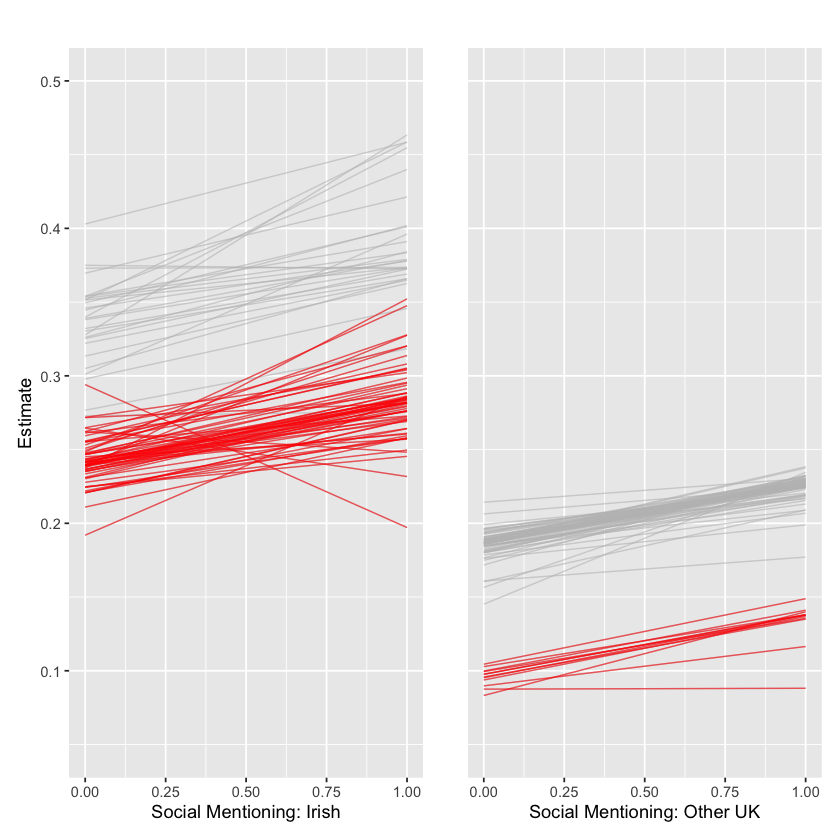

In [310]:
p <- f %>%filter(lateCentury == 0 & Canada == 0 & lowMonths == 0, 
                   Weather == 0, Money == 0, Farming == 0, People == 0, Setting == 0,
                  Contemplation == 0, Family == 0, Travel == 0, Difficulty == 0, Government == 0,
                  fppAllRate.s == 0, Irish == 1)

p0 <- p %>% ggplot( aes(x=mentsRate.s, y=Estimate, group=factor(docauthorid), color=factor(Female))) +
    geom_line(alpha = .6, size = .4)+
#geom_jitter(alpha = .4, size = 2, width = .25)+
#  scale_x_discrete(labels=c("0" = "Other UK", "1" = "Irish"))+
#ylab("")+ 
xlab("Social Mentioning: Irish")+ 
scale_color_manual(values = c("red"))+
theme(legend.position = "none", legend.title = element_blank())+
ylim(.05, .5)+
ggtitle("")+
gghighlight(Female == 1)#+
#gghighlight(docauthorid == "IED0451")

p <- f %>%filter(lateCentury == 0 & Canada == 0 & lowMonths == 0, 
                   Weather == 0, Money == 0, Farming == 0, People == 0, Setting == 0,
                  Contemplation == 0, Family == 0, Travel == 0, Difficulty == 0, Government == 0,
                  fppAllRate.s == 0, Irish == 0)

p1 <- p %>% ggplot( aes(x=mentsRate.s, y=Estimate, group=factor(docauthorid), color=factor(Female))) +
    geom_line(alpha = .6, size = .4)+
#geom_jitter(alpha = .4, size = 2, width = .25)+
#  scale_x_discrete(labels=c("0" = "Other UK", "1" = "Irish"))+
ylab("")+ 
xlab("Social Mentioning: Other UK")+ 
scale_color_manual(values = c("red"))+
theme(legend.position = "none", legend.title = element_blank(), axis.text.y = element_blank(), axis.ticks.y = element_blank())+
ylim(.05, .5)+
ggtitle("")+
gghighlight(Female == 1)


p0 & p1

ggsave("20250428_PhD_SocMenRan.jpg")

In [128]:
p <- f %>%filter(lateCentury == 0 & Canada == 0 & lowMonths == 0, 
                   Weather == 0, Money == 0, Farming == 0, People == 0, Setting == 0,
                  Contemplation == 0, Family == 0, Travel == 0, Difficulty == 0, Government == 0,
                  fppAllRate.s == 0)

on <- p %>%
filter(mentsRate.s == 1) %>%
select(docauthorid, Estimate, mentsRate.s, Female, Irish) %>%
arrange(docauthorid)%>%
rename(idOn = 1, EstOn= 2)

off <- p %>%
filter(mentsRate.s == 0) %>%
select(docauthorid, Estimate, mentsRate.s, Female, Irish) %>%
arrange(docauthorid) %>%
rename(idOff = 1, EstOff = 2)

combined <- cbind(on, off)[,c(1:2, 4:5, 7)]
#combined <- cbind(on, off)
#combined$idOn == combined$idOff

idsO <- combined %>%
mutate(diff = EstOff - EstOn)%>%
arrange(desc(diff))%>%
filter(diff > 0)%>%
#slice(1:2)#%>%
pull(idOn)

combined %>%
mutate(diff = EstOff - EstOn)%>%
arrange(desc(diff))%>%
filter(diff > 0)%>% # These are writers who have a negative slope. The greatest is Jane Fleming.
arrange(desc(diff))

#idsO

df[df$docauthorid %in% idsO,] %>% select(docauthorid, authorName, nationalOrigin, authorGender, U, M, S, F, L) %>% unique()

#combined[combined$EstOff > combined$EstOn,]

idOn,EstOn,Female,Irish,EstOff,diff
<fct>,<dbl>,<fct>,<fct>,<dbl>,<dbl>
IED0451,0.1971289,1,1,0.2940812,0.096952269
IED0107,0.2317255,1,1,0.2645772,0.032851709
IED0078,0.2482428,1,1,0.2620978,0.013855038
IED0374,0.3725675,0,1,0.3749839,0.002416396


,docauthorid,authorName,nationalOrigin,authorGender,U,M,S,F,L
,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>
1,IED0107,Isabella Weir Moore,Irish,F,NA,NA,NA,NA,NA
42,IED0451,Jane Fleming,Irish,F,NA,NA,NA,NA,NA
87,IED0374,Jonathan W. Smith,Irish,M,NA,NA,NA,NA,NA
758,IED0078,Anne J. Walters,Irish,F,NA,NA,NA,NA,NA


Warning message:
“Tried to calculate with group_by(), but the calculation failed.
Falling back to ungrouped filter operation...”
Warning message:
“Tried to calculate with group_by(), but the calculation failed.
Falling back to ungrouped filter operation...”


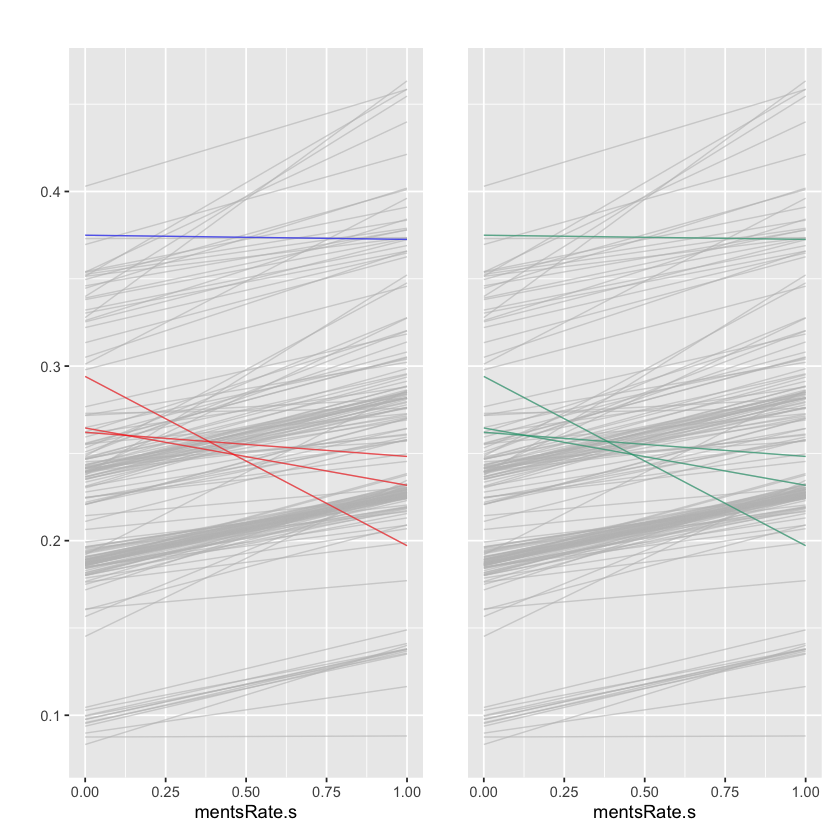

In [130]:
p0 <- p %>% ggplot( aes(x=mentsRate.s, y=Estimate, group=factor(docauthorid), color=factor(Irish))) +
    geom_line(alpha = .6, size = .4)+
#geom_jitter(alpha = .4, size = 2, width = .25)+
#  scale_x_discrete(labels=c("0" = "Other UK", "1" = "Irish"))+
ylab("")+ 
xlab("mentsRate.s")+ 
scale_color_manual(values = c("#009E73"))+ # gghighlight authors
#scale_color_manual(values = c("red"))+ # gghighlight women
theme(legend.position = "none", legend.title = element_blank(), axis.text.y = element_blank(), axis.ticks.y = element_blank())+
#ylim(-.1, .7)+
ggtitle("")+
gghighlight(docauthorid %in% idsO)
#gghighlight(Female == 1)

p1 <- p %>% ggplot( aes(x=mentsRate.s, y=Estimate, group=factor(docauthorid), color=factor(Female))) +
    geom_line(alpha = .6, size = .4)+
#geom_jitter(alpha = .4, size = 2, width = .25)+
#  scale_x_discrete(labels=c("0" = "Other UK", "1" = "Irish"))+
ylab("")+ 
xlab("mentsRate.s")+ 
scale_color_manual(values = c("blue", "red"))+ # gghighlight authors
#scale_color_manual(values = c("red"))+ # gghighlight women
theme(legend.position = "none", legend.title = element_blank())+
#ylim(-.1, .7)+
ggtitle("")+
gghighlight(docauthorid %in% idsO)
#gghighlight(Female == 1)

p1 & p0

In [132]:
# Most typical

ids <- ranef(f5ppSFIxLClMsSocSelTopIS, probs = c(.05, .95))$docauthorid[,,"mentsRate.s"]%>%
data.frame()%>%
arrange(abs(Estimate))%>%
slice(1:10)

ids

df[df$docauthorid %in% rownames(ids),] %>% 
select(docauthorid, authorName, nationalOrigin, authorGender) %>% 
unique() %>%
arrange(ids)


,Estimate,Est.Error,Q5,Q95
,<dbl>,<dbl>,<dbl>,<dbl>
per0004551,0.0001005297,0.05665591,-0.09288226,0.09436221
per0036385,-0.0001668516,0.05892315,-0.09738740,0.09814051
per0004486,-0.0002002451,0.05793727,-0.09581707,0.09314637
IED0099,-0.0002489858,0.05808768,-0.09495764,0.09484938
IED0037,0.0003199469,0.03599023,-0.05947110,0.05983345
per0035059,0.0003577234,0.05644911,-0.09196781,0.09116174
per0004549,-0.0004012110,0.05901753,-0.09709776,0.09657617
per0027086,-0.0004666981,0.05704689,-0.09387722,0.09211355
per0029195,0.0004692870,0.05651029,-0.09428326,0.09260008


docauthorid,authorName,nationalOrigin,authorGender
<fct>,<fct>,<fct>,<fct>
per0029195,NA,Scottish,M
per0027086,NA,English,M
per0004486,Samuel Roberts,Welsh,M
IED0661,Mary Cumming,Irish,F
IED0037,Agnes Shakespeare,Irish,F
IED0099,Aunt Dollie,Irish,F
per0004549,Ann Ellis,Welsh,F
per0004551,Rees Llewellyn,Welsh,M
per0036385,NA,Scottish,M


In [133]:
p <- f %>%filter(lateCentury == 0 & Canada == 0 & lowMonths == 0, 
                   Weather == 0, Money == 0, Farming == 0, People == 0, Setting == 0,
                  Contemplation == 0, Family == 0, Travel == 0, Difficulty == 0, Government == 0,
                  fppAllRate.s == 0)

on <- p %>%
filter(mentsRate.s == 1) %>%
select(docauthorid, Estimate, mentsRate.s, Female, Irish) %>%
arrange(docauthorid)%>%
rename(idOn = 1, EstOn= 2)

off <- p %>%
filter(mentsRate.s == 0) %>%
select(docauthorid, Estimate, mentsRate.s, Female, Irish) %>%
arrange(docauthorid) %>%
rename(idOff = 1, EstOff = 2)

combined <- cbind(on, off)[,c(1:2, 4:5, 7)]
#combined
#combined$idOn == combined$idOff

idsO <- combined %>%
mutate(diff = abs(EstOff - EstOn))%>%
arrange(desc(diff))%>%
filter(diff >= .1)%>%
#slice(1:2)#%>%
pull(idOn)

combined %>%
mutate(diff = abs(EstOff - EstOn))%>%
arrange(desc(diff))%>%
filter(diff >= .1)%>% # These are writers with effects over .1 -- all positive. 
arrange(desc(diff))

#idsO

df[df$docauthorid %in% idsO,] %>% select(docauthorid, authorName, nationalOrigin, authorGender) %>% unique()

idOn,EstOn,Female,Irish,EstOff,diff
<fct>,<dbl>,<fct>,<fct>,<dbl>,<dbl>
IED1059,0.4633400,0,1,0.3277563,0.1355837
IED0403,0.4546350,0,1,0.3398507,0.1147844
IED0657,0.3521926,1,1,0.2374861,0.1147066
IED0958,0.4585990,0,1,0.3514510,0.1071480


,docauthorid,authorName,nationalOrigin,authorGender
,<fct>,<fct>,<fct>,<fct>
7,IED0958,William J. Weir,Irish,M
26,IED0657,May Ann Blair,Irish,F
53,IED0403,James Gamble,Irish,M
233,IED1059,William Porter,Irish,M


Warning message:
“Tried to calculate with group_by(), but the calculation failed.
Falling back to ungrouped filter operation...”
Warning message:
“Tried to calculate with group_by(), but the calculation failed.
Falling back to ungrouped filter operation...”


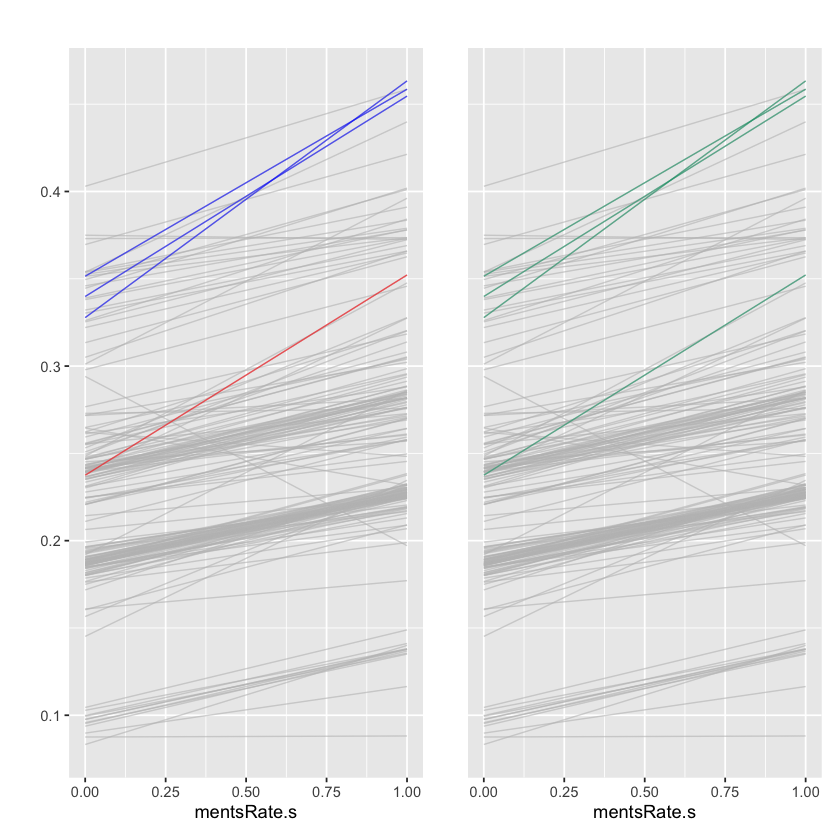

In [134]:
p0 <- p %>% ggplot( aes(x=mentsRate.s, y=Estimate, group=factor(docauthorid), color=factor(Irish))) +
    geom_line(alpha = .6, size = .4)+
#geom_jitter(alpha = .4, size = 2, width = .25)+
#  scale_x_discrete(labels=c("0" = "Other UK", "1" = "Irish"))+
ylab("")+ 
xlab("mentsRate.s")+ 
scale_color_manual(values = c("#009E73"))+ # gghighlight authors
#scale_color_manual(values = c("red"))+ # gghighlight women
theme(legend.position = "none", legend.title = element_blank(), axis.text.y = element_blank(), axis.ticks.y = element_blank())+
#ylim(-.1, .7)+
ggtitle("")+
gghighlight(docauthorid %in% idsO)
#gghighlight(Female == 1)

p1 <- p %>% ggplot( aes(x=mentsRate.s, y=Estimate, group=factor(docauthorid), color=factor(Female))) +
    geom_line(alpha = .6, size = .4)+
#geom_jitter(alpha = .4, size = 2, width = .25)+
#  scale_x_discrete(labels=c("0" = "Other UK", "1" = "Irish"))+
ylab("")+ 
xlab("mentsRate.s")+ 
scale_color_manual(values = c("blue", "red"))+ # gghighlight authors
#scale_color_manual(values = c("red"))+ # gghighlight women
theme(legend.position = "none", legend.title = element_blank())+
#ylim(-.1, .7)+
ggtitle("")+
gghighlight(docauthorid %in% idsO)
#gghighlight(Female == 1)

p1 & p0

### Self-Referencing

Warning message:
“Tried to calculate with group_by(), but the calculation failed.
Falling back to ungrouped filter operation...”
Warning message:
“Tried to calculate with group_by(), but the calculation failed.
Falling back to ungrouped filter operation...”
Saving 7 x 7 in image


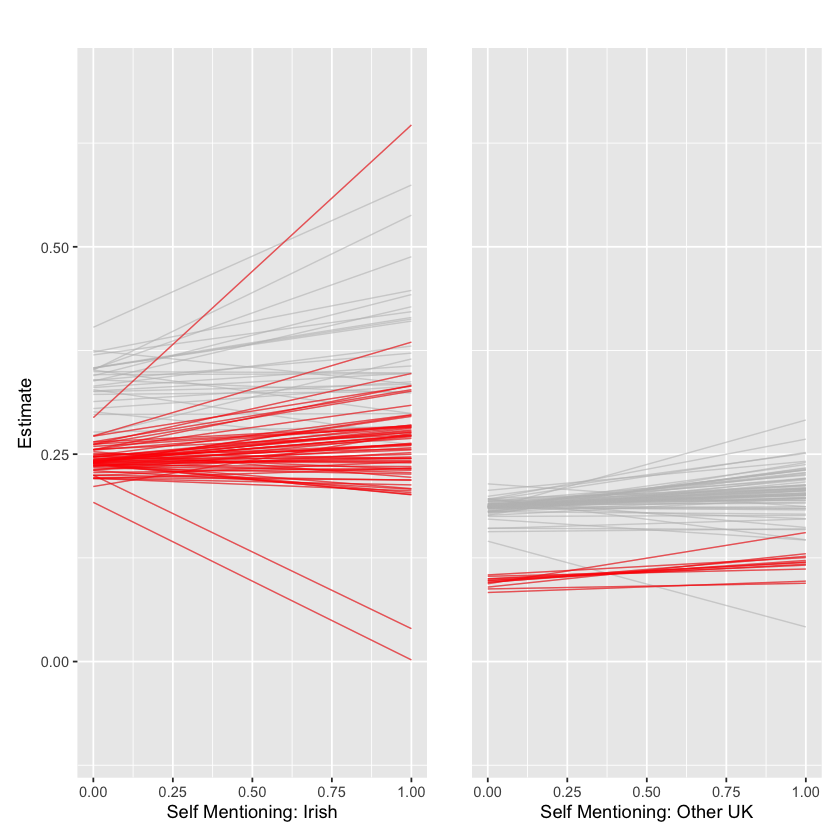

In [311]:
p <- f %>%filter(lateCentury == 0 & Canada == 0 & lowMonths == 0, 
                   Weather == 0, Money == 0, Farming == 0, People == 0, Setting == 0,
                  Contemplation == 0, Family == 0, Travel == 0, Difficulty == 0, Government == 0,
                  mentsRate.s == 0, Irish == 1)

p0 <- p %>% ggplot( aes(x=fppAllRate.s, y=Estimate, group=factor(docauthorid), color=factor(Female))) +
    geom_line(alpha = .6, size = .4)+
#geom_jitter(alpha = .4, size = 2, width = .25)+
#  scale_x_discrete(labels=c("0" = "Other UK", "1" = "Irish"))+
#ylab("")+ 
xlab("Self Mentioning: Irish")+ 
#scale_color_manual(values = c("blue","red"))+ # gghighlight authors
scale_color_manual(values = c("red"))+ # gghighlight women
theme(legend.position = "none", legend.title = element_blank())+
ylim(-.1, .7)+
ggtitle("")+
gghighlight(Female == 1)
#gghighlight(docauthorid == "IED0451")
#gghighlight(docauthorid %in% idsI)

p <- f %>%filter(lateCentury == 0 & Canada == 0 & lowMonths == 0, 
                   Weather == 0, Money == 0, Farming == 0, People == 0, Setting == 0,
                  Contemplation == 0, Family == 0, Travel == 0, Difficulty == 0, Government == 0,
                  mentsRate.s == 0, Irish == 0)

p1 <- p %>% ggplot( aes(x=fppAllRate.s, y=Estimate, group=factor(docauthorid), color=factor(Female))) +
    geom_line(alpha = .6, size = .4)+
#geom_jitter(alpha = .4, size = 2, width = .25)+
#  scale_x_discrete(labels=c("0" = "Other UK", "1" = "Irish"))+
ylab("")+ 
xlab("Self Mentioning: Other UK")+ 
#scale_color_manual(values = c("blue", "red"))+ # gghighlight authors
scale_color_manual(values = c("red"))+ # gghighlight women
theme(legend.position = "none", legend.title = element_blank(), axis.text.y = element_blank(), axis.ticks.y = element_blank())+
ylim(-.1, .7)+
ggtitle("")+
#gghighlight(docauthorid %in% idsO)
gghighlight(Female == 1)


p0 & p1

ggsave("20250428_PhD_SelRefRan.jpg")

In [136]:
p <- f %>%filter(lateCentury == 0 & Canada == 0 & lowMonths == 0, 
                   Weather == 0, Money == 0, Farming == 0, People == 0, Setting == 0,
                  Contemplation == 0, Family == 0, Travel == 0, Difficulty == 0, Government == 0,
                  mentsRate.s == 0)

on <- p %>%
filter(fppAllRate.s == 1) %>%
select(docauthorid, Estimate, mentsRate.s, Female, Irish) %>%
arrange(docauthorid)%>%
rename(idOn = 1, EstOn= 2)

off <- p %>%
filter(fppAllRate.s == 0) %>%
select(docauthorid, Estimate, mentsRate.s, Female, Irish) %>%
arrange(docauthorid) %>%
rename(idOff = 1, EstOff = 2)

combined <- cbind(on, off)[,c(1:2, 4:5, 7)]
#combined <- cbind(on, off)
#combined$idOn == combined$idOff

idsO <- combined %>%
mutate(diff = EstOff - EstOn)%>%
arrange(desc(diff))%>%
filter(diff > 0)%>%
#slice(1:2)#%>%
pull(idOn)

combined %>%
mutate(diff = EstOff - EstOn)%>%
arrange(desc(diff))%>%
filter(diff > 0)%>% # These are writers who have a negative slope.
arrange(desc(diff))

#idsO

df[df$docauthorid %in% idsO,] %>% select(docauthorid, authorName, nationalOrigin, authorGender) %>% unique()

#combined[combined$EstOff > combined$EstOn,]

idOn,EstOn,Female,Irish,EstOff,diff
<fct>,<dbl>,<fct>,<fct>,<dbl>,<dbl>
IED0130,0.00199623,1,1,0.1919445,0.1899483102
IED0838,0.03964504,1,1,0.2247825,0.1851374181
per0014266,0.04173781,0,0,0.1451567,0.1034189094
IED1059,0.27242703,0,1,0.3277563,0.0553292798
IED0958,0.29902181,0,1,0.3514510,0.0524292196
per0025580,0.14683051,0,0,0.1963362,0.0495057011
IED0374,0.33450587,0,1,0.3749839,0.0404780030
IED0233,0.26175461,0,1,0.3010952,0.0393405576
IED0276,0.20102266,1,1,0.2381204,0.0370977620


,docauthorid,authorName,nationalOrigin,authorGender
,<fct>,<fct>,<fct>,<fct>
5,IED0621,Mary Savage,Irish,F
7,IED0958,William J. Weir,Irish,M
12,IED0314,Isabella Marshall Allen,Irish,F
26,IED0657,May Ann Blair,Irish,F
32,IED0212,Ellen S. Dunlop,Irish,F
47,IED0572,Joseph Carswell,Irish,M
53,IED0403,James Gamble,Irish,M
73,IED0075,Annie Wyly,Irish,F
77,IED0070,Ann Jane Sinclair,Irish,F


Warning message:
“Tried to calculate with group_by(), but the calculation failed.
Falling back to ungrouped filter operation...”
Warning message:
“Tried to calculate with group_by(), but the calculation failed.
Falling back to ungrouped filter operation...”


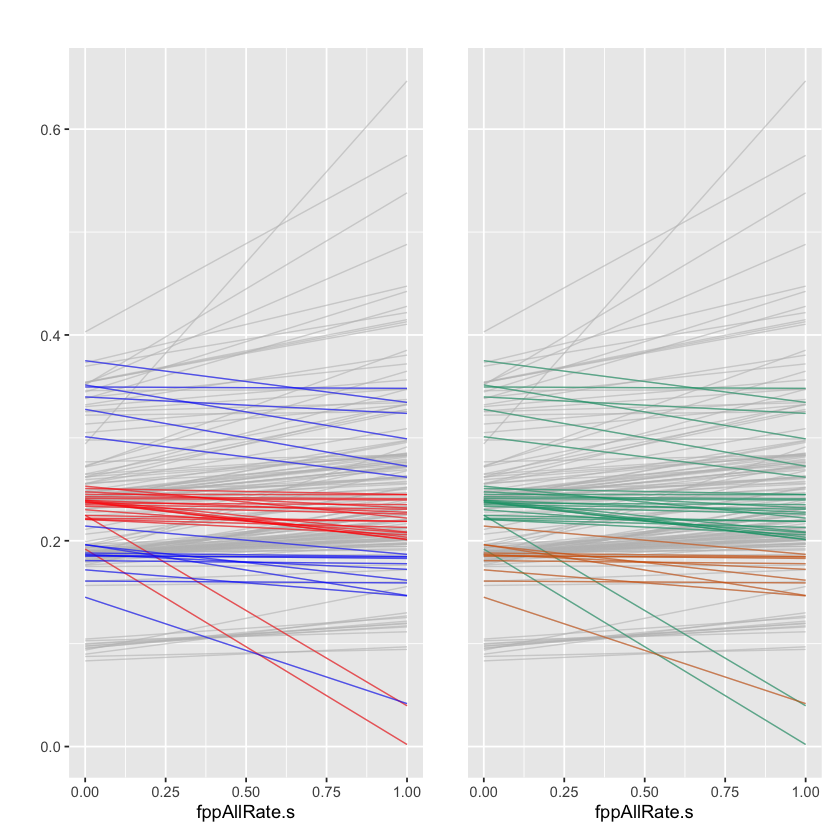

In [138]:
p0 <- p %>% ggplot( aes(x=fppAllRate.s, y=Estimate, group=factor(docauthorid), color=factor(Irish))) +
    geom_line(alpha = .6, size = .4)+
#geom_jitter(alpha = .4, size = 2, width = .25)+
#  scale_x_discrete(labels=c("0" = "Other UK", "1" = "Irish"))+
ylab("")+ 
xlab("fppAllRate.s")+ 
scale_color_manual(values = c("#D55E00", "#009E73"))+ # gghighlight authors
#scale_color_manual(values = c("red"))+ # gghighlight women
theme(legend.position = "none", legend.title = element_blank(), axis.text.y = element_blank(), axis.ticks.y = element_blank())+
#ylim(-.1, .7)+
ggtitle("")+
gghighlight(docauthorid %in% idsO)
#gghighlight(Female == 1)

p1 <- p %>% ggplot( aes(x=fppAllRate.s, y=Estimate, group=factor(docauthorid), color=factor(Female))) +
    geom_line(alpha = .6, size = .4)+
#geom_jitter(alpha = .4, size = 2, width = .25)+
#  scale_x_discrete(labels=c("0" = "Other UK", "1" = "Irish"))+
ylab("")+ 
xlab("fppAllRate.s")+ 
scale_color_manual(values = c("blue", "red"))+ # gghighlight authors
#scale_color_manual(values = c("red"))+ # gghighlight women
theme(legend.position = "none", legend.title = element_blank())+
#ylim(-.1, .7)+
ggtitle("")+
gghighlight(docauthorid %in% idsO)
#gghighlight(Female == 1)

p1 & p0

In [142]:
# Most typical

ids <- ranef(f5ppSFIxLClMsSocSelTopIS, probs = c(.05, .95))$docauthorid[,,"fppAllRate.s"]%>%
data.frame()%>%
arrange(abs(Estimate))%>%
slice(1:10)

ids

df[df$docauthorid %in% rownames(ids),] %>% 
select(docauthorid, authorName, nationalOrigin, authorGender) %>% 
unique() %>%
arrange(ids)


,Estimate,Est.Error,Q5,Q95
,<dbl>,<dbl>,<dbl>,<dbl>
IED0123,-0.0001760269,0.08665389,-0.14196954,0.14520327
IED0182,0.0002751723,0.08467881,-0.13519727,0.14127611
per0036385,0.0002785110,0.08824095,-0.14672840,0.14476227
per0035344,0.0005526629,0.08488248,-0.14084846,0.13709296
per0004486,-0.0006988953,0.08684975,-0.14492142,0.14323706
IED0587,-0.0008553975,0.08825093,-0.14477443,0.14444395
per0004772,-0.0009597362,0.02101916,-0.03495423,0.03363705
per0027086,-0.0010646884,0.08609429,-0.13943743,0.14192261
IED0636,0.0012169262,0.09212052,-0.14874547,0.15183664


docauthorid,authorName,nationalOrigin,authorGender
<fct>,<fct>,<fct>,<fct>
per0036385,NA,Scottish,M
per0004486,Samuel Roberts,Welsh,M
per0035344,Margaret Bebb,Welsh,F
per0004772,Susannah Strickland Moodie,English,F
IED0123,Charles Martin,Irish,M
IED0182,Edith,Irish,F
IED0587,Lena,Irish,F
IED0636,Margaret Emily Kells,Irish,F
IED0650,Mary,Irish,F


In [153]:
p <- f %>%filter(lateCentury == 0 & Canada == 0 & lowMonths == 0, 
                   Weather == 0, Money == 0, Farming == 0, People == 0, Setting == 0,
                  Contemplation == 0, Family == 0, Travel == 0, Difficulty == 0, Government == 0,
                  mentsRate.s == 0)

p$Female[p$docauthorid == "IED0211"] <- 0

on <- p %>%
filter(fppAllRate.s == 1) %>%
select(docauthorid, Estimate, mentsRate.s, Female, Irish) %>%
arrange(docauthorid)%>%
rename(idOn = 1, EstOn= 2)

off <- p %>%
filter(fppAllRate.s == 0) %>%
select(docauthorid, Estimate, mentsRate.s, Female, Irish) %>%
arrange(docauthorid) %>%
rename(idOff = 1, EstOff = 2)

combined <- cbind(on, off)[,c(1:2, 4:5, 7)]
#combined
#combined$idOn == combined$idOff

idsO <- combined %>%
mutate(diff = abs(EstOff - EstOn))%>%
arrange(desc(diff))%>%
filter(diff >= .1)%>%
#slice(1:2)#%>%
pull(idOn)

combined %>%
mutate(diff = abs(EstOff - EstOn))%>%
arrange(desc(diff))%>%
filter(diff >= .1)%>% # These are writers with effects over .1 
arrange(desc(diff))

#idsO

df[df$docauthorid %in% idsO,] %>% select(docauthorid, authorName, nationalOrigin, authorGender) %>% unique()

idOn,EstOn,Female,Irish,EstOff,diff
<fct>,<dbl>,<fct>,<fct>,<dbl>,<dbl>
IED0451,0.64689044,1,1,0.2940812,0.3528092
IED0130,0.00199623,1,1,0.1919445,0.1899483
IED0089.89,0.53810503,0,1,0.3514434,0.1866616
IED0838,0.03964504,1,1,0.2247825,0.1851374
per0026978a,0.57450738,0,1,0.4029724,0.1715350
IED0768,0.48805060,0,1,0.3525621,0.1354885
IED0032,0.38513269,1,1,0.2718835,0.1132492
per0029174,0.29125090,0,0,0.1839856,0.1072653
per0014266,0.04173781,0,0,0.1451567,0.1034189


,docauthorid,authorName,nationalOrigin,authorGender
,<fct>,<fct>,<fct>,<fct>
42,IED0451,Jane Fleming,Irish,F
199,IED0838,Ruth J. Ramsey,Irish,F
447,IED0130,Catherine Fitzgerald,Irish,F
508,IED0768,Robert Anderson,Irish,M
635,IED0032,Ada M. Demain,Irish,F
859,IED0089.89,Henry Jim Keenan,Irish,M
1815,per0014266,Thomas Turnbull,Scottish,M
1829,per0026978a,Nathaniel Carrothers,Irish,M
2089,per0029174,George Menzies,Scottish,M


Warning message:
“Tried to calculate with group_by(), but the calculation failed.
Falling back to ungrouped filter operation...”
Warning message:
“Tried to calculate with group_by(), but the calculation failed.
Falling back to ungrouped filter operation...”


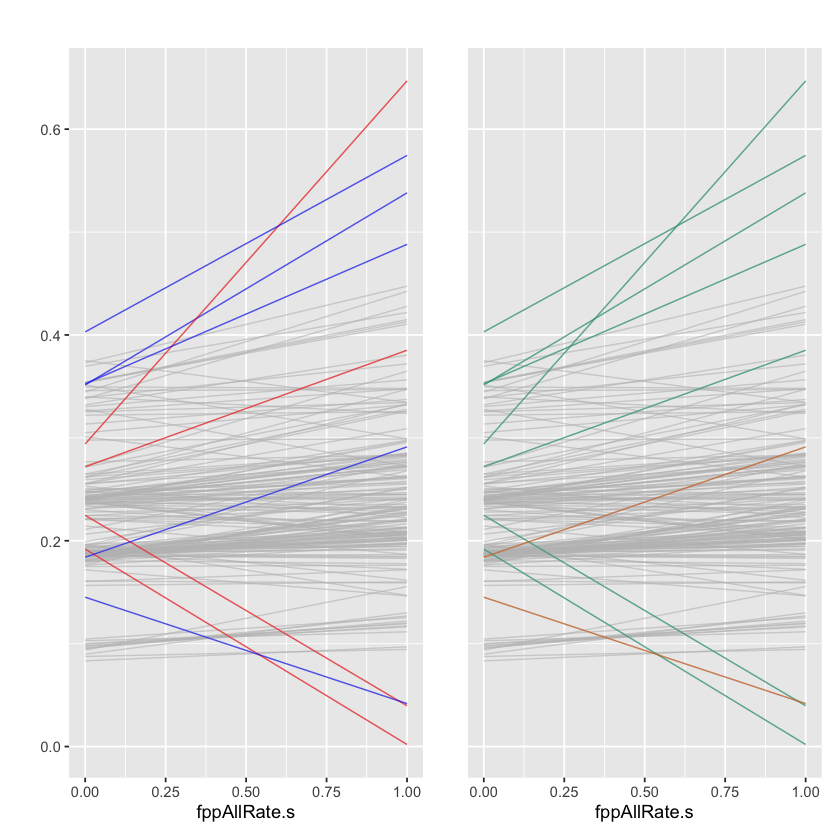

In [154]:
p0 <- p %>% ggplot( aes(x=fppAllRate.s, y=Estimate, group=factor(docauthorid), color=factor(Irish))) +
    geom_line(alpha = .6, size = .4)+
#geom_jitter(alpha = .4, size = 2, width = .25)+
#  scale_x_discrete(labels=c("0" = "Other UK", "1" = "Irish"))+
ylab("")+ 
xlab("fppAllRate.s")+ 
scale_color_manual(values = c("#D55E00", "#009E73"))+ # gghighlight authors
#scale_color_manual(values = c("red"))+ # gghighlight women
theme(legend.position = "none", legend.title = element_blank(), axis.text.y = element_blank(), axis.ticks.y = element_blank())+
#ylim(-.1, .7)+
ggtitle("")+
gghighlight(docauthorid %in% idsO)
#gghighlight(Female == 1)

p1 <- p %>% ggplot( aes(x=fppAllRate.s, y=Estimate, group=factor(docauthorid), color=factor(Female))) +
    geom_line(alpha = .6, size = .4)+
#geom_jitter(alpha = .4, size = 2, width = .25)+
#  scale_x_discrete(labels=c("0" = "Other UK", "1" = "Irish"))+
ylab("")+ 
xlab("fppAllRate.s")+ 
scale_color_manual(values = c("blue", "red"))+ # gghighlight authors
#scale_color_manual(values = c("red"))+ # gghighlight women
theme(legend.position = "none", legend.title = element_blank())+
#ylim(-.1, .7)+
ggtitle("")+
gghighlight(docauthorid %in% idsO)
#gghighlight(Female == 1)

p1 & p0

### Topics

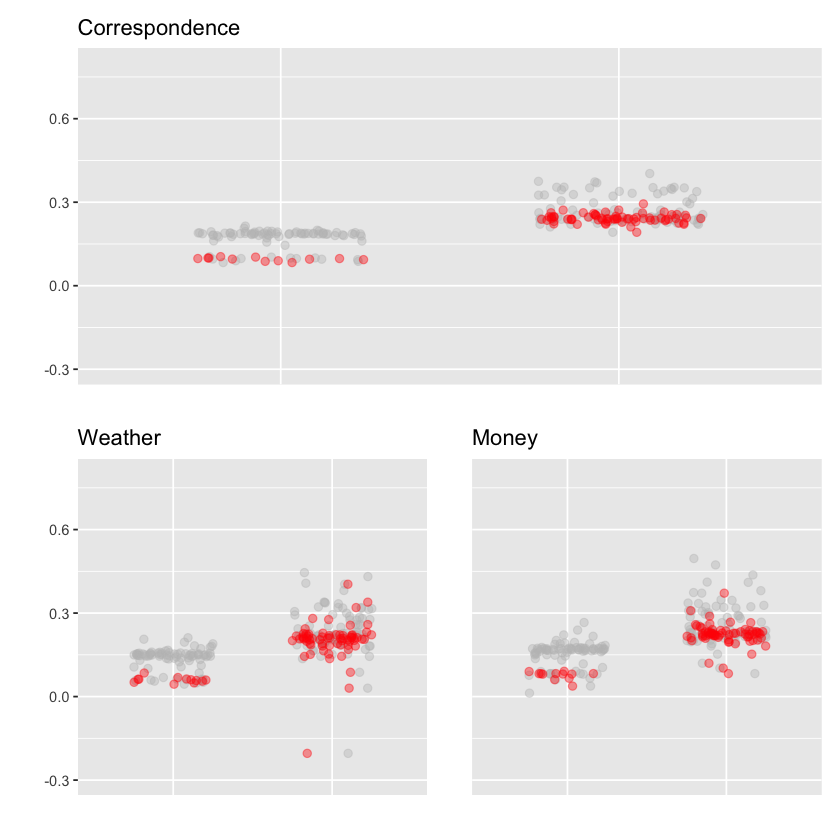

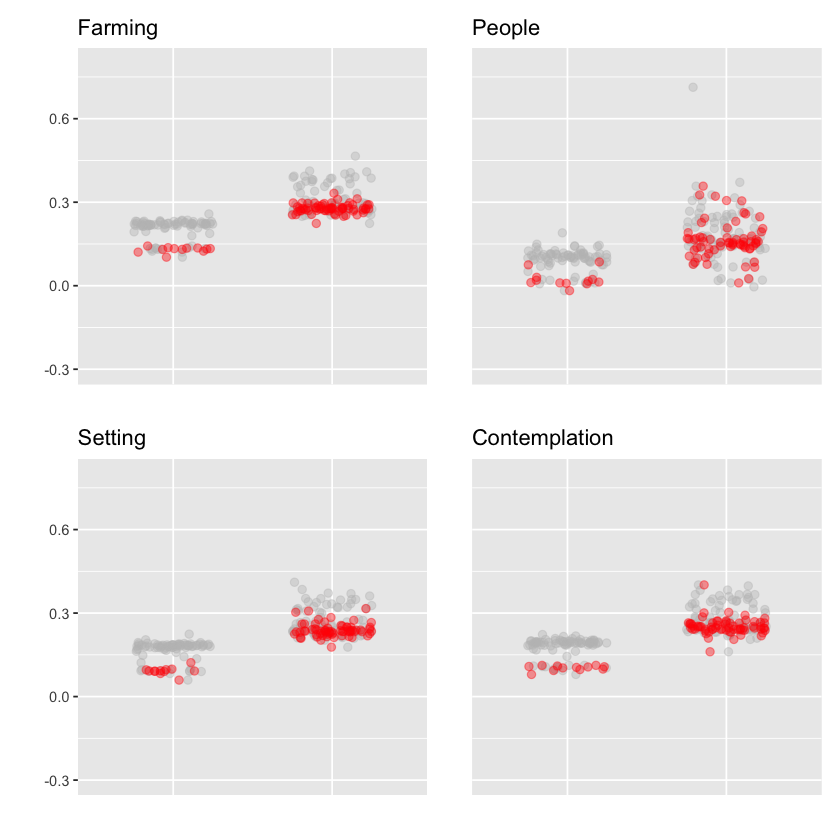

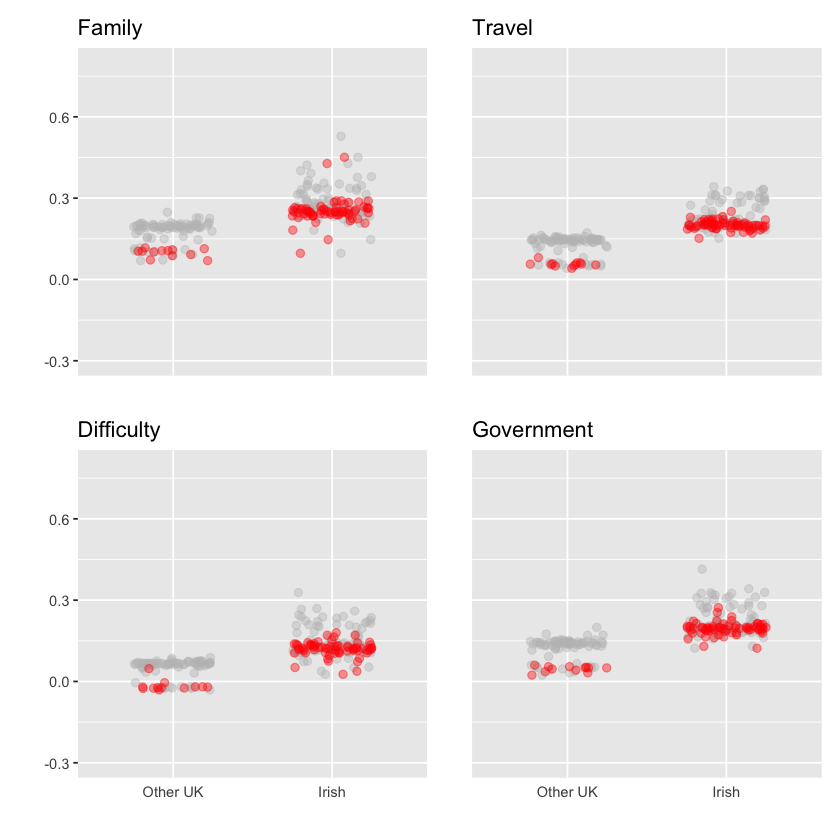

In [143]:
f$Female[f$docauthorid == "IED0211"] <- 0

p <- f %>%filter(lateCentury == 0 & Canada == 0 & lowMonths == 0, 
                   Weather == 0, Money == 0, Farming == 0, People == 0, Setting == 0,
                  Contemplation == 0, Family == 0, Travel == 0, Difficulty == 0, Government == 0,
                  mentsRate.s == 0, fppAllRate.s == 0)

p0 <- p %>% ggplot( aes(x=factor(Irish), y=Estimate, group=factor(docauthorid), color=factor(Female))) +
geom_jitter(alpha = .4, size = 2, width = .25)+
  scale_x_discrete(labels=c("0" = "Other UK", "1" = "Irish"))+
xlab("")+ 
ylab("")+
scale_color_manual(values = c("red"))+
theme(legend.position = "none", legend.title = element_blank(), 
      axis.ticks.x = element_blank(), axis.text.x = element_blank())+
ylim(-.3, .8)+
ggtitle("Correspondence")+
gghighlight(Female == 1)

p <- f %>%filter(lateCentury == 0 & Canada == 0 & lowMonths == 0, 
                   Weather == 1, Money == 0, Farming == 0, People == 0, Setting == 0,
                  Contemplation == 0, Family == 0, Travel == 0, Difficulty == 0, Government == 0,
                  mentsRate.s == 0, fppAllRate.s == 0)

p1 <- p %>% ggplot( aes(x=factor(Irish), y=Estimate, group=factor(docauthorid), color=factor(Female))) +
geom_jitter(alpha = .4, size = 2, width = .25)+
  scale_x_discrete(labels=c("0" = "Other UK", "1" = "Irish"))+
xlab("")+ 
ylab("")+
scale_color_manual(values = c("red"))+
theme(legend.position = "none", legend.title = element_blank(), 
      axis.ticks.x = element_blank(), axis.text.x = element_blank())+
ylim(-.3, .8)+
ggtitle("Weather")+
gghighlight(Female == 1)

p <- f %>%filter(lateCentury == 0 & Canada == 0 & lowMonths == 0, 
                   Weather == 0, Money == 1, Farming == 0, People == 0, Setting == 0,
                  Contemplation == 0, Family == 0, Travel == 0, Difficulty == 0, Government == 0,
                  mentsRate.s == 0, fppAllRate.s == 0)

p2 <- p %>% ggplot( aes(x=factor(Irish), y=Estimate, group=factor(docauthorid), color=factor(Female))) +
geom_jitter(alpha = .4, size = 2, width = .25)+
scale_x_discrete(labels=c("0" = "Other UK", "1" = "Irish"))+
xlab("")+ 
ylab("")+
scale_color_manual(values = c("red"))+
theme(legend.position = "none", legend.title = element_blank(), 
      axis.ticks.x = element_blank(), axis.text.x = element_blank(), 
      axis.ticks.y = element_blank(), axis.text.y = element_blank())+
ylim(-.3, .8)+
ggtitle("Money")+
gghighlight(Female == 1)

p <- f %>%filter(lateCentury == 0 & Canada == 0 & lowMonths == 0, 
                   Weather == 0, Money == 0, Farming == 1, People == 0, Setting == 0,
                  Contemplation == 0, Family == 0, Travel == 0, Difficulty == 0, Government == 0,
                  mentsRate.s == 0, fppAllRate.s == 0)

p3 <- p %>% ggplot( aes(x=factor(Irish), y=Estimate, group=factor(docauthorid), color=factor(Female))) +
geom_jitter(alpha = .4, size = 2, width = .25)+
  scale_x_discrete(labels=c("0" = "Other UK", "1" = "Irish"))+
xlab("")+ 
ylab("")+
scale_color_manual(values = c("red"))+
theme(legend.position = "none", legend.title = element_blank(), 
      axis.ticks.x = element_blank(), axis.text.x = element_blank())+
ylim(-.3, .8)+
ggtitle("Farming")+
ylab("")+
gghighlight(Female == 1)

p <- f %>%filter(lateCentury == 0 & Canada == 0 & lowMonths == 0, 
                   Weather == 0, Money == 0, Farming == 0, People == 1, Setting == 0,
                  Contemplation == 0, Family == 0, Travel == 0, Difficulty == 0, Government == 0,
                  mentsRate.s == 0, fppAllRate.s == 0)

p4 <- p %>% ggplot( aes(x=factor(Irish), y=Estimate, group=factor(docauthorid), color=factor(Female))) +
geom_jitter(alpha = .4, size = 2, width = .25)+
scale_x_discrete(labels=c("0" = "Other UK", "1" = "Irish"))+
xlab("")+ 
ylab("")+
scale_color_manual(values = c("red"))+
theme(legend.position = "none", legend.title = element_blank(), 
      axis.ticks.x = element_blank(), axis.text.x = element_blank(), 
      axis.ticks.y = element_blank(), axis.text.y = element_blank())+
ylim(-.3, .8)+
ggtitle("People")+
gghighlight(Female == 1)

p <- f %>%filter(lateCentury == 0 & Canada == 0 & lowMonths == 0, 
                   Weather == 0, Money == 0, Farming == 0, People == 0, Setting == 1,
                  Contemplation == 0, Family == 0, Travel == 0, Difficulty == 0, Government == 0,
                  mentsRate.s == 0, fppAllRate.s == 0)

p5 <- p %>% ggplot( aes(x=factor(Irish), y=Estimate, group=factor(docauthorid), color=factor(Female))) +
geom_jitter(alpha = .4, size = 2, width = .25)+
scale_x_discrete(labels=c("0" = "Other UK", "1" = "Irish"))+
xlab("")+ 
ylab("")+
scale_color_manual(values = c("red"))+
theme(legend.position = "none", legend.title = element_blank(), axis.ticks.x = element_blank(), axis.text.x = element_blank())+
ylim(-.3, .8)+
ggtitle("Setting")+
ylab("")+
gghighlight(Female == 1)

p <- f %>%filter(lateCentury == 0 & Canada == 0 & lowMonths == 0, 
                   Weather == 0, Money == 0, Farming == 0, People == 0, Setting == 0,
                  Contemplation == 1, Family == 0, Travel == 0, Difficulty == 0, Government == 0,
                  mentsRate.s == 0, fppAllRate.s == 0)

p6 <- p %>% ggplot( aes(x=factor(Irish), y=Estimate, group=factor(docauthorid), color=factor(Female))) +
geom_jitter(alpha = .4, size = 2, width = .25)+
scale_x_discrete(labels=c("0" = "Other UK", "1" = "Irish"))+
xlab("")+ 
ylab("")+
scale_color_manual(values = c("red"))+
theme(legend.position = "none", legend.title = element_blank(), 
      axis.ticks.x = element_blank(), axis.text.x = element_blank(), 
      axis.ticks.y = element_blank(), axis.text.y = element_blank())+
ylim(-.3, .8)+
ggtitle("Contemplation")+
ylab("")+
gghighlight(Female == 1)

p <- f %>%filter(lateCentury == 0 & Canada == 0 & lowMonths == 0, 
                   Weather == 0, Money == 0, Farming == 0, People == 0, Setting == 0,
                  Contemplation == 0, Family == 1, Travel == 0, Difficulty == 0, Government == 0,
                  mentsRate.s == 0, fppAllRate.s == 0)

p7 <- p %>% ggplot( aes(x=factor(Irish), y=Estimate, group=factor(docauthorid), color=factor(Female))) +
geom_jitter(alpha = .4, size = 2, width = .25)+
scale_x_discrete(labels=c("0" = "Other UK", "1" = "Irish"))+
xlab("")+ 
ylab("")+
scale_color_manual(values = c("red"))+
theme(legend.position = "none", legend.title = element_blank(), axis.ticks.x = element_blank(), axis.text.x = element_blank())+
ylim(-.3, .8)+
ggtitle("Family")+
gghighlight(Female == 1)

p <- f %>%filter(lateCentury == 0 & Canada == 0 & lowMonths == 0, 
                   Weather == 0, Money == 0, Farming == 0, People == 0, Setting == 0,
                  Contemplation == 0, Family == 0, Travel == 1, Difficulty == 0, Government == 0,
                  mentsRate.s == 0, fppAllRate.s == 0)

p8 <- p %>% ggplot( aes(x=factor(Irish), y=Estimate, group=factor(docauthorid), color=factor(Female))) +
geom_jitter(alpha = .4, size = 2, width = .25)+
scale_x_discrete(labels=c("0" = "Other UK", "1" = "Irish"))+
xlab("")+ 
ylab("")+
scale_color_manual(values = c("red"))+
theme(legend.position = "none", legend.title = element_blank(), 
      axis.ticks.x = element_blank(), axis.text.x = element_blank(), 
      axis.ticks.y = element_blank(), axis.text.y = element_blank())+
ylim(-.3, .8)+
ggtitle("Travel")+
gghighlight(Female == 1)

p <- f %>%filter(lateCentury == 0 & Canada == 0 & lowMonths == 0, 
                   Weather == 0, Money == 0, Farming == 0, People == 0, Setting == 0,
                  Contemplation == 0, Family == 0, Travel == 0, Difficulty == 1, Government == 0,
                  mentsRate.s == 0, fppAllRate.s == 0)

p9 <- p %>% ggplot( aes(x=factor(Irish), y=Estimate, group=factor(docauthorid), color=factor(Female))) +
geom_jitter(alpha = .4, size = 2, width = .25)+
scale_x_discrete(labels=c("0" = "Other UK", "1" = "Irish"))+
xlab("")+ 
ylab("")+
scale_color_manual(values = c("red"))+
theme(legend.position = "none", legend.title = element_blank(), axis.ticks.x = element_blank())+
ylim(-.3, .8)+
ggtitle("Difficulty")+
gghighlight(Female == 1)

p <- f %>%filter(lateCentury == 0 & Canada == 0 & lowMonths == 0, 
                   Weather == 0, Money == 0, Farming == 0, People == 0, Setting == 0,
                  Contemplation == 0, Family == 0, Travel == 0, Difficulty == 0, Government == 1,
                  mentsRate.s == 0, fppAllRate.s == 0)

p10 <- p %>% ggplot( aes(x=factor(Irish), y=Estimate, group=factor(docauthorid), color=factor(Female))) +
geom_jitter(alpha = .4, size = 2, width = .25)+
scale_x_discrete(labels=c("0" = "Other UK", "1" = "Irish"))+
xlab("")+ 
ylab("")+
scale_color_manual(values = c("red"))+
theme(legend.position = "none", legend.title = element_blank(), 
      axis.ticks.x = element_blank(), 
      axis.ticks.y = element_blank(), axis.text.y = element_blank())+
ylim(-.3, .8)+
ggtitle("Government")+
gghighlight(Female == 1)

p0 / (p1 | p2)
(p3 | p4) / (p5 | p6)
(p7 | p8) / (p9 | p10)
#ggsave("20250407_PhD_GenderRandoms.jpg")

### Weather

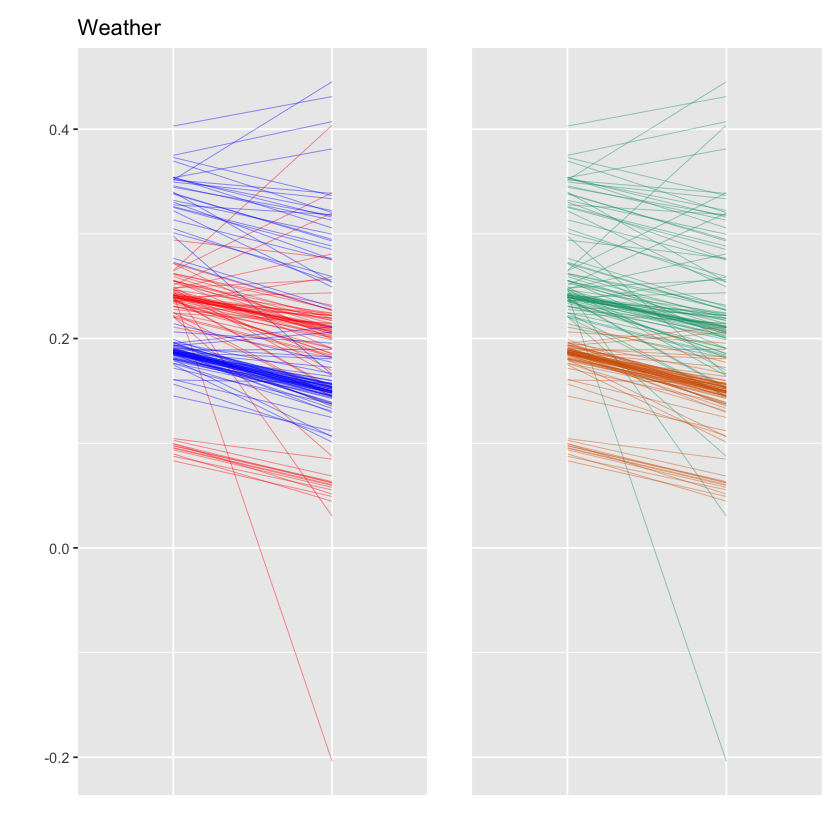

In [173]:
p <- f %>%filter(lateCentury == 0 & Canada == 0 & lowMonths == 0, 
                  Money == 0, Farming == 0, People == 0, Setting == 0,
                  Contemplation == 0, Family == 0, Travel == 0, Difficulty == 0, Government == 0,
                  mentsRate.s == 0, fppAllRate.s == 0)

p1 <- p %>% ggplot( aes(x=factor(Weather), y=Estimate, group=factor(docauthorid), color=factor(Female))) +
geom_line(alpha = .6, size = .2)+
#scale_x_discrete(labels=c("0" = "Correspondence", "1" = "Weather"))+
xlab("")+ 
ylab("")+
scale_color_manual(values = c("blue", "red"))+
theme(legend.position = "none", legend.title = element_blank(), 
      axis.ticks.x = element_blank(), axis.text.x = element_blank())+
#ylim(-.2, .45)+
ggtitle("Weather")#+
#gghighlight(Female == 1)

p2 <- p %>% ggplot( aes(x=factor(Weather), y=Estimate, group=factor(docauthorid), color=factor(Irish))) +
geom_line(alpha = .6, size = .2)+
#scale_x_discrete(labels=c("0" = "Correspondence", "1" = "Weather"))+
xlab("")+ 
ylab("")+
scale_color_manual(values = c("#D55E00", "#009E73"))+
theme(legend.position = "none", legend.title = element_blank(), 
      axis.ticks = element_blank(), axis.text.x = element_blank(), axis.text.y = element_blank())+
#ylim(-.2, .45)+
ggtitle("")#+
#gghighlight(Female == 1)

p1 & p2

In [174]:
p <- f %>%filter(lateCentury == 0 & Canada == 0 & lowMonths == 0, 
                  Money == 0, Farming == 0, People == 0, Setting == 0,
                  Contemplation == 0, Family == 0, Travel == 0, Difficulty == 0, Government == 0,
                  mentsRate.s == 0, fppAllRate.s == 0)

on <- p %>%
filter(Weather == 1) %>%
select(docauthorid, Estimate, Weather, Female, Irish) %>%
arrange(docauthorid)%>%
rename(idOn = 1, EstOn= 2)

off <- p %>%
filter(Weather == 0) %>%
select(docauthorid, Estimate, Weather, Female, Irish) %>%
arrange(docauthorid) %>%
rename(idOff = 1, EstOff = 2)

combined <- cbind(on, off)[,c(1:2, 4:5, 7)]
#combined
#combined$idOn == combined$idOff

combined %>%
mutate(diff = EstOn - EstOff)%>%
filter(diff > 0)%>% # These are writers who have a negative slope. The greatest is Jane Fleming.
arrange(desc(diff))

idsO <- combined %>%
mutate(diff = EstOn - EstOff)%>%
filter(diff > 0)%>% # These are writers who have a negative slope. The greatest is Jane Fleming.
arrange(desc(diff)) %>%
pull(idOn)

#idsO

df[df$docauthorid %in% idsO,] %>% select(docauthorid, authorName, nationalOrigin, authorGender) %>% unique()

idOn,EstOn,Female,Irish,EstOff,diff
<fct>,<dbl>,<fct>,<fct>,<dbl>,<dbl>
IED0072,0.4037301,1,1,0.2648203,0.1389098832
IED0958,0.4453561,0,1,0.3514510,0.0939050336
IED0107,0.3392915,1,1,0.2645772,0.0747143205
IED0635,0.3197905,1,1,0.2508527,0.0689377566
IED0885,0.2808165,1,1,0.2476808,0.0331357616
IED0374,0.4072288,0,1,0.3749839,0.0322449695
per0026978a,0.4311692,0,1,0.4029724,0.0281968591
per0026981,0.3811980,0,1,0.3536628,0.0275352209
IED0037,0.2587600,1,1,0.2351395,0.0236205117


,docauthorid,authorName,nationalOrigin,authorGender
,<fct>,<fct>,<fct>,<fct>
1,IED0107,Isabella Weir Moore,Irish,F
5,IED0621,Mary Savage,Irish,F
7,IED0958,William J. Weir,Irish,M
81,IED0037,Agnes Shakespeare,Irish,F
87,IED0374,Jonathan W. Smith,Irish,M
138,IED0692,Mitilda Ferguson,Irish,F
563,IED0885,Sarah Irvine,Irish,F
906,IED0635,Margret Johnston,Irish,F
913,IED0072,Anna Heather,Irish,F


Warning message:
“Tried to calculate with group_by(), but the calculation failed.
Falling back to ungrouped filter operation...”
Warning message:
“Tried to calculate with group_by(), but the calculation failed.
Falling back to ungrouped filter operation...”


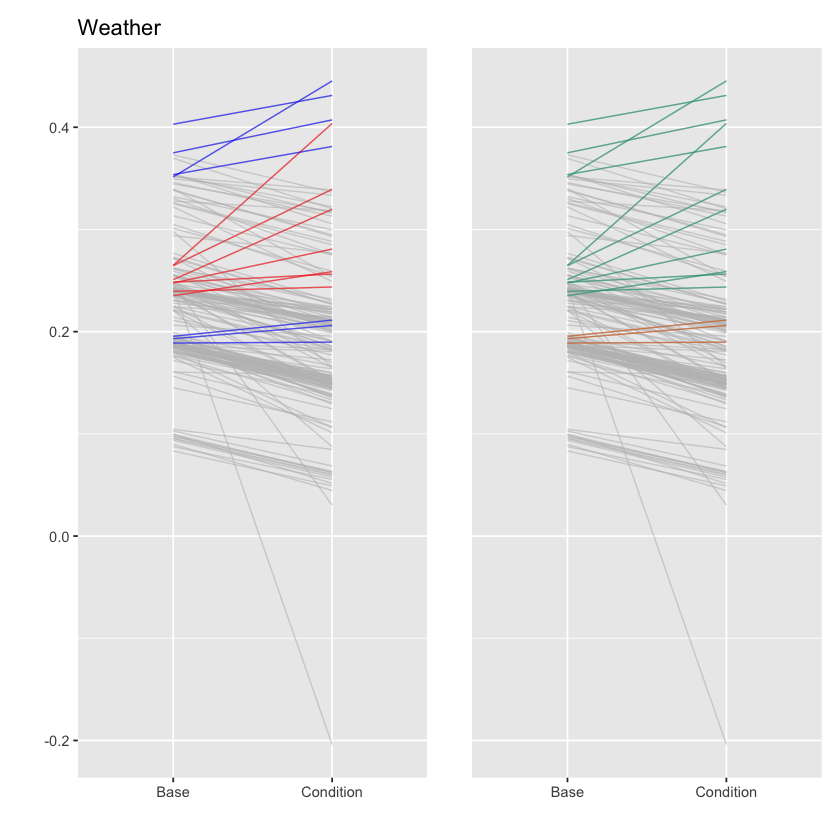

In [175]:
p1 <- p %>% ggplot( aes(x=Weather, y=Estimate, group=factor(docauthorid), color=factor(Female))) +
    geom_line(alpha = .6, size = .4)+
#geom_jitter(alpha = .4, size = 2, width = .25)+
  scale_x_discrete(labels=c("0" = "Base", "1" = "Condition"))+
ylab("")+ 
xlab("")+ 
scale_color_manual(values = c("blue", "red"))+ # gghighlight authors
#scale_color_manual(values = c("red"))+ # gghighlight women
theme(legend.position = "none", legend.title = element_blank())+
#ylim(-.1, .7)+
ggtitle("Weather")+
gghighlight(docauthorid %in% idsO)
#gghighlight(Female == 1)

p0 <- p %>% ggplot( aes(x=Weather, y=Estimate, group=factor(docauthorid), color=factor(Irish))) +
    geom_line(alpha = .6, size = .4)+
#geom_jitter(alpha = .4, size = 2, width = .25)+
  scale_x_discrete(labels=c("0" = "Base", "1" = "Condition"))+
ylab("")+ 
xlab("")+ 
scale_color_manual(values = c("#D55E00", "#009E73"))+ # gghighlight authors
#scale_color_manual(values = c("red"))+ # gghighlight women
theme(legend.position = "none", legend.title = element_blank(), axis.text.y = element_blank(), axis.ticks.y = element_blank())+
#ylim(-.1, .7)+
ggtitle("")+
gghighlight(docauthorid %in% idsO)
#gghighlight(Female == 1)

p1 & p0

#ggsave("20250426_PhD_SenWea.jpg")

In [176]:
p <- f %>%filter(lateCentury == 0 & Canada == 0 & lowMonths == 0, 
                  Money == 0, Farming == 0, People == 0, Setting == 0,
                  Contemplation == 0, Family == 0, Travel == 0, Difficulty == 0, Government == 0,
                  mentsRate.s == 0, fppAllRate.s == 0)

on <- p %>%
filter(Weather == 1) %>%
select(docauthorid, Estimate, Weather, Female, Irish) %>%
arrange(docauthorid)%>%
rename(idOn = 1, EstOn= 2)

off <- p %>%
filter(Weather == 0) %>%
select(docauthorid, Estimate, Weather, Female, Irish) %>%
arrange(docauthorid) %>%
rename(idOff = 1, EstOff = 2)

combined <- cbind(on, off)[,c(1:2, 4:5, 7)]
#combined
#combined$idOn == combined$idOff

combined %>%
mutate(diff = abs(EstOff - EstOn))%>%
arrange(desc(diff))%>%
filter(diff >= .1)%>% # These are writers with effects over .1 
arrange(desc(diff))

idsO <- combined %>%
mutate(diff = abs(EstOff - EstOn))%>%
arrange(desc(diff))%>%
filter(diff >= .1)%>%
#slice(1:2)#%>%
pull(idOn)

#idsO

df[df$docauthorid %in% idsO,] %>% select(docauthorid, authorName, nationalOrigin, authorGender) %>% unique()

idOn,EstOn,Female,Irish,EstOff,diff
<fct>,<dbl>,<fct>,<fct>,<dbl>,<dbl>
IED0212,-0.20396496,1,1,0.2428401,0.4468051
IED0655,0.03024559,1,1,0.2465536,0.2163080
IED0072,0.40373014,1,1,0.2648203,0.1389099
IED0075,0.08734874,1,1,0.2209594,0.1336106
IED0125,0.16538524,0,1,0.2978933,0.1325081


,docauthorid,authorName,nationalOrigin,authorGender
,<fct>,<fct>,<fct>,<fct>
32,IED0212,Ellen S. Dunlop,Irish,F
73,IED0075,Annie Wyly,Irish,F
417,IED0655,Mary Ann Cathcart,Irish,F
755,IED0125,Caledon,Irish,M
913,IED0072,Anna Heather,Irish,F


Warning message:
“Tried to calculate with group_by(), but the calculation failed.
Falling back to ungrouped filter operation...”
Warning message:
“Tried to calculate with group_by(), but the calculation failed.
Falling back to ungrouped filter operation...”
Saving 7 x 7 in image


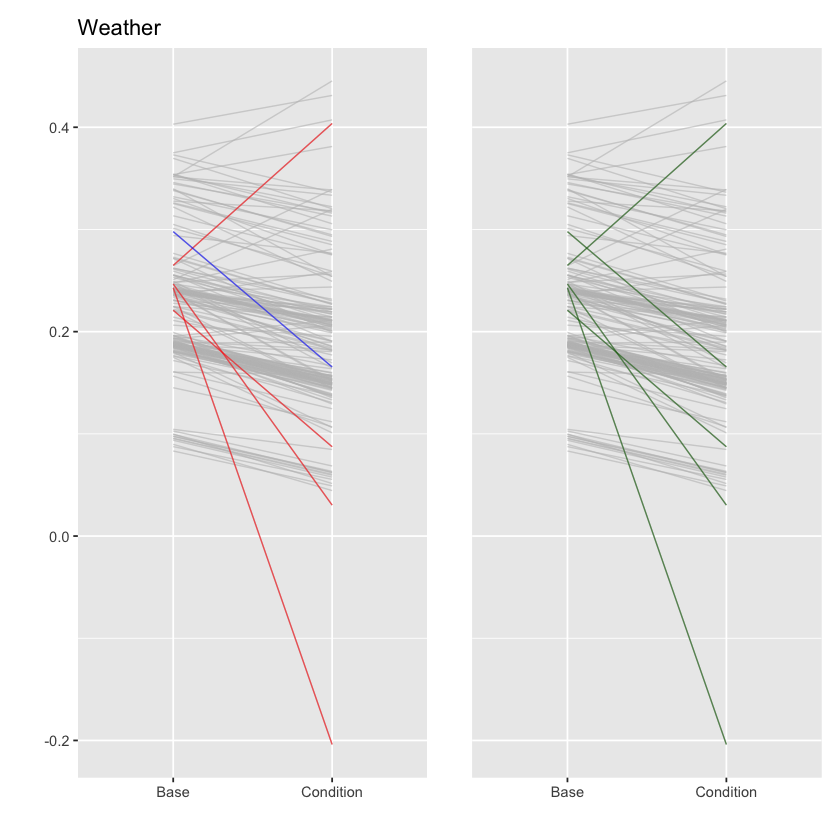

In [177]:
p1 <- p %>% ggplot( aes(x=Weather, y=Estimate, group=factor(docauthorid), color=factor(Female))) +
    geom_line(alpha = .6, size = .4)+
#geom_jitter(alpha = .4, size = 2, width = .25)+
  scale_x_discrete(labels=c("0" = "Base", "1" = "Condition"))+
ylab("")+ 
xlab("")+ 
scale_color_manual(values = c("blue", "red"))+ # gghighlight authors
#scale_color_manual(values = c("red"))+ # gghighlight women
theme(legend.position = "none", legend.title = element_blank())+
#ylim(-.1, .7)+
ggtitle("Weather")+
gghighlight(docauthorid %in% idsO)
#gghighlight(Female == 1)

p0 <- p %>% ggplot( aes(x=Weather, y=Estimate, group=factor(docauthorid), color=factor(Irish))) +
    geom_line(alpha = .6, size = .4)+
#geom_jitter(alpha = .4, size = 2, width = .25)+
  scale_x_discrete(labels=c("0" = "Base", "1" = "Condition"))+
ylab("")+ 
xlab("")+ 
scale_color_manual(values = c("darkgreen"))+ # gghighlight authors
#scale_color_manual(values = c("red"))+ # gghighlight women
theme(legend.position = "none", legend.title = element_blank(), axis.text.y = element_blank(), axis.ticks.y = element_blank())+
#ylim(-.1, .7)+
ggtitle("")+
gghighlight(docauthorid %in% idsO)
#gghighlight(Female == 1)

p1 & p0

ggsave("20250426_PhD_SenWea.jpg")

In [178]:
# Most typical

ids <- ranef(f5ppSFIxLClMsSocSelTopIS, probs = c(.05, .95))$docauthorid[,,"Weather1"]%>%
data.frame()%>%
arrange(abs(Estimate))%>%
slice(1:10)

ids

df[df$docauthorid %in% rownames(ids),] %>% 
select(docauthorid, authorName, nationalOrigin, authorGender) %>% 
unique() %>%
arrange(ids)


,Estimate,Est.Error,Q5,Q95
,<dbl>,<dbl>,<dbl>,<dbl>
per0038008,0.00003055321,0.1398017,-0.2295455,0.2288235
per0032229,-0.00014558750,0.1528062,-0.2599043,0.2617676
per0029189,-0.00017993450,0.1562059,-0.2522311,0.2608728
per0029177,-0.00018940143,0.1508810,-0.2460902,0.2377468
IED0528,-0.00023279761,0.1561399,-0.2497491,0.2627859
per0038862,0.00025489816,0.1550404,-0.2512861,0.2476692
per0000339,0.00029763099,0.1467634,-0.2399141,0.2425761
per0027085,0.00036376757,0.1481662,-0.2444565,0.2434840
per0027086,-0.00041225148,0.1528068,-0.2460406,0.2484018


docauthorid,authorName,nationalOrigin,authorGender
<fct>,<fct>,<fct>,<fct>
per0029189,NA,Scottish,M
per0038008,Critchlow Harris,English,M
per0000339,Sarah Roberts,Welsh,F
per0032229,John R. Williams,Welsh,M
per0031338,Ezekiel Hughes,Welsh,M
IED0528,John McElderry,Irish,M
per0027085,NA,English,M
per0027086,NA,English,M
per0029177,NA,Scottish,M


### Money

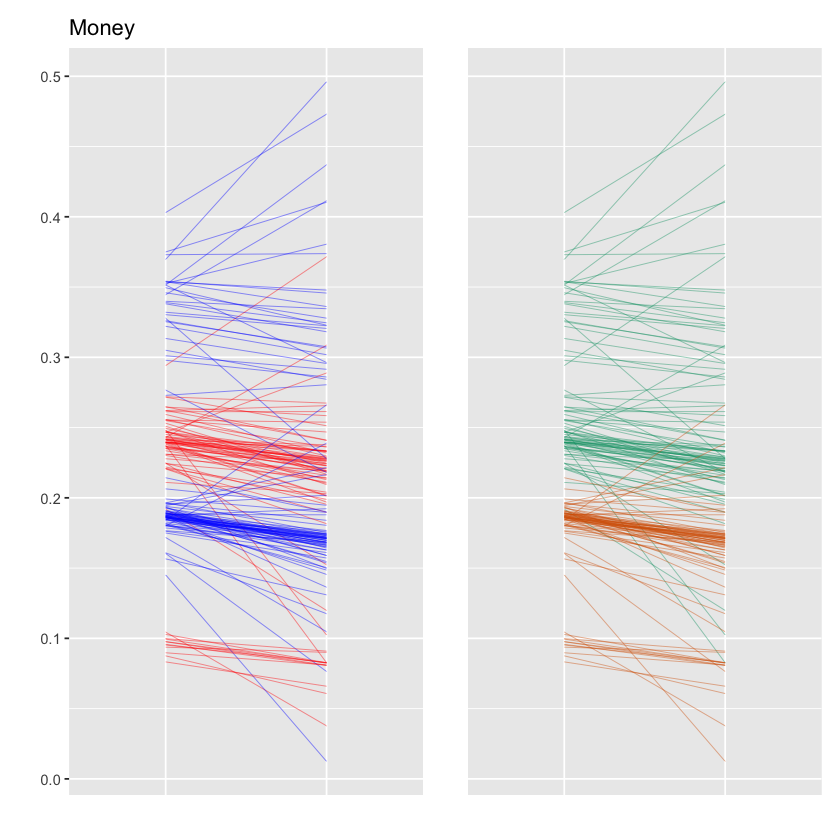

In [179]:
p <- f %>%filter(lateCentury == 0 & Canada == 0 & lowMonths == 0, 
                  Weather == 0, Farming == 0, People == 0, Setting == 0,
                  Contemplation == 0, Family == 0, Travel == 0, Difficulty == 0, Government == 0,
                  mentsRate.s == 0, fppAllRate.s == 0)

p3 <- p %>% ggplot( aes(x=factor(Money), y=Estimate, group=factor(docauthorid), color=factor(Female))) +
geom_line(alpha = .6, size = .2)+
#scale_x_discrete(labels=c("0" = "Correspondence", "1" = "Weather"))+
xlab("")+ 
ylab("")+
scale_color_manual(values = c("blue", "red"))+
theme(legend.position = "none", legend.title = element_blank(), 
      axis.ticks.x = element_blank(), axis.text.x = element_blank())+
#ylim(-.2, .45)+
ggtitle("Money")#+
#gghighlight(Female == 1)

p4 <- p %>% ggplot( aes(x=factor(Money), y=Estimate, group=factor(docauthorid), color=factor(Irish))) +
geom_line(alpha = .6, size = .2)+
#scale_x_discrete(labels=c("0" = "Correspondence", "1" = "Weather"))+
xlab("")+ 
ylab("")+
scale_color_manual(values = c("#D55E00", "#009E73"))+
theme(legend.position = "none", legend.title = element_blank(), 
      axis.ticks = element_blank(), axis.text.x = element_blank(), axis.text.y = element_blank())+
#ylim(-.2, .45)+
ggtitle("")#+
#gghighlight(Female == 1)

p3 & p4

In [183]:
p <- f %>%filter(lateCentury == 0 & Canada == 0 & lowMonths == 0, 
                  Weather == 0, Farming == 0, People == 0, Setting == 0,
                  Contemplation == 0, Family == 0, Travel == 0, Difficulty == 0, Government == 0,
                  mentsRate.s == 0, fppAllRate.s == 0)

on <- p %>%
filter(Money == 1) %>%
select(docauthorid, Estimate, Money, Female, Irish) %>%
arrange(docauthorid)%>%
rename(idOn = 1, EstOn= 2)

off <- p %>%
filter(Money == 0) %>%
select(docauthorid, Estimate, Money, Female, Irish) %>%
arrange(docauthorid) %>%
rename(idOff = 1, EstOff = 2)

combined <- cbind(on, off)[,c(1:2, 4:5, 7)]
#combined
#combined$idOn == combined$idOff

combined %>%
mutate(diff = EstOn - EstOff)%>%
filter(diff > 0)%>% # These are writers who have a pos slope. The greatest is Jane Fleming.
arrange(desc(diff))

idsO <- combined %>%
mutate(diff = EstOn - EstOff)%>%
filter(diff > 0)%>% # These are writers who have a pos slope. The greatest is Jane Fleming.
arrange(desc(diff)) %>%
pull(idOn)

#idsO

df[df$docauthorid %in% idsO,] %>% select(docauthorid, authorName, nationalOrigin, authorGender) %>% unique()

idOn,EstOn,Female,Irish,EstOff,diff
<fct>,<dbl>,<fct>,<fct>,<dbl>,<dbl>
IED0243,0.4961201,0,1,0.3696050,0.12651508686
IED0089.89,0.4369852,0,1,0.3514434,0.08554180778
per0029174,0.2661823,0,0,0.1839856,0.08219665627
IED0451,0.3715429,1,1,0.2940812,0.07746170654
per0026978a,0.4730078,0,1,0.4029724,0.07003539929
IED0534,0.4113712,0,1,0.3445595,0.06681175525
IED0212,0.3086523,1,1,0.2428401,0.06581215557
per0032229,0.2389085,0,0,0.1800393,0.05886922322
IED0655,0.2888611,1,1,0.2465536,0.04230750370


,docauthorid,authorName,nationalOrigin,authorGender
,<fct>,<fct>,<fct>,<fct>
32,IED0212,Ellen S. Dunlop,Irish,F
42,IED0451,Jane Fleming,Irish,F
87,IED0374,Jonathan W. Smith,Irish,M
178,IED0068,Ann Forrest,Irish,F
341,IED0243,George Anderson,Irish,M
417,IED0655,Mary Ann Cathcart,Irish,F
500,IED0528,John McElderry,Irish,M
508,IED0768,Robert Anderson,Irish,M
731,IED0534,John Miller,Irish,M


Warning message:
“Tried to calculate with group_by(), but the calculation failed.
Falling back to ungrouped filter operation...”
Warning message:
“Tried to calculate with group_by(), but the calculation failed.
Falling back to ungrouped filter operation...”


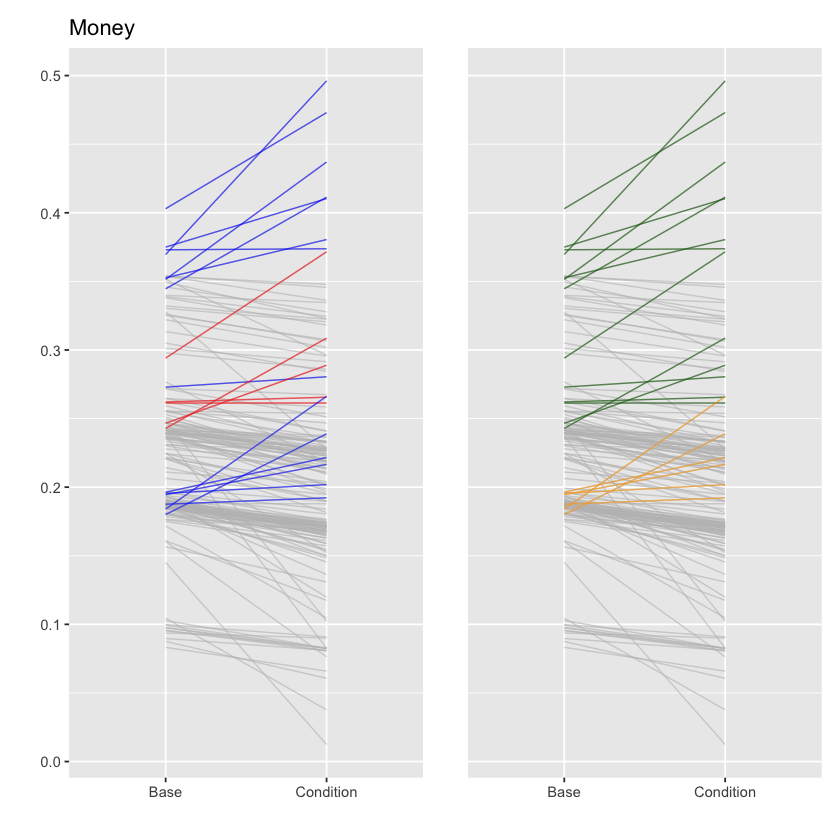

In [184]:
p1 <- p %>% ggplot( aes(x=Money, y=Estimate, group=factor(docauthorid), color=factor(Female))) +
    geom_line(alpha = .6, size = .4)+
#geom_jitter(alpha = .4, size = 2, width = .25)+
  scale_x_discrete(labels=c("0" = "Base", "1" = "Condition"))+
ylab("")+ 
xlab("")+ 
scale_color_manual(values = c("blue", "red"))+ # gghighlight authors
#scale_color_manual(values = c("red"))+ # gghighlight women
theme(legend.position = "none", legend.title = element_blank())+
#ylim(-.1, .7)+
ggtitle("Money")+
gghighlight(docauthorid %in% idsO)
#gghighlight(Female == 1)

p0 <- p %>% ggplot( aes(x=Money, y=Estimate, group=factor(docauthorid), color=factor(Irish))) +
    geom_line(alpha = .6, size = .4)+
#geom_jitter(alpha = .4, size = 2, width = .25)+
  scale_x_discrete(labels=c("0" = "Base", "1" = "Condition"))+
ylab("")+ 
xlab("")+ 
scale_color_manual(values = c("orange", "darkgreen"))+ # gghighlight authors
#scale_color_manual(values = c("red"))+ # gghighlight women
theme(legend.position = "none", legend.title = element_blank(), axis.text.y = element_blank(), axis.ticks.y = element_blank())+
#ylim(-.1, .7)+
ggtitle("")+
gghighlight(docauthorid %in% idsO)
#gghighlight(Female == 1)



p1 & p0

#ggsave("20250426_PhD_SenMon.jpg")

In [185]:
p <- f %>%filter(lateCentury == 0 & Canada == 0 & lowMonths == 0, 
                  Weather == 0, Farming == 0, People == 0, Setting == 0,
                  Contemplation == 0, Family == 0, Travel == 0, Difficulty == 0, Government == 0,
                  mentsRate.s == 0, fppAllRate.s == 0)

on <- p %>%
filter(Money == 1) %>%
select(docauthorid, Estimate, Money, Female, Irish) %>%
arrange(docauthorid)%>%
rename(idOn = 1, EstOn= 2)

off <- p %>%
filter(Money == 0) %>%
select(docauthorid, Estimate, Money, Female, Irish) %>%
arrange(docauthorid) %>%
rename(idOff = 1, EstOff = 2)

combined <- cbind(on, off)[,c(1:2, 4:5, 7)]
#combined
#combined$idOn == combined$idOff

combined %>%
mutate(diff = abs(EstOff - EstOn))%>%
arrange(desc(diff))%>%
filter(diff >= .1)%>% # These are writers with effects over .1 
arrange(desc(diff))

idsO <- combined %>%
mutate(diff = abs(EstOff - EstOn))%>%
arrange(desc(diff))%>%
filter(diff >= .1)%>%
#slice(1:2)#%>%
pull(idOn)

#idsO

df[df$docauthorid %in% idsO,] %>% select(docauthorid, authorName, nationalOrigin, authorGender) %>% unique()

idOn,EstOn,Female,Irish,EstOff,diff
<fct>,<dbl>,<fct>,<fct>,<dbl>,<dbl>
IED0657,0.08260392,1,1,0.2374861,0.1548821
IED0692,0.10236411,1,1,0.2483149,0.1459508
per0014266,0.01242370,0,0,0.1451567,0.1327330
IED0243,0.49612012,0,1,0.3696050,0.1265151


,docauthorid,authorName,nationalOrigin,authorGender
,<fct>,<fct>,<fct>,<fct>
26,IED0657,May Ann Blair,Irish,F
138,IED0692,Mitilda Ferguson,Irish,F
341,IED0243,George Anderson,Irish,M
1815,per0014266,Thomas Turnbull,Scottish,M


Warning message:
“Tried to calculate with group_by(), but the calculation failed.
Falling back to ungrouped filter operation...”
Warning message:
“Tried to calculate with group_by(), but the calculation failed.
Falling back to ungrouped filter operation...”
Saving 7 x 7 in image


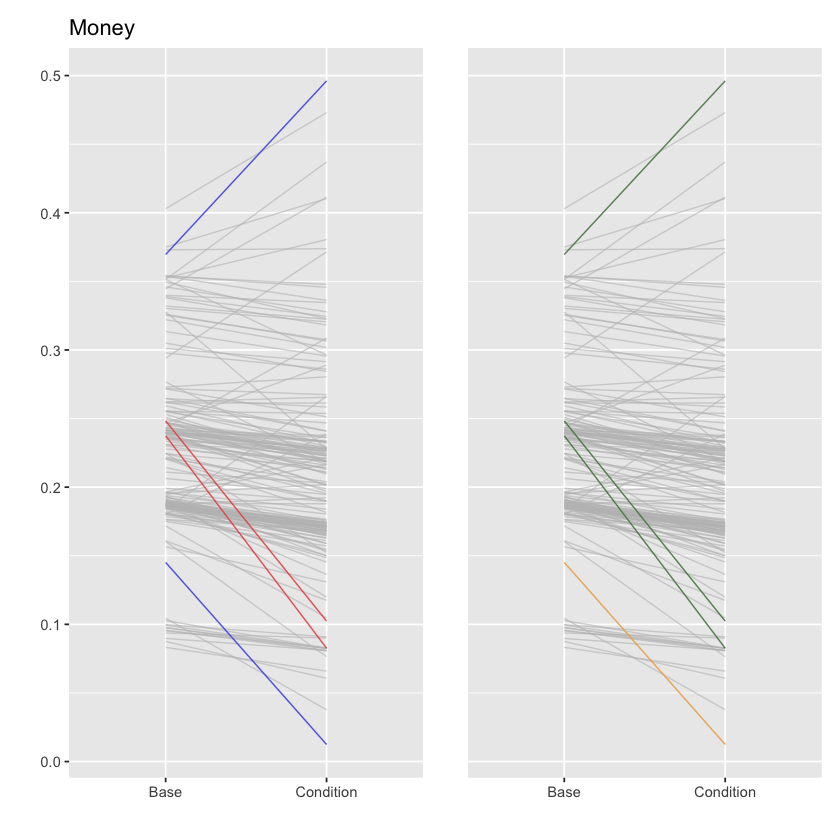

In [186]:
p1 <- p %>% ggplot( aes(x=Money, y=Estimate, group=factor(docauthorid), color=factor(Female))) +
    geom_line(alpha = .6, size = .4)+
#geom_jitter(alpha = .4, size = 2, width = .25)+
  scale_x_discrete(labels=c("0" = "Base", "1" = "Condition"))+
ylab("")+ 
xlab("")+ 
scale_color_manual(values = c("blue", "red"))+ # gghighlight authors
#scale_color_manual(values = c("red"))+ # gghighlight women
theme(legend.position = "none", legend.title = element_blank())+
#ylim(-.1, .7)+
ggtitle("Money")+
gghighlight(docauthorid %in% idsO)
#gghighlight(Female == 1)

p0 <- p %>% ggplot( aes(x=Money, y=Estimate, group=factor(docauthorid), color=factor(Irish))) +
    geom_line(alpha = .6, size = .4)+
#geom_jitter(alpha = .4, size = 2, width = .25)+
  scale_x_discrete(labels=c("0" = "Base", "1" = "Condition"))+
ylab("")+ 
xlab("")+ 
scale_color_manual(values = c("orange", "darkgreen"))+ # gghighlight authors
#scale_color_manual(values = c("red"))+ # gghighlight women
theme(legend.position = "none", legend.title = element_blank(), axis.text.y = element_blank(), axis.ticks.y = element_blank())+
#ylim(-.1, .7)+
ggtitle("")+
gghighlight(docauthorid %in% idsO)
#gghighlight(Female == 1)



p1 & p0

ggsave("20250426_PhD_SenMon.jpg")

In [187]:
# Most typical

ids <- ranef(f5ppSFIxLClMsSocSelTopIS, probs = c(.05, .95))$docauthorid[,,"Money1"]%>%
data.frame()%>%
arrange(abs(Estimate))%>%
slice(1:10)

ids

df[df$docauthorid %in% rownames(ids),] %>% 
select(docauthorid, authorName, nationalOrigin, authorGender) %>% 
unique() %>%
arrange(ids)


,Estimate,Est.Error,Q5,Q95
,<dbl>,<dbl>,<dbl>,<dbl>
IED0701,-0.0001626208,0.1098950,-0.1855294,0.1811221
IED0716,0.0001944968,0.1182494,-0.1965647,0.1983201
IED0611,0.0003115041,0.1159955,-0.1893784,0.1984093
per0036385,0.0003236123,0.1130693,-0.1798198,0.1826386
per0004549,-0.0005424235,0.1153123,-0.1945015,0.1848202
per0031263,0.0008413573,0.1145389,-0.1928689,0.1904024
IED0075,-0.0008708115,0.1137756,-0.1934766,0.1874063
per0036149,0.0009253694,0.1127238,-0.1855539,0.1882155
per0038053,0.0009422666,0.1103317,-0.1773203,0.1884450


docauthorid,authorName,nationalOrigin,authorGender
<fct>,<fct>,<fct>,<fct>
per0036385,NA,Scottish,M
per0038053,Robert Harris,English,M
per0031263,William Davies,Welsh,M
IED0075,Annie Wyly,Irish,F
IED0611,M. E. Ling,Irish,F
IED0701,Edith Gass,Irish,F
IED0716,Mrs William Davey,Irish,F
per0004549,Ann Ellis,Welsh,F
per0017671,Henry James Hudson,English,M


## Farming

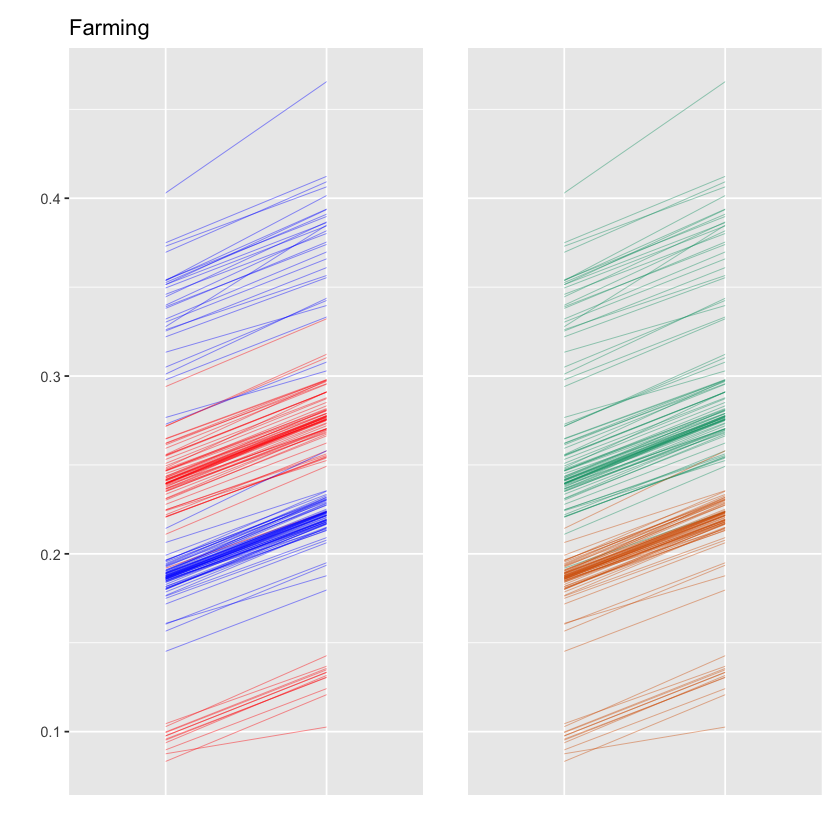

In [188]:
p <- f %>%filter(lateCentury == 0 & Canada == 0 & lowMonths == 0, 
                  Weather == 0, Money == 0, People == 0, Setting == 0,
                  Contemplation == 0, Family == 0, Travel == 0, Difficulty == 0, Government == 0,
                  mentsRate.s == 0, fppAllRate.s == 0)

p5 <- p %>% ggplot( aes(x=factor(Farming), y=Estimate, group=factor(docauthorid), color=factor(Female))) +
geom_line(alpha = .6, size = .2)+
#scale_x_discrete(labels=c("0" = "Correspondence", "1" = "Weather"))+
xlab("")+ 
ylab("")+
scale_color_manual(values = c("blue", "red"))+
theme(legend.position = "none", legend.title = element_blank(), 
      axis.ticks.x = element_blank(), axis.text.x = element_blank())+
#ylim(-.2, .45)+
ggtitle("Farming")#+
#gghighlight(Female == 1)

p6 <- p %>% ggplot( aes(x=factor(Farming), y=Estimate, group=factor(docauthorid), color=factor(Irish))) +
geom_line(alpha = .6, size = .2)+
#scale_x_discrete(labels=c("0" = "Correspondence", "1" = "Weather"))+
xlab("")+ 
ylab("")+
scale_color_manual(values = c("#D55E00", "#009E73"))+
theme(legend.position = "none", legend.title = element_blank(), 
      axis.ticks = element_blank(), axis.text.x = element_blank(), axis.text.y = element_blank())+
#ylim(-.2, .45)+
ggtitle("")#+
#gghighlight(Female == 1)

p5 & p6

In [190]:
# Most typical

ids <- ranef(f5ppSFIxLClMsSocSelTopIS, probs = c(.05, .95))$docauthorid[,,"Farming1"]%>%
data.frame()%>%
arrange(abs(Estimate))%>%
slice(1:10)

ids

df[df$docauthorid %in% rownames(ids),] %>% 
select(docauthorid, authorName, nationalOrigin, authorGender) %>% 
unique() %>%
arrange(ids)


,Estimate,Est.Error,Q5,Q95
,<dbl>,<dbl>,<dbl>,<dbl>
per0025643,0.00001144623,0.03887887,-0.06167505,0.06160037
IED0716,0.00001530204,0.03998909,-0.06567087,0.06433660
IED0665,-0.00002679424,0.03933519,-0.06594042,0.06334173
IED0129,0.00003841446,0.03783863,-0.05901396,0.06226488
IED0714,0.00005368024,0.03880597,-0.06311836,0.06297141
IED0254,0.00005382812,0.03856833,-0.06242439,0.06158665
per0031263,0.00006813969,0.03905777,-0.06306818,0.06452266
per0035344,0.00008206800,0.03904698,-0.06400870,0.06629320
per0025682,0.00009187958,0.04062311,-0.06207809,0.06487660


docauthorid,authorName,nationalOrigin,authorGender
<fct>,<fct>,<fct>,<fct>
IED0068,Ann Forrest,Irish,F
IED0129,Catharine Bradley,Irish,F
IED0714,Susan Blun,Irish,F
IED0665,Mary Irvine,Irish,F
IED0254,George Mahood,Irish,M
IED0716,Mrs William Davey,Irish,F
per0031263,William Davies,Welsh,M
per0035344,Margaret Bebb,Welsh,F
per0025643,James Humphrey,Irish,M


## People

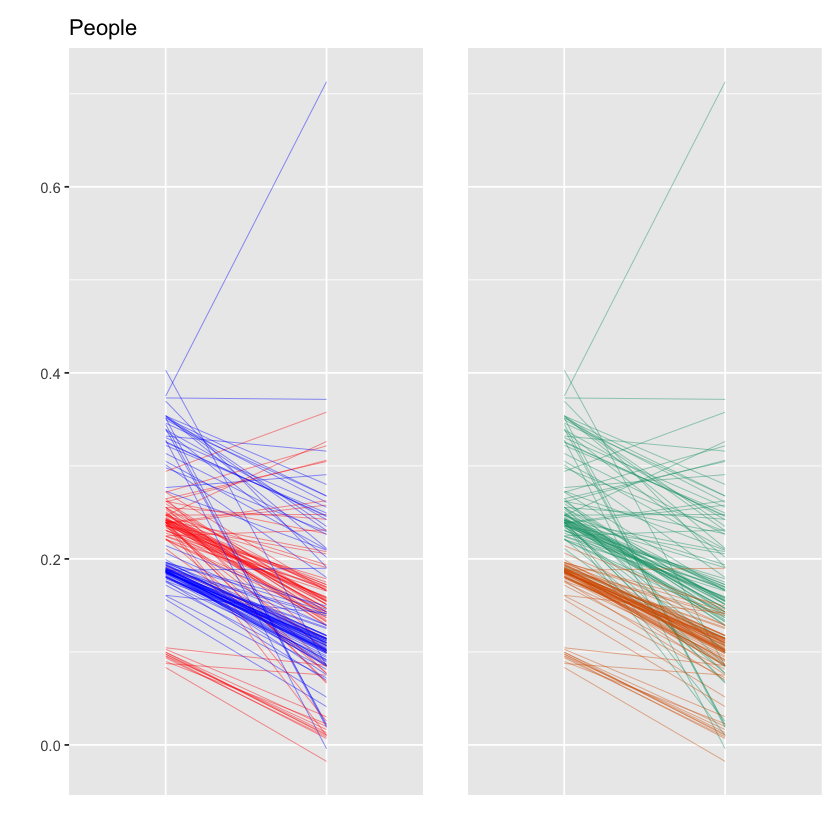

In [191]:
p <- f %>%filter(lateCentury == 0 & Canada == 0 & lowMonths == 0, 
                  Weather == 0, Money == 0, Farming == 0, Setting == 0,
                  Contemplation == 0, Family == 0, Travel == 0, Difficulty == 0, Government == 0,
                  mentsRate.s == 0, fppAllRate.s == 0)

p7 <- p %>% ggplot( aes(x=factor(People), y=Estimate, group=factor(docauthorid), color=factor(Female))) +
geom_line(alpha = .6, size = .2)+
#scale_x_discrete(labels=c("0" = "Correspondence", "1" = "Weather"))+
xlab("")+ 
ylab("")+
scale_color_manual(values = c("blue", "red"))+
theme(legend.position = "none", legend.title = element_blank(), 
      axis.ticks.x = element_blank(), axis.text.x = element_blank())+
#ylim(-.2, .45)+
ggtitle("People")#+
#gghighlight(Female == 1)

p8 <- p %>% ggplot( aes(x=factor(People), y=Estimate, group=factor(docauthorid), color=factor(Irish))) +
geom_line(alpha = .6, size = .2)+
#scale_x_discrete(labels=c("0" = "Correspondence", "1" = "Weather"))+
xlab("")+ 
ylab("")+
scale_color_manual(values = c("#D55E00", "#009E73"))+
theme(legend.position = "none", legend.title = element_blank(), 
      axis.ticks = element_blank(), axis.text.x = element_blank(), axis.text.y = element_blank())+
#ylim(-.2, .45)+
ggtitle("")#+
#gghighlight(Female == 1)

p7 & p8

In [194]:
p <- f %>%filter(lateCentury == 0 & Canada == 0 & lowMonths == 0, 
                  Weather == 0, Money == 0, Farming == 0, Setting == 0,
                  Contemplation == 0, Family == 0, Travel == 0, Difficulty == 0, Government == 0,
                  mentsRate.s == 0, fppAllRate.s == 0)

on <- p %>%
filter(People == 1) %>%
select(docauthorid, Estimate, Money, Female, Irish) %>%
arrange(docauthorid)%>%
rename(idOn = 1, EstOn= 2)

off <- p %>%
filter(People == 0) %>%
select(docauthorid, Estimate, Money, Female, Irish) %>%
arrange(docauthorid) %>%
rename(idOff = 1, EstOff = 2)

combined <- cbind(on, off)[,c(1:2, 4:5, 7)]
#combined
#combined$idOn == combined$idOff

combined %>%
mutate(diff = EstOn - EstOff)%>%
filter(diff > 0)%>% # These are writers who have a pos slope. The greatest is Jane Fleming.
arrange(desc(diff))

idsO <- combined %>%
mutate(diff = EstOn - EstOff)%>%
filter(diff > 0)%>% # These are writers who have a pos slope. The greatest is Jane Fleming.
arrange(desc(diff)) %>%
pull(idOn)

#idsO

df[df$docauthorid %in% idsO,] %>% select(docauthorid, authorName, nationalOrigin, authorGender) %>% unique()

idOn,EstOn,Female,Irish,EstOff,diff
<fct>,<dbl>,<fct>,<fct>,<dbl>,<dbl>
IED0374,0.7130069,0,1,0.3749839,0.3380230391
IED0655,0.3262445,1,1,0.2465536,0.0796908496
IED0451,0.3577434,1,1,0.2940812,0.0636622384
IED0705,0.3215437,1,1,0.2716648,0.0498788567
IED0068,0.3060188,1,1,0.2612880,0.0447307430
IED0107,0.3047771,1,1,0.2645772,0.0401999157
IED0630,0.2625192,1,1,0.2387056,0.0238136125
IED0276,0.2578442,1,1,0.2381204,0.0197237271
per0027000,0.2905777,0,1,0.2766864,0.0138913261


,docauthorid,authorName,nationalOrigin,authorGender
,<fct>,<fct>,<fct>,<fct>
1,IED0107,Isabella Weir Moore,Irish,F
42,IED0451,Jane Fleming,Irish,F
87,IED0374,Jonathan W. Smith,Irish,M
142,IED0630,Maggie McCann,Irish,F
178,IED0068,Ann Forrest,Irish,F
199,IED0838,Ruth J. Ramsey,Irish,F
249,IED0276,Hannah J. Smith,Irish,F
398,IED0069,Ann Jane Knox,Irish,F
417,IED0655,Mary Ann Cathcart,Irish,F


Warning message:
“Tried to calculate with group_by(), but the calculation failed.
Falling back to ungrouped filter operation...”
Warning message:
“Tried to calculate with group_by(), but the calculation failed.
Falling back to ungrouped filter operation...”


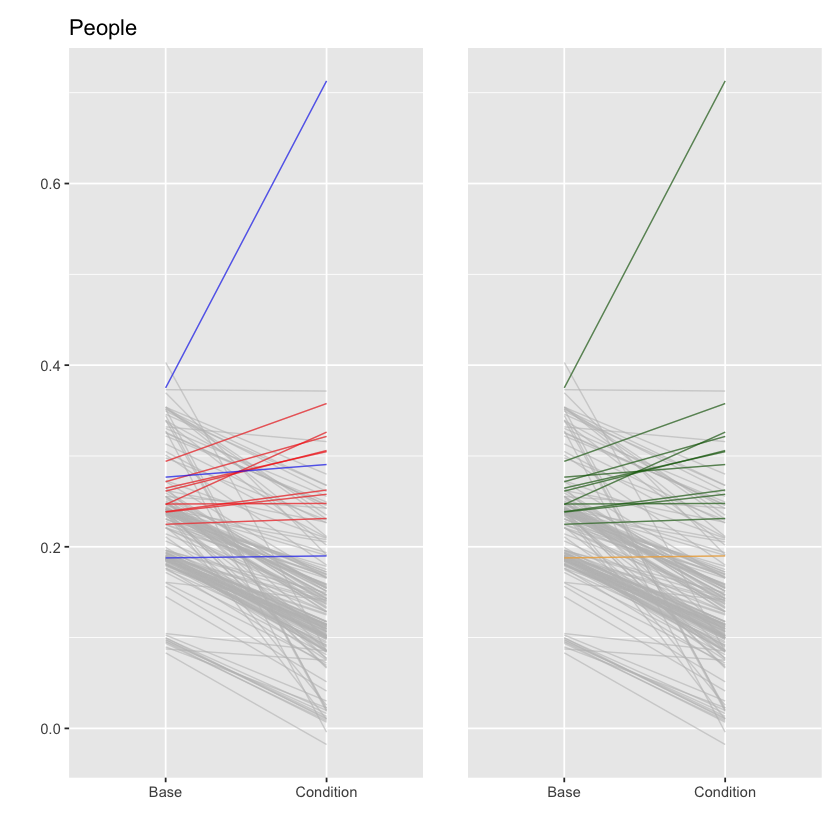

In [195]:
p1 <- p %>% ggplot( aes(x=People, y=Estimate, group=factor(docauthorid), color=factor(Female))) +
    geom_line(alpha = .6, size = .4)+
#geom_jitter(alpha = .4, size = 2, width = .25)+
  scale_x_discrete(labels=c("0" = "Base", "1" = "Condition"))+
ylab("")+ 
xlab("")+ 
scale_color_manual(values = c("blue", "red"))+ # gghighlight authors
#scale_color_manual(values = c("red"))+ # gghighlight women
theme(legend.position = "none", legend.title = element_blank())+
#ylim(-.1, .7)+
ggtitle("People")+
gghighlight(docauthorid %in% idsO)
#gghighlight(Female == 1)

p0 <- p %>% ggplot( aes(x=People, y=Estimate, group=factor(docauthorid), color=factor(Irish))) +
    geom_line(alpha = .6, size = .4)+
#geom_jitter(alpha = .4, size = 2, width = .25)+
  scale_x_discrete(labels=c("0" = "Base", "1" = "Condition"))+
ylab("")+ 
xlab("")+ 
scale_color_manual(values = c("orange", "darkgreen"))+ # gghighlight authors
#scale_color_manual(values = c("red"))+ # gghighlight women
theme(legend.position = "none", legend.title = element_blank(), axis.text.y = element_blank(), axis.ticks.y = element_blank())+
#ylim(-.1, .7)+
ggtitle("")+
gghighlight(docauthorid %in% idsO)
#gghighlight(Female == 1)

p1 & p0 

#ggsave("20250426_PhD_SenPeo.jpg")

In [196]:
# Most typical

ids <- ranef(f5ppSFIxLClMsSocSelTopIS, probs = c(.05, .95))$docauthorid[,,"People1"]%>%
data.frame()%>%
arrange(abs(Estimate))%>%
slice(1:10)

ids

df[df$docauthorid %in% rownames(ids),] %>% 
select(docauthorid, authorName, nationalOrigin, authorGender) %>% 
unique() %>%
arrange(ids)


,Estimate,Est.Error,Q5,Q95
,<dbl>,<dbl>,<dbl>,<dbl>
IED0089.89,-0.00009465564,0.1819743,-0.2849315,0.2946395
per0027086,-0.00011076453,0.1730191,-0.2754647,0.2872836
per0026998,-0.00026827373,0.1060517,-0.1745990,0.1725785
per0035344,-0.00070901738,0.1668444,-0.2692804,0.2699977
per0017671,-0.00107073549,0.1712527,-0.2789506,0.2803950
per0029174,0.00110413830,0.1682728,-0.2776167,0.2793321
per0029193,0.00111337482,0.1657479,-0.2648571,0.2802276
per0036147,0.00115633865,0.1671502,-0.2701665,0.2697977
per0004551,0.00121760639,0.1727781,-0.2807628,0.2838905


docauthorid,authorName,nationalOrigin,authorGender
<fct>,<fct>,<fct>,<fct>
per0029193,NA,Scottish,M
per0017671,Henry James Hudson,English,M
per0004551,Rees Llewellyn,Welsh,M
per0035344,Margaret Bebb,Welsh,F
IED0089.89,Henry Jim Keenan,Irish,M
IED0631,Maggie Smith,Irish,F
per0026998,Jane White,Irish,F
per0027086,NA,English,M
per0036147,J. Taylor,English,M


In [192]:
p <- f %>%filter(lateCentury == 0 & Canada == 0 & lowMonths == 0, 
                  Weather == 0, Money == 0, Farming == 0, Setting == 0,
                  Contemplation == 0, Family == 0, Travel == 0, Difficulty == 0, Government == 0,
                  mentsRate.s == 0, fppAllRate.s == 0)

on <- p %>%
filter(People == 1) %>%
select(docauthorid, Estimate, People, Female, Irish) %>%
arrange(docauthorid)%>%
rename(idOn = 1, EstOn= 2)

off <- p %>%
filter(People == 0) %>%
select(docauthorid, Estimate, People, Female, Irish) %>%
arrange(docauthorid) %>%
rename(idOff = 1, EstOff = 2)

combined <- cbind(on, off)[,c(1:2, 4:5, 7)]
#combined
#combined$idOn == combined$idOff

combined %>%
mutate(diff = abs(EstOff - EstOn))%>%
arrange(desc(diff))%>%
filter(diff >= .1)%>% # These are writers with effects over .1 
arrange(desc(diff))

idsO <- combined %>%
mutate(diff = abs(EstOff - EstOn))%>%
arrange(desc(diff))%>%
filter(diff >= .1)%>%
#slice(1:2)#%>%
pull(idOn)

#idsO

df[df$docauthorid %in% idsO,] %>% select(docauthorid, authorName, nationalOrigin, authorGender) %>% unique() #%>% factorize() %>% summary()

idOn,EstOn,Female,Irish,EstOff,diff
<fct>,<dbl>,<fct>,<fct>,<dbl>,<dbl>
IED0374,0.713006908,0,1,0.3749839,0.3380230
IED1059,-0.004171321,0,1,0.3277563,0.3319276
IED0958,0.020155199,0,1,0.3514510,0.3312958
IED0534,0.018675120,0,1,0.3445595,0.3258843
per0026978a,0.084746707,0,1,0.4029724,0.3182257
IED0403,0.022078476,0,1,0.3398507,0.3177722
IED0657,0.010080472,1,1,0.2374861,0.2274056
IED0621,0.025566030,1,1,0.2394188,0.2138528
IED0243,0.190964020,0,1,0.3696050,0.1786410


,docauthorid,authorName,nationalOrigin,authorGender
,<fct>,<fct>,<fct>,<fct>
2,IED0179,E. Rothwell,Irish,F
5,IED0621,Mary Savage,Irish,F
7,IED0958,William J. Weir,Irish,M
26,IED0657,May Ann Blair,Irish,F
53,IED0403,James Gamble,Irish,M
61,IED0714,Susan Blun,Irish,F
68,IED0932,Thomas W. Coskery,Irish,M
77,IED0070,Ann Jane Sinclair,Irish,F
79,IED0132,Catherine Hennagan,Irish,F


Warning message:
“Tried to calculate with group_by(), but the calculation failed.
Falling back to ungrouped filter operation...”
Warning message:
“Tried to calculate with group_by(), but the calculation failed.
Falling back to ungrouped filter operation...”
Saving 7 x 7 in image


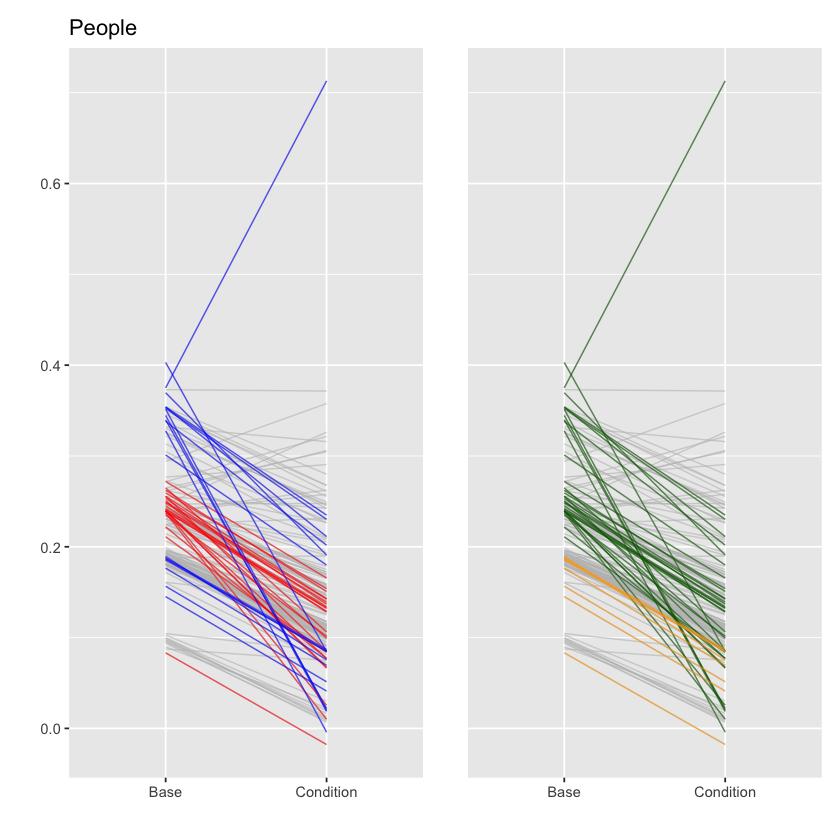

In [193]:
p1 <- p %>% ggplot( aes(x=People, y=Estimate, group=factor(docauthorid), color=factor(Female))) +
    geom_line(alpha = .6, size = .4)+
#geom_jitter(alpha = .4, size = 2, width = .25)+
  scale_x_discrete(labels=c("0" = "Base", "1" = "Condition"))+
ylab("")+ 
xlab("")+ 
scale_color_manual(values = c("blue", "red"))+ # gghighlight authors
#scale_color_manual(values = c("red"))+ # gghighlight women
theme(legend.position = "none", legend.title = element_blank())+
#ylim(-.1, .7)+
ggtitle("People")+
gghighlight(docauthorid %in% idsO)
#gghighlight(Female == 1)

p0 <- p %>% ggplot( aes(x=People, y=Estimate, group=factor(docauthorid), color=factor(Irish))) +
    geom_line(alpha = .6, size = .4)+
#geom_jitter(alpha = .4, size = 2, width = .25)+
  scale_x_discrete(labels=c("0" = "Base", "1" = "Condition"))+
ylab("")+ 
xlab("")+ 
scale_color_manual(values = c("orange", "darkgreen"))+ # gghighlight authors
#scale_color_manual(values = c("red"))+ # gghighlight women
theme(legend.position = "none", legend.title = element_blank(), axis.text.y = element_blank(), axis.ticks.y = element_blank())+
#ylim(-.1, .7)+
ggtitle("")+
gghighlight(docauthorid %in% idsO)
#gghighlight(Female == 1)

p1 & p0 

ggsave("20250426_PhD_SenPeo.jpg")

## Setting

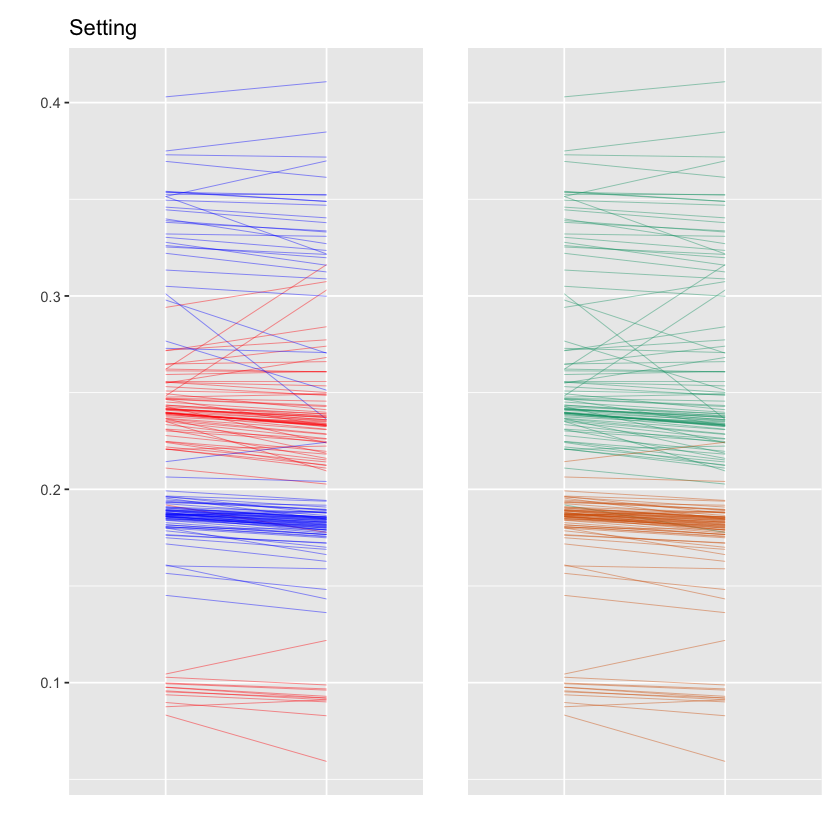

In [285]:
p <- f %>%filter(lateCentury == 0 & Canada == 0 & lowMonths == 0, 
                  Weather == 0, Money == 0, Farming == 0, People == 0,
                  Contemplation == 0, Family == 0, Travel == 0, Difficulty == 0, Government == 0,
                  mentsRate.s == 0, fppAllRate.s == 0)

p7 <- p %>% ggplot( aes(x=factor(Setting), y=Estimate, group=factor(docauthorid), color=factor(Female))) +
geom_line(alpha = .6, size = .2)+
#scale_x_discrete(labels=c("0" = "Correspondence", "1" = "Weather"))+
xlab("")+ 
ylab("")+
scale_color_manual(values = c("blue", "red"))+
theme(legend.position = "none", legend.title = element_blank(), 
      axis.ticks.x = element_blank(), axis.text.x = element_blank())+
#ylim(-.2, .45)+
ggtitle("Setting")#+
#gghighlight(Female == 1)

p8 <- p %>% ggplot( aes(x=factor(Setting), y=Estimate, group=factor(docauthorid), color=factor(Irish))) +
geom_line(alpha = .6, size = .2)+
#scale_x_discrete(labels=c("0" = "Correspondence", "1" = "Weather"))+
xlab("")+ 
ylab("")+
scale_color_manual(values = c("#D55E00", "#009E73"))+
theme(legend.position = "none", legend.title = element_blank(), 
      axis.ticks = element_blank(), axis.text.x = element_blank(), axis.text.y = element_blank())+
#ylim(-.2, .45)+
ggtitle("")#+
#gghighlight(Female == 1)

p7 & p8

In [286]:
p <- f %>%filter(lateCentury == 0 & Canada == 0 & lowMonths == 0, 
                  Weather == 0, Money == 0, Farming == 0, People == 0,
                  Contemplation == 0, Family == 0, Travel == 0, Difficulty == 0, Government == 0,
                  mentsRate.s == 0, fppAllRate.s == 0)

on <- p %>%
filter(Setting == 1) %>%
select(docauthorid, Estimate, People, Female, Irish) %>%
arrange(docauthorid)%>%
rename(idOn = 1, EstOn= 2)

off <- p %>%
filter(Setting == 0) %>%
select(docauthorid, Estimate, People, Female, Irish) %>%
arrange(docauthorid) %>%
rename(idOff = 1, EstOff = 2)

combined <- cbind(on, off)[,c(1:2, 4:5, 7)]
#combined
#combined$idOn == combined$idOff

combined %>%
mutate(diff = EstOn - EstOff)%>%
filter(diff > 0)%>% #
arrange(desc(diff))%>%
summary()

idsO <- combined %>%
mutate(diff = EstOn - EstOff)%>%
filter(diff > 0)%>% # These are writers who have a pos slope. The greatest is Jane Fleming.
arrange(desc(diff)) %>%
pull(idOn)

#idsO

df[df$docauthorid %in% idsO,] %>% select(docauthorid, authorName, nationalOrigin, authorGender) %>% unique() #%>% factorize() %>% summary()

      idOn        EstOn         Female Irish      EstOff       
 IED0032: 1   Min.   :0.09111   0: 6   0: 5   Min.   :0.08754  
 IED0072: 1   1st Qu.:0.22385   1:14   1:15   1st Qu.:0.21902  
 IED0078: 1   Median :0.26711                 Median :0.25757  
 IED0099: 1   Mean   :0.26322                 Mean   :0.25124  
 IED0107: 1   3rd Qu.:0.30414                 3rd Qu.:0.27172  
 IED0374: 1   Max.   :0.41081                 Max.   :0.40297  
 (Other):14                                                    
      diff           
 Min.   :0.00001148  
 1st Qu.:0.00173293  
 Median :0.00865618  
 Mean   :0.01198274  
 3rd Qu.:0.01329303  
 Max.   :0.05472859  
                     

,docauthorid,authorName,nationalOrigin,authorGender
,<fct>,<fct>,<fct>,<fct>
1,IED0107,Isabella Weir Moore,Irish,F
7,IED0958,William J. Weir,Irish,M
9,IED0099,Aunt Dollie,Irish,F
42,IED0451,Jane Fleming,Irish,F
87,IED0374,Jonathan W. Smith,Irish,M
138,IED0692,Mitilda Ferguson,Irish,F
151,IED0710,Martha Blair Cranston,Irish,F
563,IED0885,Sarah Irvine,Irish,F
635,IED0032,Ada M. Demain,Irish,F


Warning message:
“Tried to calculate with group_by(), but the calculation failed.
Falling back to ungrouped filter operation...”
Warning message:
“Tried to calculate with group_by(), but the calculation failed.
Falling back to ungrouped filter operation...”


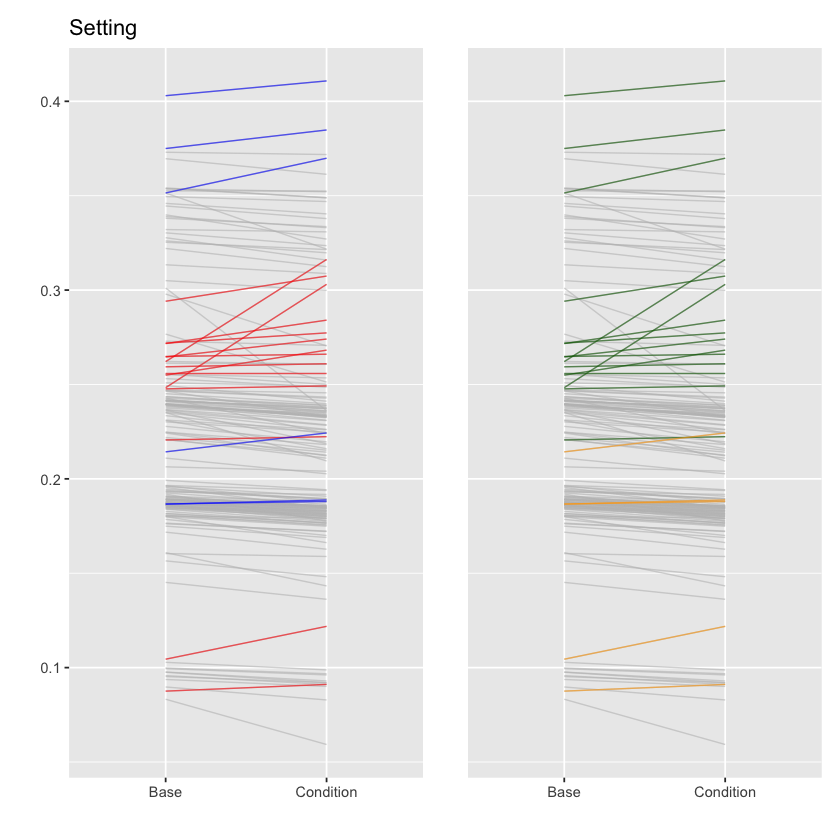

In [287]:
p1 <- p %>% ggplot( aes(x=Setting, y=Estimate, group=factor(docauthorid), color=factor(Female))) +
    geom_line(alpha = .6, size = .4)+
#geom_jitter(alpha = .4, size = 2, width = .25)+
  scale_x_discrete(labels=c("0" = "Base", "1" = "Condition"))+
ylab("")+ 
xlab("")+ 
scale_color_manual(values = c("blue", "red"))+ # gghighlight authors
#scale_color_manual(values = c("red"))+ # gghighlight women
theme(legend.position = "none", legend.title = element_blank())+
#ylim(-.1, .7)+
ggtitle("Setting")+
gghighlight(docauthorid %in% idsO)
#gghighlight(Female == 1)

p0 <- p %>% ggplot( aes(x=Setting, y=Estimate, group=factor(docauthorid), color=factor(Irish))) +
    geom_line(alpha = .6, size = .4)+
#geom_jitter(alpha = .4, size = 2, width = .25)+
  scale_x_discrete(labels=c("0" = "Base", "1" = "Condition"))+
ylab("")+ 
xlab("")+ 
scale_color_manual(values = c("orange", "darkgreen"))+ # gghighlight authors
#scale_color_manual(values = c("red"))+ # gghighlight women
theme(legend.position = "none", legend.title = element_blank(), axis.text.y = element_blank(), axis.ticks.y = element_blank())+
#ylim(-.1, .7)+
ggtitle("")+
gghighlight(docauthorid %in% idsO)
#gghighlight(Female == 1)

p1 & p0 

#ggsave("20250426_PhD_SenPeo.jpg")

In [288]:
# Most typical

ids <- ranef(f5ppSFIxLClMsSocSelTopIS, probs = c(.05, .95))$docauthorid[,,"Setting1"]%>%
data.frame()%>%
arrange(abs(Estimate))%>%
slice(1:10)

ids

df[df$docauthorid %in% rownames(ids),] %>% 
select(docauthorid, authorName, nationalOrigin, authorGender) %>% 
unique() %>%
arrange(ids)


,Estimate,Est.Error,Q5,Q95
,<dbl>,<dbl>,<dbl>,<dbl>
per0036149,-0.00002172025,0.06994451,-0.1150665,0.1139992
IED0893,0.00004731236,0.07590154,-0.1250386,0.1196516
per0031585,-0.00007150636,0.07758148,-0.1221951,0.1243485
per0035344,-0.00008461068,0.07369226,-0.1189487,0.1160344
per0026978b,0.00010644930,0.07718061,-0.1265665,0.1222884
IED0630,-0.00015303831,0.07917670,-0.1252587,0.1227558
IED0592,0.00015380503,0.07209520,-0.1222532,0.1143269
IED0665,0.00015670414,0.07481806,-0.1252514,0.1222656
per0031175,0.00017792393,0.07739854,-0.1256543,0.1200135


docauthorid,authorName,nationalOrigin,authorGender
<fct>,<fct>,<fct>,<fct>
per0029189,NA,Scottish,M
per0035344,Margaret Bebb,Welsh,F
IED0592,Lizzie Moore,Irish,F
IED0893,Thomas Bouchier,Irish,M
IED0630,Maggie McCann,Irish,F
IED0665,Mary Irvine,Irish,F
per0031175,David Shone Harry,Welsh,M
per0031585,John Owen Jones,Welsh,M
per0026978b,Margaret Carrothers,Irish,F


In [289]:
p <- f %>%filter(lateCentury == 0 & Canada == 0 & lowMonths == 0, 
                  Weather == 0, Money == 0, Farming == 0, People == 0,
                  Contemplation == 0, Family == 0, Travel == 0, Difficulty == 0, Government == 0,
                  mentsRate.s == 0, fppAllRate.s == 0)

on <- p %>%
filter(Setting == 1) %>%
select(docauthorid, Estimate, People, Female, Irish) %>%
arrange(docauthorid)%>%
rename(idOn = 1, EstOn= 2)

off <- p %>%
filter(Setting == 0) %>%
select(docauthorid, Estimate, People, Female, Irish) %>%
arrange(docauthorid) %>%
rename(idOff = 1, EstOff = 2)

combined <- cbind(on, off)[,c(1:2, 4:5, 7)]
#combined
#combined$idOn == combined$idOff

combined %>%
mutate(diff = abs(EstOff - EstOn))%>%
#arrange(desc(diff))%>%
filter(diff >= .05)%>% # These are writers with effects over .1 
arrange(desc(diff))

idsO <- combined %>%
mutate(diff = abs(EstOff - EstOn))%>%
arrange(desc(diff))%>%
filter(diff >= 0.05)%>%
#slice(1:2)#%>%
pull(idOn)

#idsO

df[df$docauthorid %in% idsO,] %>% select(docauthorid, authorName, nationalOrigin, authorGender) %>% unique() #%>% factorize() %>% summary()

idOn,EstOn,Female,Irish,EstOff,diff
<fct>,<dbl>,<fct>,<fct>,<dbl>,<dbl>
IED0233,0.2362009,0,1,0.3010952,0.06489423
IED0692,0.3030435,1,1,0.2483149,0.05472859
IED0078,0.3162144,1,1,0.2620978,0.05411652


,docauthorid,authorName,nationalOrigin,authorGender
,<fct>,<fct>,<fct>,<fct>
138,IED0692,Mitilda Ferguson,Irish,F
717,IED0233,George McCann,Irish,M
758,IED0078,Anne J. Walters,Irish,F


Warning message:
“Tried to calculate with group_by(), but the calculation failed.
Falling back to ungrouped filter operation...”
Warning message:
“Tried to calculate with group_by(), but the calculation failed.
Falling back to ungrouped filter operation...”


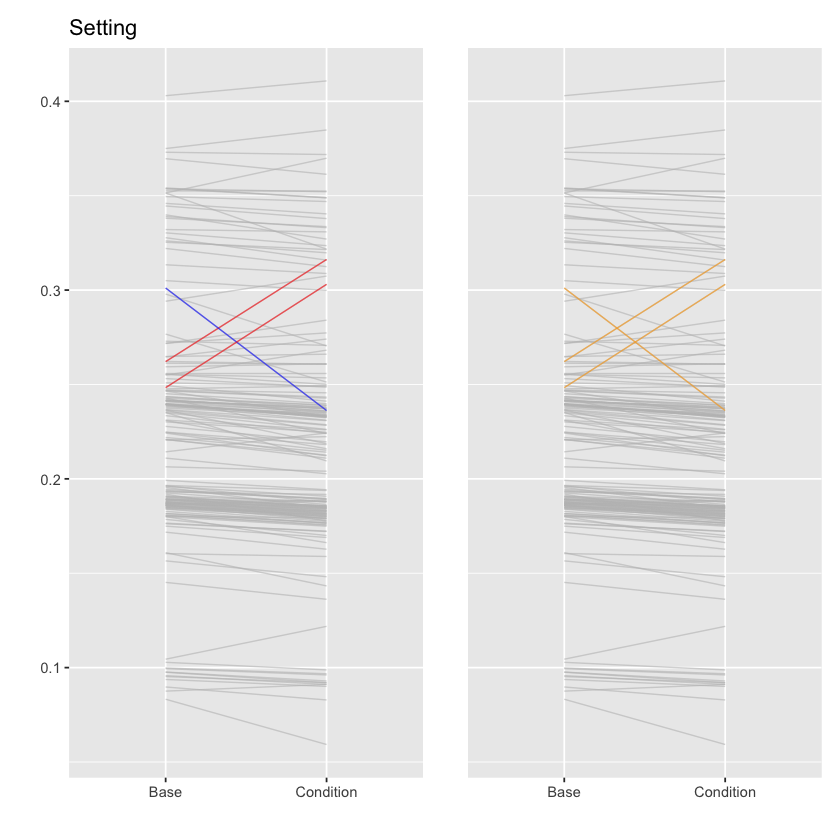

In [290]:
p1 <- p %>% ggplot( aes(x=Setting, y=Estimate, group=factor(docauthorid), color=factor(Female))) +
    geom_line(alpha = .6, size = .4)+
#geom_jitter(alpha = .4, size = 2, width = .25)+
  scale_x_discrete(labels=c("0" = "Base", "1" = "Condition"))+
ylab("")+ 
xlab("")+ 
scale_color_manual(values = c("blue", "red"))+ # gghighlight authors
#scale_color_manual(values = c("red"))+ # gghighlight women
theme(legend.position = "none", legend.title = element_blank())+
#ylim(-.1, .7)+
ggtitle("Setting")+
gghighlight(docauthorid %in% idsO)
#gghighlight(Female == 1)

p0 <- p %>% ggplot( aes(x=Setting, y=Estimate, group=factor(docauthorid), color=factor(Irish))) +
    geom_line(alpha = .6, size = .4)+
#geom_jitter(alpha = .4, size = 2, width = .25)+
  scale_x_discrete(labels=c("0" = "Base", "1" = "Condition"))+
ylab("")+ 
xlab("")+ 
scale_color_manual(values = c("orange", "darkgreen"))+ # gghighlight authors
#scale_color_manual(values = c("red"))+ # gghighlight women
theme(legend.position = "none", legend.title = element_blank(), axis.text.y = element_blank(), axis.ticks.y = element_blank())+
#ylim(-.1, .7)+
ggtitle("")+
gghighlight(docauthorid %in% idsO)
#gghighlight(Female == 1)

p1 & p0 

#ggsave("20250426_PhD_SenPeo.jpg")

## Contemplation

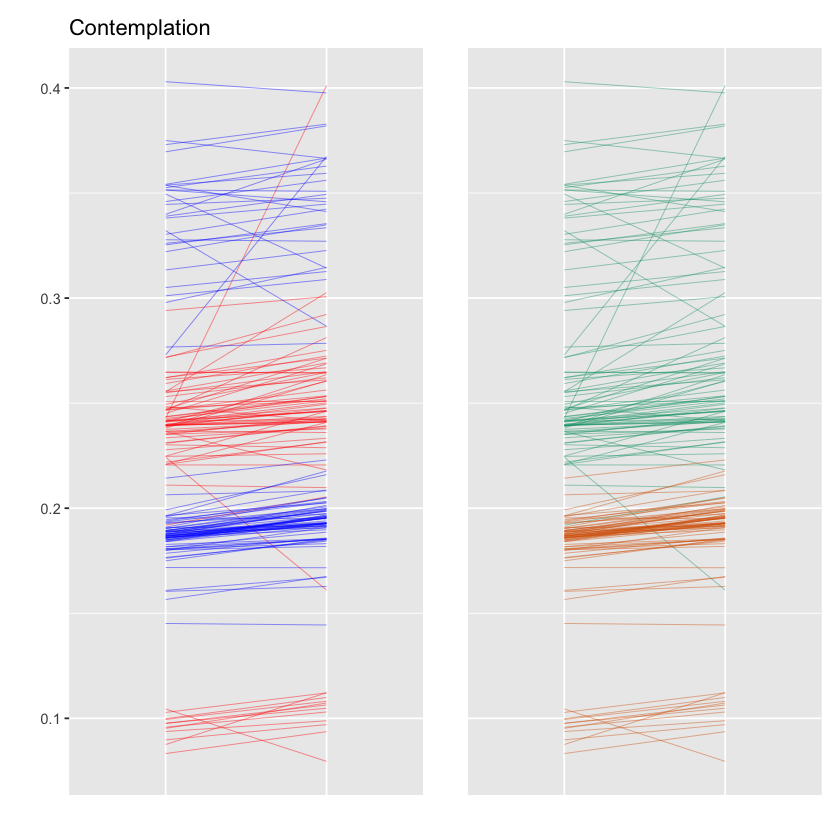

In [217]:
p <- f %>%filter(lateCentury == 0 & Canada == 0 & lowMonths == 0, 
                  Weather == 0, Money == 0, Farming == 0, People == 0,
                  Setting == 0, Family == 0, Travel == 0, Difficulty == 0, Government == 0,
                  mentsRate.s == 0, fppAllRate.s == 0)

p9 <- p %>% ggplot( aes(x=factor(Contemplation), y=Estimate, group=factor(docauthorid), color=factor(Female))) +
geom_line(alpha = .6, size = .2)+
#scale_x_discrete(labels=c("0" = "Correspondence", "1" = "Weather"))+
xlab("")+ 
ylab("")+
scale_color_manual(values = c("blue", "red"))+
theme(legend.position = "none", legend.title = element_blank(), 
      axis.ticks.x = element_blank(), axis.text.x = element_blank())+
#ylim(-.2, .45)+
ggtitle("Contemplation")#+
#gghighlight(Female == 1)

p10 <- p %>% ggplot( aes(x=factor(Contemplation), y=Estimate, group=factor(docauthorid), color=factor(Irish))) +
geom_line(alpha = .6, size = .2)+
#scale_x_discrete(labels=c("0" = "Correspondence", "1" = "Weather"))+
xlab("")+ 
ylab("")+
scale_color_manual(values = c("#D55E00", "#009E73"))+
theme(legend.position = "none", legend.title = element_blank(), 
      axis.ticks = element_blank(), axis.text.x = element_blank(), axis.text.y = element_blank())+
#ylim(-.2, .45)+
ggtitle("")#+
#gghighlight(Female == 1)

p9 & p10

In [218]:
p <- f %>%filter(lateCentury == 0 & Canada == 0 & lowMonths == 0, 
                  Weather == 0, Money == 0, Farming == 0, People == 0,
                  Setting == 0, Family == 0, Travel == 0, Difficulty == 0, Government == 0,
                  mentsRate.s == 0, fppAllRate.s == 0)

on <- p %>%
filter(Contemplation == 1) %>%
select(docauthorid, Estimate, mentsRate.s, Female, Irish) %>%
arrange(docauthorid)%>%
rename(idOn = 1, EstOn= 2)

off <- p %>%
filter(Contemplation == 0) %>%
select(docauthorid, Estimate, mentsRate.s, Female, Irish) %>%
arrange(docauthorid) %>%
rename(idOff = 1, EstOff = 2)

combined <- cbind(on, off)[,c(1:2, 4:5, 7)]
#combined <- cbind(on, off)
#combined$idOn == combined$idOff

idsO <- combined %>%
mutate(diff = EstOff - EstOn)%>%
arrange(desc(diff))%>%
filter(diff > 0)%>%
#slice(1:2)#%>%
pull(idOn)

combined %>%
mutate(diff = EstOff - EstOn)%>%
arrange(desc(diff))%>%
filter(diff > 0)%>% # These are writers who have a negative slope. The greatest is Jane Fleming.
arrange(desc(diff))

#idsO

df[df$docauthorid %in% idsO,] %>% select(docauthorid, authorName, nationalOrigin, authorGender, U, M, S, F, L) %>% unique()

#combined[combined$EstOff > combined$EstOn,]

idOn,EstOn,Female,Irish,EstOff,diff
<fct>,<dbl>,<fct>,<fct>,<dbl>,<dbl>
IED0727,0.16104984,1,1,0.2242717,0.06322182575
IED0957,0.28655647,0,1,0.3320669,0.04551047278
IED0572,0.31425141,0,1,0.3495357,0.03528427184
per0004772,0.07950155,1,0,0.1044618,0.02496025144
IED0661,0.21820013,1,1,0.2364346,0.01823446551
per0026981,0.34110861,0,1,0.3536628,0.01255418302
IED0374,0.36643154,0,1,0.3749839,0.00855233211
IED0692,0.24160168,1,1,0.2483149,0.00671325812
IED0089.89,0.34580812,0,1,0.3514434,0.00563527760


,docauthorid,authorName,nationalOrigin,authorGender,U,M,S,F,L
,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>
1,IED0107,Isabella Weir Moore,Irish,F,NA,NA,NA,NA,NA
7,IED0958,William J. Weir,Irish,M,NA,NA,NA,NA,NA
47,IED0572,Joseph Carswell,Irish,M,NA,NA,NA,NA,NA
87,IED0374,Jonathan W. Smith,Irish,M,NA,NA,NA,NA,NA
115,IED0957,William J. Stavely,Irish,M,NA,True,NA,NA,NA
122,IED0661,Mary Cumming,Irish,F,NA,NA,NA,NA,NA
138,IED0692,Mitilda Ferguson,Irish,F,NA,NA,NA,NA,NA
188,IED0213,Ellen Treanor,Irish,F,NA,NA,NA,NA,NA
214,IED0611,M. E. Ling,Irish,F,NA,NA,NA,NA,NA


Warning message:
“Tried to calculate with group_by(), but the calculation failed.
Falling back to ungrouped filter operation...”
Warning message:
“Tried to calculate with group_by(), but the calculation failed.
Falling back to ungrouped filter operation...”


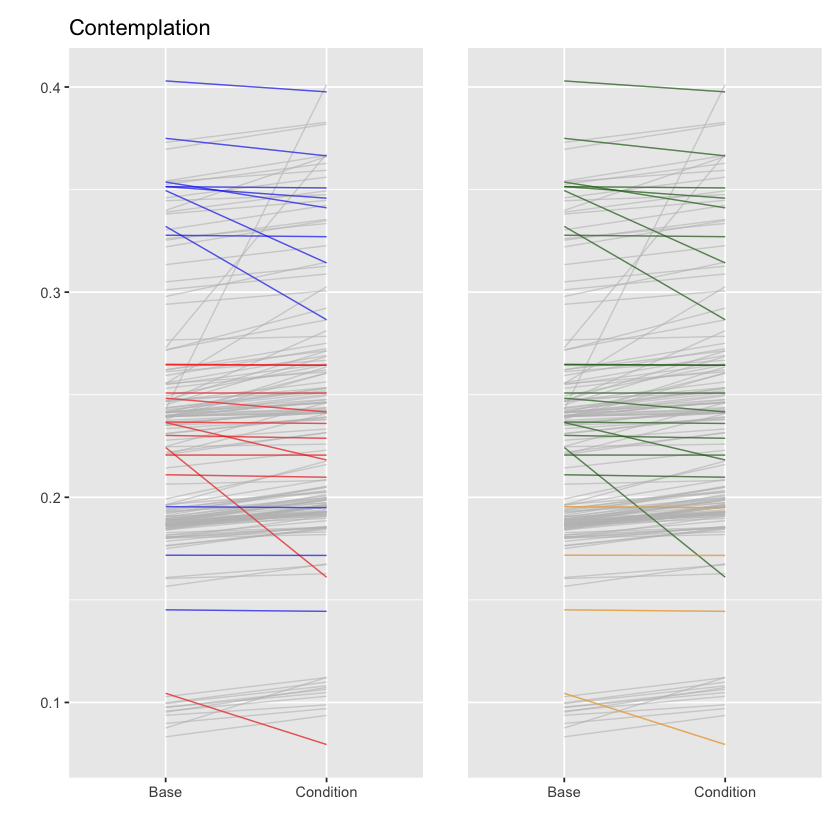

In [219]:
p1 <- p %>% ggplot( aes(x=Contemplation, y=Estimate, group=factor(docauthorid), color=factor(Female))) +
    geom_line(alpha = .6, size = .4)+
#geom_jitter(alpha = .4, size = 2, width = .25)+
  scale_x_discrete(labels=c("0" = "Base", "1" = "Condition"))+
ylab("")+ 
xlab("")+ 
scale_color_manual(values = c("blue", "red"))+ # gghighlight authors
#scale_color_manual(values = c("red"))+ # gghighlight women
theme(legend.position = "none", legend.title = element_blank())+
#ylim(-.1, .7)+
ggtitle("Contemplation")+
gghighlight(docauthorid %in% idsO)
#gghighlight(Female == 1)

p0 <- p %>% ggplot( aes(x=Contemplation, y=Estimate, group=factor(docauthorid), color=factor(Irish))) +
    geom_line(alpha = .6, size = .4)+
#geom_jitter(alpha = .4, size = 2, width = .25)+
  scale_x_discrete(labels=c("0" = "Base", "1" = "Condition"))+
ylab("")+ 
xlab("")+ 
scale_color_manual(values = c("orange", "darkgreen"))+ # gghighlight authors
#scale_color_manual(values = c("red"))+ # gghighlight women
theme(legend.position = "none", legend.title = element_blank(), axis.text.y = element_blank(), axis.ticks.y = element_blank())+
#ylim(-.1, .7)+
ggtitle("")+
gghighlight(docauthorid %in% idsO)
#gghighlight(Female == 1)

p1 & p0 

#ggsave("20250426_PhD_SenPeo.jpg")

In [220]:
# Most typical

ids <- ranef(f5ppSFIxLClMsSocSelTopIS, probs = c(.05, .95))$docauthorid[,,"Contemplation1"]%>%
data.frame()%>%
arrange(abs(Estimate))%>%
slice(1:10)

ids

df[df$docauthorid %in% rownames(ids),] %>% 
select(docauthorid, authorName, nationalOrigin, authorGender) %>% 
unique() %>%
arrange(ids)


,Estimate,Est.Error,Q5,Q95
,<dbl>,<dbl>,<dbl>,<dbl>
IED0625,0.00002053480,0.1330619,-0.2112767,0.2172737
per0036380,-0.00006576897,0.1317355,-0.2028420,0.2074951
IED0208,0.00019608372,0.1352966,-0.2139049,0.2202124
IED0275,-0.00020687979,0.1338906,-0.2167359,0.2198229
IED0665,0.00025355900,0.1298745,-0.2140139,0.2172349
IED0587,-0.00026315269,0.1351260,-0.2123513,0.2224413
per0004490,0.00028300378,0.1293201,-0.2121266,0.2177030
IED0701,0.00030739713,0.1259315,-0.2046085,0.2055821
per0038053,0.00030833858,0.1305407,-0.2074608,0.2164081


docauthorid,authorName,nationalOrigin,authorGender
<fct>,<fct>,<fct>,<fct>
per0036380,NA,Scottish,M
IED0625,Maggie J. Martin,Irish,F
IED0701,Edith Gass,Irish,F
IED0665,Mary Irvine,Irish,F
IED0587,Lena,Irish,F
IED0275,Hannah Dodd,Irish,F
IED0208,Elizabeth Flemming,Irish,F
per0004490,Hugh X. Hughes,Welsh,M
per0038053,Robert Harris,English,M


In [291]:
p <- f %>%filter(lateCentury == 0 & Canada == 0 & lowMonths == 0, 
                  Weather == 0, Money == 0, Farming == 0, People == 0,
                  Setting == 0, Family == 0, Travel == 0, Difficulty == 0, Government == 0,
                  mentsRate.s == 0, fppAllRate.s == 0)

on <- p %>%
filter(Contemplation == 1) %>%
select(docauthorid, Estimate, People, Female, Irish) %>%
arrange(docauthorid)%>%
rename(idOn = 1, EstOn= 2)

off <- p %>%
filter(Contemplation == 0) %>%
select(docauthorid, Estimate, People, Female, Irish) %>%
arrange(docauthorid) %>%
rename(idOff = 1, EstOff = 2)

combined <- cbind(on, off)[,c(1:2, 4:5, 7)]
#combined
#combined$idOn == combined$idOff

combined %>%
mutate(diff = abs(EstOff - EstOn))%>%
#arrange(desc(diff))%>%
filter(diff >= .1)%>% # These are writers with effects over .1 
arrange(desc(diff))

idsO <- combined %>%
mutate(diff = abs(EstOff - EstOn))%>%
arrange(desc(diff))%>%
filter(diff >= 0.1)%>%
#slice(1:2)#%>%
pull(idOn)

#idsO

df[df$docauthorid %in% idsO,] %>% select(docauthorid, authorName, nationalOrigin, authorGender) %>% unique() #%>% factorize() %>% summary()

idOn,EstOn,Female,Irish,EstOff,diff
<fct>,<dbl>,<fct>,<fct>,<dbl>,<dbl>
IED0212,0.4012141,1,1,0.2428401,0.1583739


,docauthorid,authorName,nationalOrigin,authorGender
,<fct>,<fct>,<fct>,<fct>
32,IED0212,Ellen S. Dunlop,Irish,F


Warning message:
“Tried to calculate with group_by(), but the calculation failed.
Falling back to ungrouped filter operation...”
Warning message:
“Tried to calculate with group_by(), but the calculation failed.
Falling back to ungrouped filter operation...”


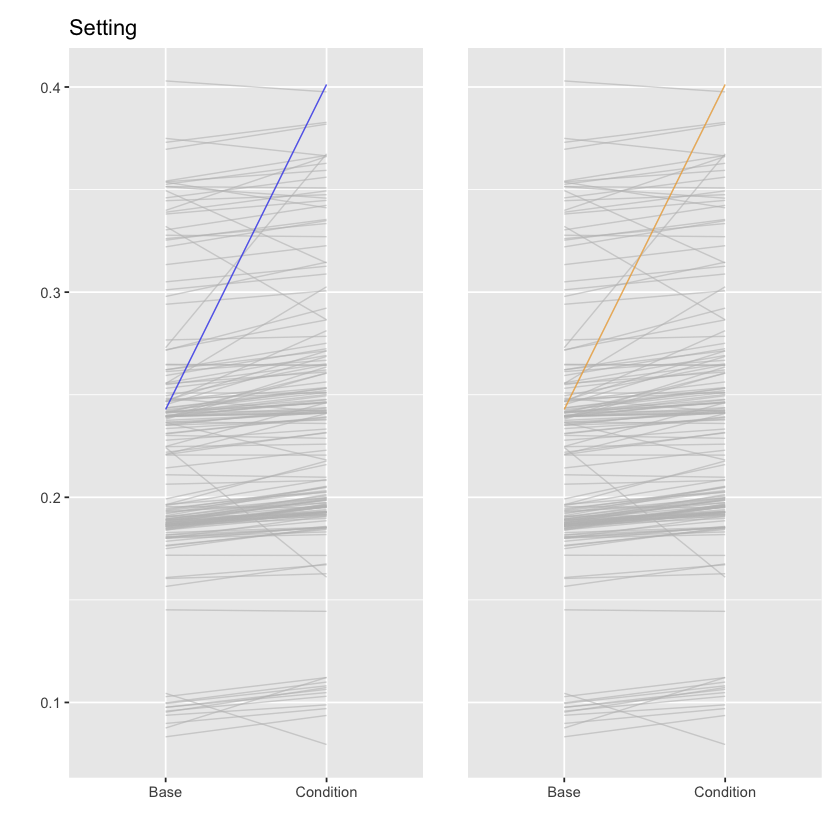

In [234]:
p1 <- p %>% ggplot( aes(x=Contemplation, y=Estimate, group=factor(docauthorid), color=factor(Female))) +
    geom_line(alpha = .6, size = .4)+
#geom_jitter(alpha = .4, size = 2, width = .25)+
  scale_x_discrete(labels=c("0" = "Base", "1" = "Condition"))+
ylab("")+ 
xlab("")+ 
scale_color_manual(values = c("blue", "red"))+ # gghighlight authors
#scale_color_manual(values = c("red"))+ # gghighlight women
theme(legend.position = "none", legend.title = element_blank())+
#ylim(-.1, .7)+
ggtitle("Setting")+
gghighlight(docauthorid %in% idsO)
#gghighlight(Female == 1)

p0 <- p %>% ggplot( aes(x=Contemplation, y=Estimate, group=factor(docauthorid), color=factor(Irish))) +
    geom_line(alpha = .6, size = .4)+
#geom_jitter(alpha = .4, size = 2, width = .25)+
  scale_x_discrete(labels=c("0" = "Base", "1" = "Condition"))+
ylab("")+ 
xlab("")+ 
scale_color_manual(values = c("orange", "darkgreen"))+ # gghighlight authors
#scale_color_manual(values = c("red"))+ # gghighlight women
theme(legend.position = "none", legend.title = element_blank(), axis.text.y = element_blank(), axis.ticks.y = element_blank())+
#ylim(-.1, .7)+
ggtitle("")+
gghighlight(docauthorid %in% idsO)
#gghighlight(Female == 1)

p1 & p0 

#ggsave("20250426_PhD_SenPeo.jpg")

## Family

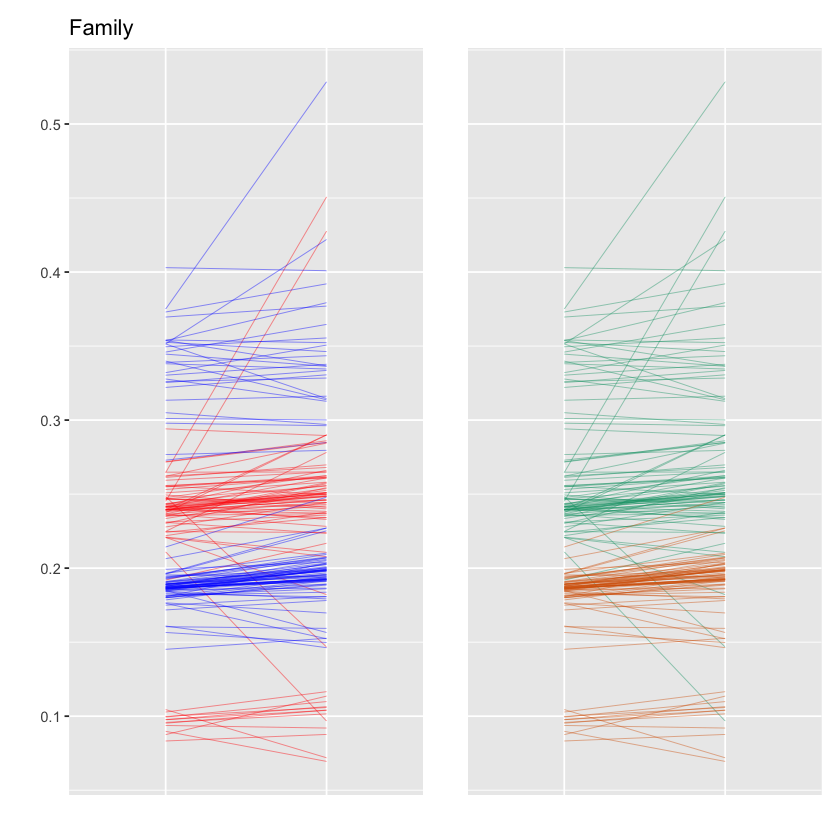

In [227]:
p <- f %>%filter(lateCentury == 0 & Canada == 0 & lowMonths == 0, 
                  Weather == 0, Money == 0, Farming == 0, People == 0,
                  Setting == 0, Contemplation == 0, Travel == 0, Difficulty == 0, Government == 0,
                  mentsRate.s == 0, fppAllRate.s == 0)

p11 <- p %>% ggplot( aes(x=factor(Family), y=Estimate, group=factor(docauthorid), color=factor(Female))) +
geom_line(alpha = .6, size = .2)+
#scale_x_discrete(labels=c("0" = "Correspondence", "1" = "Weather"))+
xlab("")+ 
ylab("")+
scale_color_manual(values = c("blue", "red"))+
theme(legend.position = "none", legend.title = element_blank(), 
      axis.ticks.x = element_blank(), axis.text.x = element_blank())+
#ylim(-.2, .45)+
ggtitle("Family")#+
#gghighlight(Female == 1)

p12 <- p %>% ggplot( aes(x=factor(Family), y=Estimate, group=factor(docauthorid), color=factor(Irish))) +
geom_line(alpha = .6, size = .2)+
#scale_x_discrete(labels=c("0" = "Correspondence", "1" = "Weather"))+
xlab("")+ 
ylab("")+
scale_color_manual(values = c("#D55E00", "#009E73"))+
theme(legend.position = "none", legend.title = element_blank(), 
      axis.ticks = element_blank(), axis.text.x = element_blank(), axis.text.y = element_blank())+
#ylim(-.2, .45)+
ggtitle("")#+
#gghighlight(Female == 1)

p11 & p12

In [276]:
p <- f %>%filter(lateCentury == 0 & Canada == 0 & lowMonths == 0, 
                  Weather == 0, Money == 0, Farming == 0, People == 0,
                  Setting == 0, Contemplation == 0, Travel == 0, Difficulty == 0, Government == 0,
                  mentsRate.s == 0, fppAllRate.s == 0)

on <- p %>%
filter(Family == 1) %>%
select(docauthorid, Estimate, mentsRate.s, Female, Irish) %>%
arrange(docauthorid)%>%
rename(idOn = 1, EstOn= 2)

off <- p %>%
filter(Family == 0) %>%
select(docauthorid, Estimate, mentsRate.s, Female, Irish) %>%
arrange(docauthorid) %>%
rename(idOff = 1, EstOff = 2)

combined <- cbind(on, off)[,c(1:2, 4:5, 7)]
#combined <- cbind(on, off)
#combined$idOn == combined$idOff

idsO <- combined %>%
mutate(diff = EstOff - EstOn)%>%
arrange(desc(diff))%>%
filter(diff > 0)%>%
#slice(1:2)#%>%
pull(idOn)

combined %>%
mutate(diff = EstOff - EstOn)%>%
arrange(desc(diff))%>%
filter(diff > 0)%>% # These are writers who have a negative slope. The greatest is Jane Fleming.
arrange(desc(diff))#%>%
#summary()

#idsO

df[df$docauthorid %in% idsO,] %>% select(docauthorid, authorName, nationalOrigin, authorGender) %>% unique()

#combined[combined$EstOff > combined$EstOn,]

idOn,EstOn,Female,Irish,EstOff,diff
<fct>,<dbl>,<fct>,<fct>,<dbl>,<dbl>
IED0267,0.09669499,1,1,0.21099856,0.1143035658
IED0692,0.14674140,1,1,0.24831494,0.1015735319
IED0314,0.18207610,1,1,0.22078321,0.0387071132
IED0089.89,0.31451069,0,1,0.35144340,0.0369327144
per0004772,0.07188425,1,0,0.10446180,0.0325775512
per0022766,0.15649951,0,0,0.18491646,0.0284169505
IED0403,0.31368786,0,1,0.33985065,0.0261627941
per0038053,0.15227360,0,0,0.17621685,0.0239432467
per0038055,0.06944097,1,0,0.08975612,0.0203151473


,docauthorid,authorName,nationalOrigin,authorGender
,<fct>,<fct>,<fct>,<fct>
12,IED0314,Isabella Marshall Allen,Irish,F
42,IED0451,Jane Fleming,Irish,F
53,IED0403,James Gamble,Irish,M
61,IED0714,Susan Blun,Irish,F
68,IED0932,Thomas W. Coskery,Irish,M
73,IED0075,Annie Wyly,Irish,F
94,IED0030,Ada C. Edgar,Irish,F
122,IED0661,Mary Cumming,Irish,F
138,IED0692,Mitilda Ferguson,Irish,F


Warning message:
“Tried to calculate with group_by(), but the calculation failed.
Falling back to ungrouped filter operation...”
Warning message:
“Tried to calculate with group_by(), but the calculation failed.
Falling back to ungrouped filter operation...”


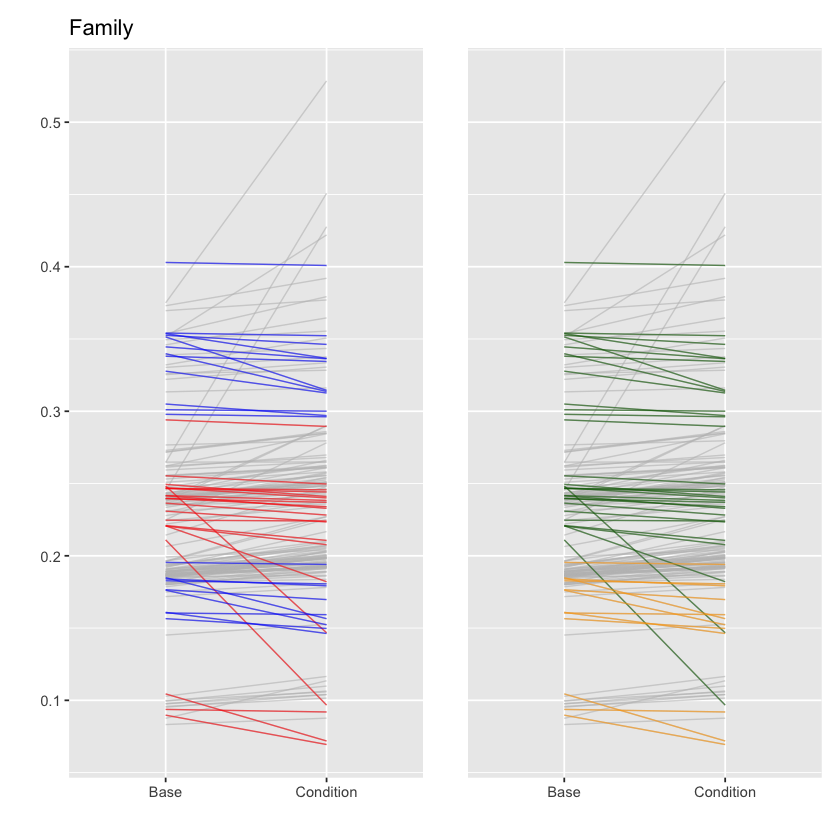

In [229]:
p1 <- p %>% ggplot( aes(x=Family, y=Estimate, group=factor(docauthorid), color=factor(Female))) +
    geom_line(alpha = .6, size = .4)+
#geom_jitter(alpha = .4, size = 2, width = .25)+
  scale_x_discrete(labels=c("0" = "Base", "1" = "Condition"))+
ylab("")+ 
xlab("")+ 
scale_color_manual(values = c("blue", "red"))+ # gghighlight authors
#scale_color_manual(values = c("red"))+ # gghighlight women
theme(legend.position = "none", legend.title = element_blank())+
#ylim(-.1, .7)+
ggtitle("Family")+
gghighlight(docauthorid %in% idsO)
#gghighlight(Female == 1)

p0 <- p %>% ggplot( aes(x=Family, y=Estimate, group=factor(docauthorid), color=factor(Irish))) +
    geom_line(alpha = .6, size = .4)+
#geom_jitter(alpha = .4, size = 2, width = .25)+
  scale_x_discrete(labels=c("0" = "Base", "1" = "Condition"))+
ylab("")+ 
xlab("")+ 
scale_color_manual(values = c("orange", "darkgreen"))+ # gghighlight authors
#scale_color_manual(values = c("red"))+ # gghighlight women
theme(legend.position = "none", legend.title = element_blank(), axis.text.y = element_blank(), axis.ticks.y = element_blank())+
#ylim(-.1, .7)+
ggtitle("")+
gghighlight(docauthorid %in% idsO)
#gghighlight(Female == 1)

p1 & p0 

#ggsave("20250426_PhD_SenPeo.jpg")

In [230]:
# Most typical

ids <- ranef(f5ppSFIxLClMsSocSelTopIS, probs = c(.05, .95))$docauthorid[,,"Family1"]%>%
data.frame()%>%
arrange(abs(Estimate))%>%
slice(1:10)

ids

df[df$docauthorid %in% rownames(ids),] %>% 
select(docauthorid, authorName, nationalOrigin, authorGender) %>% 
unique() %>%
arrange(ids)


,Estimate,Est.Error,Q5,Q95
,<dbl>,<dbl>,<dbl>,<dbl>
per0025682,0.000004265095,0.1237703,-0.1998324,0.2085406
per0026978b,0.000059965973,0.1271701,-0.2020917,0.2103129
per0031346,0.000108251061,0.1250001,-0.2015486,0.2042151
IED0276,0.000124029740,0.1279940,-0.2073934,0.2091454
IED0719,0.000216281109,0.1245836,-0.2037815,0.2066395
IED0068,0.000222327743,0.1306360,-0.2095366,0.2244297
IED0179,-0.000265732464,0.1209365,-0.1993683,0.1996867
per0038828,0.000289129748,0.1187272,-0.2013220,0.1981426
per0036385,0.000324931523,0.1243132,-0.2032519,0.1977391


docauthorid,authorName,nationalOrigin,authorGender
<fct>,<fct>,<fct>,<fct>
per0038828,Thomas Graham,Irish,M
per0026978b,Margaret Carrothers,Irish,F
IED0179,E. Rothwell,Irish,F
IED0068,Ann Forrest,Irish,F
IED0276,Hannah J. Smith,Irish,F
IED0719,Fannie Haslett,Irish,F
per0031346,William Bebb,Welsh,M
per0025682,Patrick Mee,Irish,M
per0029194,NA,Scottish,M


In [277]:
p <- f %>%filter(lateCentury == 0 & Canada == 0 & lowMonths == 0, 
                  Weather == 0, Money == 0, Farming == 0, Setting == 0,
                  Contemplation == 0, People == 0, Travel == 0, Difficulty == 0, Government == 0,
                  mentsRate.s == 0, fppAllRate.s == 0)

on <- p %>%
filter(Family == 1) %>%
select(docauthorid, Estimate, Family, Female, Irish) %>%
arrange(docauthorid)%>%
rename(idOn = 1, EstOn= 2)

off <- p %>%
filter(Family == 0) %>%
select(docauthorid, Estimate, Family, Female, Irish) %>%
arrange(docauthorid) %>%
rename(idOff = 1, EstOff = 2)

combined <- cbind(on, off)[,c(1:2, 4:5, 7)]
#combined
#combined$idOn == combined$idOff

combined %>%
mutate(diff = abs(EstOff - EstOn))%>%
arrange(desc(diff))%>%
filter(diff >= .1)%>% # These are writers with effects over .1 
arrange(desc(diff))

idsO <- combined %>%
mutate(diff = abs(EstOff - EstOn))%>%
arrange(desc(diff))%>%
filter(diff >= .1)%>%
#slice(1:2)#%>%
pull(idOn)

#idsO

df[df$docauthorid %in% idsO,] %>% select(docauthorid, authorName, nationalOrigin, authorGender) %>% unique()

idOn,EstOn,Female,Irish,EstOff,diff
<fct>,<dbl>,<fct>,<fct>,<dbl>,<dbl>
IED0107,0.45080407,1,1,0.2645772,0.1862269
IED0070,0.42769096,1,1,0.2451350,0.1825560
IED0374,0.52856823,0,1,0.3749839,0.1535844
IED0267,0.09669499,1,1,0.2109986,0.1143036
IED0692,0.14674140,1,1,0.2483149,0.1015735


,docauthorid,authorName,nationalOrigin,authorGender
,<fct>,<fct>,<fct>,<fct>
1,IED0107,Isabella Weir Moore,Irish,F
77,IED0070,Ann Jane Sinclair,Irish,F
87,IED0374,Jonathan W. Smith,Irish,M
138,IED0692,Mitilda Ferguson,Irish,F
291,IED0267,Hannah B. Longstreet,Irish,F


Warning message:
“Tried to calculate with group_by(), but the calculation failed.
Falling back to ungrouped filter operation...”
Warning message:
“Tried to calculate with group_by(), but the calculation failed.
Falling back to ungrouped filter operation...”


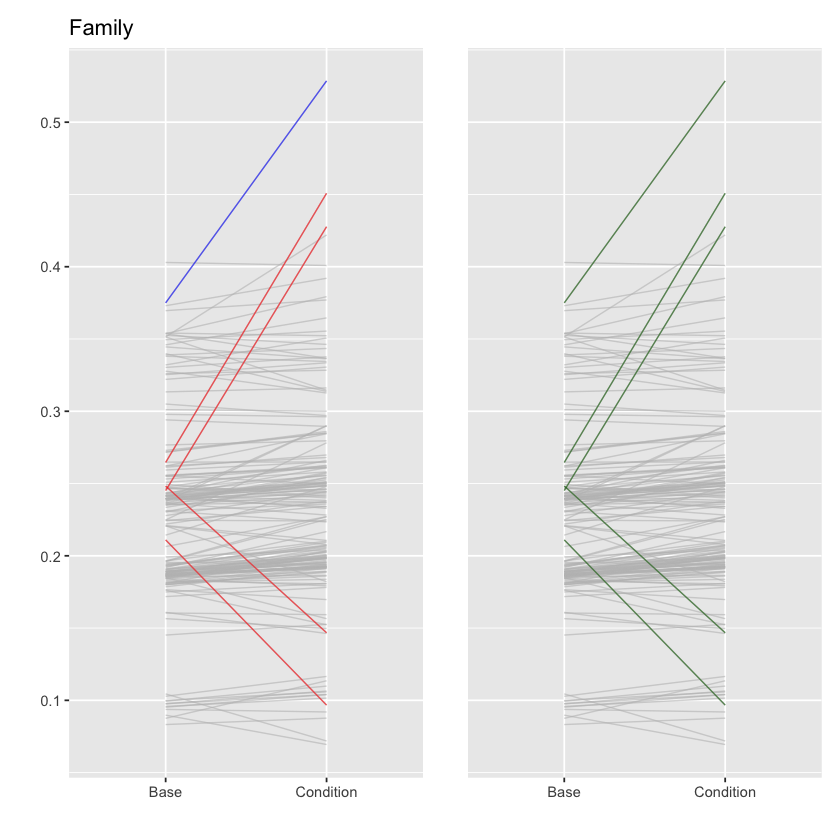

In [278]:
p1 <- p %>% ggplot( aes(x=Family, y=Estimate, group=factor(docauthorid), color=factor(Female))) +
    geom_line(alpha = .6, size = .4)+
#geom_jitter(alpha = .4, size = 2, width = .25)+
  scale_x_discrete(labels=c("0" = "Base", "1" = "Condition"))+
ylab("")+ 
xlab("")+ 
scale_color_manual(values = c("blue", "red"))+ # gghighlight authors
#scale_color_manual(values = c("red"))+ # gghighlight women
theme(legend.position = "none", legend.title = element_blank())+
#ylim(-.1, .7)+
ggtitle("Family")+
gghighlight(docauthorid %in% idsO)
#gghighlight(Female == 1)

p0 <- p %>% ggplot( aes(x=Family, y=Estimate, group=factor(docauthorid), color=factor(Irish))) +
    geom_line(alpha = .6, size = .4)+
#geom_jitter(alpha = .4, size = 2, width = .25)+
  scale_x_discrete(labels=c("0" = "Base", "1" = "Condition"))+
ylab("")+ 
xlab("")+ 
scale_color_manual(values = c("darkgreen"))+ # gghighlight authors
#scale_color_manual(values = c("red"))+ # gghighlight women
theme(legend.position = "none", legend.title = element_blank(), axis.text.y = element_blank(), axis.ticks.y = element_blank())+
#ylim(-.1, .7)+
ggtitle("")+
gghighlight(docauthorid %in% idsO)
#gghighlight(Female == 1)

p1 & p0 

#ggsave("20250426_PhD_SenPeo.jpg")

## Travel

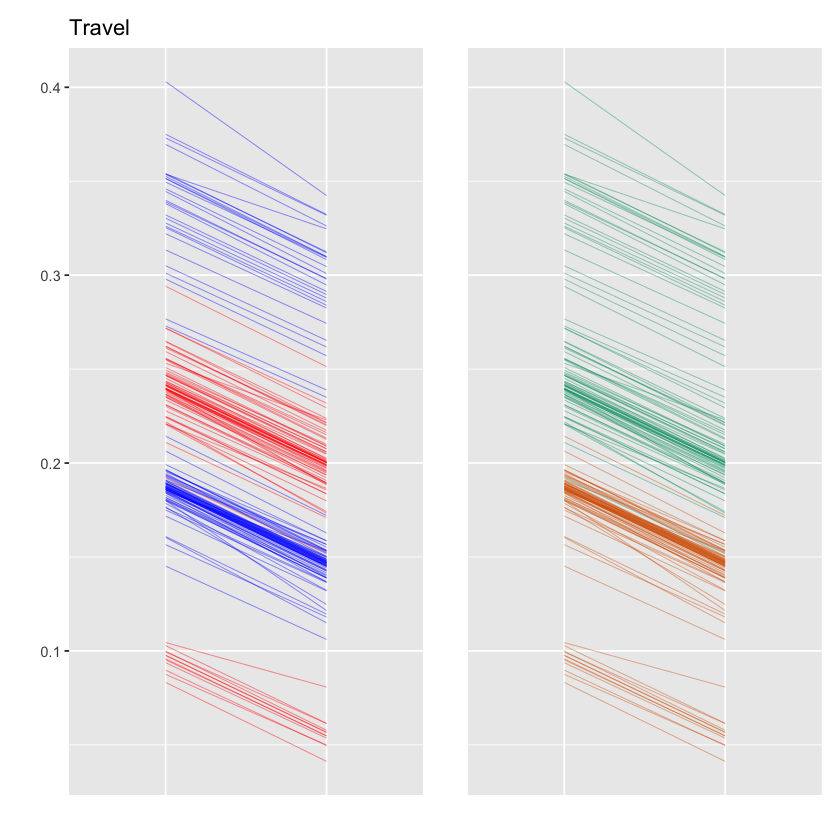

In [237]:
p <- f %>%filter(lateCentury == 0 & Canada == 0 & lowMonths == 0, 
                  Weather == 0, Money == 0, Farming == 0, People == 0,
                  Setting == 0, Contemplation == 0, Family == 0, Difficulty == 0, Government == 0,
                  mentsRate.s == 0, fppAllRate.s == 0)

p13 <- p %>% ggplot( aes(x=factor(Travel), y=Estimate, group=factor(docauthorid), color=factor(Female))) +
geom_line(alpha = .6, size = .2)+
#scale_x_discrete(labels=c("0" = "Correspondence", "1" = "Weather"))+
xlab("")+ 
ylab("")+
scale_color_manual(values = c("blue", "red"))+
theme(legend.position = "none", legend.title = element_blank(), 
      axis.ticks.x = element_blank(), axis.text.x = element_blank())+
#ylim(-.2, .45)+
ggtitle("Travel")#+
#gghighlight(Female == 1)

p14 <- p %>% ggplot( aes(x=factor(Travel), y=Estimate, group=factor(docauthorid), color=factor(Irish))) +
geom_line(alpha = .6, size = .2)+
#scale_x_discrete(labels=c("0" = "Correspondence", "1" = "Weather"))+
xlab("")+ 
ylab("")+
scale_color_manual(values = c("#D55E00", "#009E73"))+
theme(legend.position = "none", legend.title = element_blank(), 
      axis.ticks = element_blank(), axis.text.x = element_blank(), axis.text.y = element_blank())+
#ylim(-.2, .45)+
ggtitle("")#+
#gghighlight(Female == 1)

p13 & p14

In [238]:
# Most typical

ids <- ranef(f5ppSFIxLClMsSocSelTopIS, probs = c(.05, .95))$docauthorid[,,"Travel1"]%>%
data.frame()%>%
arrange(abs(Estimate))%>%
slice(1:10)

ids

df[df$docauthorid %in% rownames(ids),] %>% 
select(docauthorid, authorName, nationalOrigin, authorGender) %>% 
unique() %>%
arrange(ids)


,Estimate,Est.Error,Q5,Q95
,<dbl>,<dbl>,<dbl>,<dbl>
IED0645,-0.0000009900434,0.04482117,-0.07109420,0.07054727
per0036385,-0.0000045070936,0.04641890,-0.07316576,0.07176274
per0036149,0.0000182898646,0.04436980,-0.07106193,0.06876803
per0027083,0.0000206981538,0.04420674,-0.06899244,0.07009464
IED0072,-0.0000231803539,0.04827941,-0.07528067,0.07666738
per0004549,0.0000259949565,0.04581732,-0.07351023,0.07202903
per0027085,0.0000267756924,0.04218072,-0.06725763,0.06698616
IED0200,0.0000329384283,0.04331139,-0.06793933,0.07007024
per0029201,-0.0000381520760,0.04279087,-0.06868712,0.07135020


docauthorid,authorName,nationalOrigin,authorGender
<fct>,<fct>,<fct>,<fct>
per0036385,NA,Scottish,M
per0029201,D. McKenzie,Scottish,M
per0004549,Ann Ellis,Welsh,F
IED0200,Eliza C. Hisson,Irish,F
IED0719,Fannie Haslett,Irish,F
IED0645,Marion D. Wilson,Irish,F
IED0072,Anna Heather,Irish,F
per0027083,NA,English,M
per0027085,NA,English,M


## Difficulty

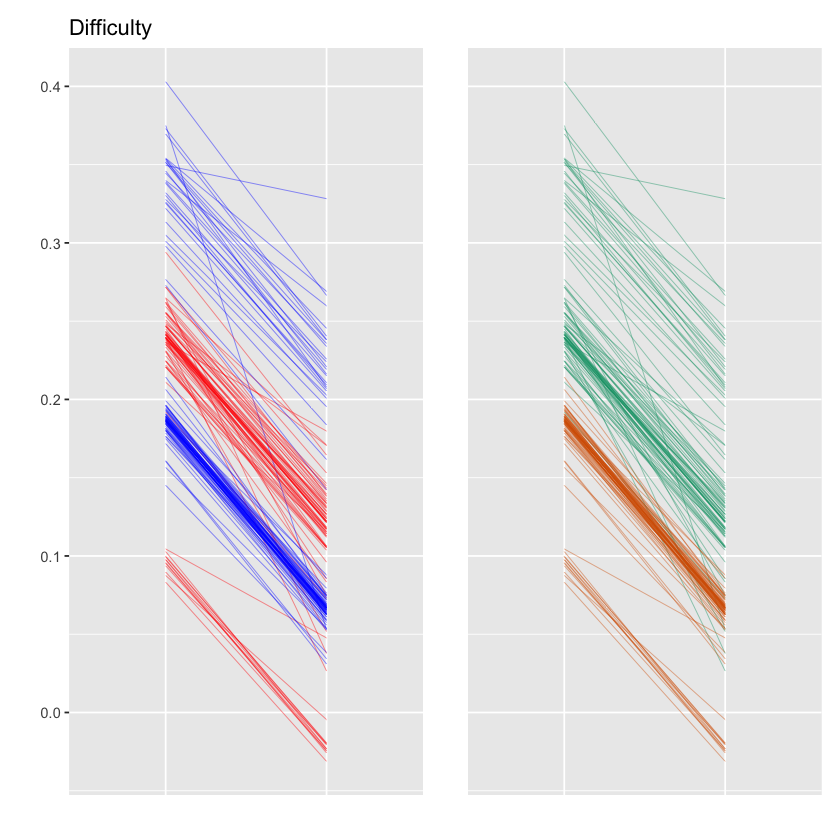

In [264]:
p <- f %>%filter(lateCentury == 0 & Canada == 0 & lowMonths == 0, 
                  Weather == 0, Money == 0, Farming == 0, People == 0,
                  Setting == 0, Contemplation == 0, Family == 0, Travel == 0, Government == 0,
                  mentsRate.s == 0, fppAllRate.s == 0)

p15 <- p %>% ggplot( aes(x=factor(Difficulty), y=Estimate, group=factor(docauthorid), color=factor(Female))) +
geom_line(alpha = .6, size = .2)+
#scale_x_discrete(labels=c("0" = "Correspondence", "1" = "Weather"))+
xlab("")+ 
ylab("")+
scale_color_manual(values = c("blue", "red"))+
theme(legend.position = "none", legend.title = element_blank(), 
      axis.ticks.x = element_blank(), axis.text.x = element_blank())+
#ylim(-.2, .45)+
ggtitle("Difficulty")#+
#gghighlight(Female == 1)

p16 <- p %>% ggplot( aes(x=factor(Difficulty), y=Estimate, group=factor(docauthorid), color=factor(Irish))) +
geom_line(alpha = .6, size = .2)+
#scale_x_discrete(labels=c("0" = "Correspondence", "1" = "Weather"))+
xlab("")+ 
ylab("")+
scale_color_manual(values = c("#D55E00", "#009E73"))+
theme(legend.position = "none", legend.title = element_blank(), 
      axis.ticks = element_blank(), axis.text.x = element_blank(), axis.text.y = element_blank())+
#ylim(-.2, .45)+
ggtitle("")#+
#gghighlight(Female == 1)

p15 & p16

In [265]:
# Most typical

ids <- ranef(f5ppSFIxLClMsSocSelTopIS, probs = c(.05, .95))$docauthorid[,,"Difficulty1"]%>%
data.frame()%>%
arrange(abs(Estimate))%>%
slice(1:10)

ids

df[df$docauthorid %in% rownames(ids),] %>% 
select(docauthorid, authorName, nationalOrigin, authorGender) %>% 
unique() %>%
arrange(ids)


,Estimate,Est.Error,Q5,Q95
,<dbl>,<dbl>,<dbl>,<dbl>
per0029196,-0.00002435569,0.09649935,-0.1550207,0.1655128
per0029200,0.00012923531,0.11688103,-0.1984083,0.1905359
IED0129,-0.00013936797,0.11721512,-0.1905901,0.1896808
IED0592,0.00023594366,0.11614452,-0.1883465,0.1902225
per0031335,-0.00023766963,0.11489228,-0.1921187,0.1945917
per0027083,-0.00031703303,0.11552052,-0.1963236,0.1903026
IED0594,0.00034272520,0.11879848,-0.1909642,0.1993325
per0035059,0.00039344038,0.11505967,-0.1842701,0.1907330
per0036149,-0.00039950750,0.11753394,-0.1893399,0.1920951


docauthorid,authorName,nationalOrigin,authorGender
<fct>,<fct>,<fct>,<fct>
per0029200,NA,Scottish,M
per0027083,NA,English,M
per0026978b,Margaret Carrothers,Irish,F
IED0592,Lizzie Moore,Irish,F
IED0129,Catharine Bradley,Irish,F
IED0594,Lorena Ramsey,Irish,F
per0031335,Lewis Howell Jr,Welsh,M
per0036149,NA,English,F
per0029196,NA,Scottish,M


In [266]:
# Least typical

ids <- ranef(f5ppSFIxLClMsSocSelTopIS, probs = c(.05, .95))$docauthorid[,,"Difficulty1"]%>%
data.frame()%>%
arrange(desc(abs(Estimate)))%>%
slice(1:10)

ids

df[df$docauthorid %in% rownames(ids),] %>% 
select(docauthorid, authorName, nationalOrigin, authorGender) %>% 
unique() %>%
arrange(ids)

,Estimate,Est.Error,Q5,Q95
,<dbl>,<dbl>,<dbl>,<dbl>
IED0374,-0.20194771,0.12913246,-0.42253646,-0.004987327
IED0107,-0.10679147,0.11791584,-0.32071262,0.057887349
IED0572,0.09880470,0.08580485,-0.02289266,0.253475127
IED0621,-0.09285967,0.11794475,-0.31371670,0.065024434
IED0078,-0.06717049,0.10353982,-0.24834390,0.083536041
IED0661,0.06342183,0.06237621,-0.02901047,0.171118846
per0004772,0.06326404,0.04893464,-0.01060088,0.147077781
IED0275,-0.05937268,0.10247661,-0.24251185,0.094176855
IED0692,0.04232870,0.11671613,-0.13040006,0.248993027


docauthorid,authorName,nationalOrigin,authorGender
<fct>,<fct>,<fct>,<fct>
IED0107,Isabella Weir Moore,Irish,F
IED0621,Mary Savage,Irish,F
IED0403,James Gamble,Irish,M
IED0374,Jonathan W. Smith,Irish,M
IED0275,Hannah Dodd,Irish,F
per0004772,Susannah Strickland Moodie,English,F
IED0078,Anne J. Walters,Irish,F
IED0692,Mitilda Ferguson,Irish,F
IED0661,Mary Cumming,Irish,F


Warning message:
“Tried to calculate with group_by(), but the calculation failed.
Falling back to ungrouped filter operation...”
Warning message:
“Tried to calculate with group_by(), but the calculation failed.
Falling back to ungrouped filter operation...”


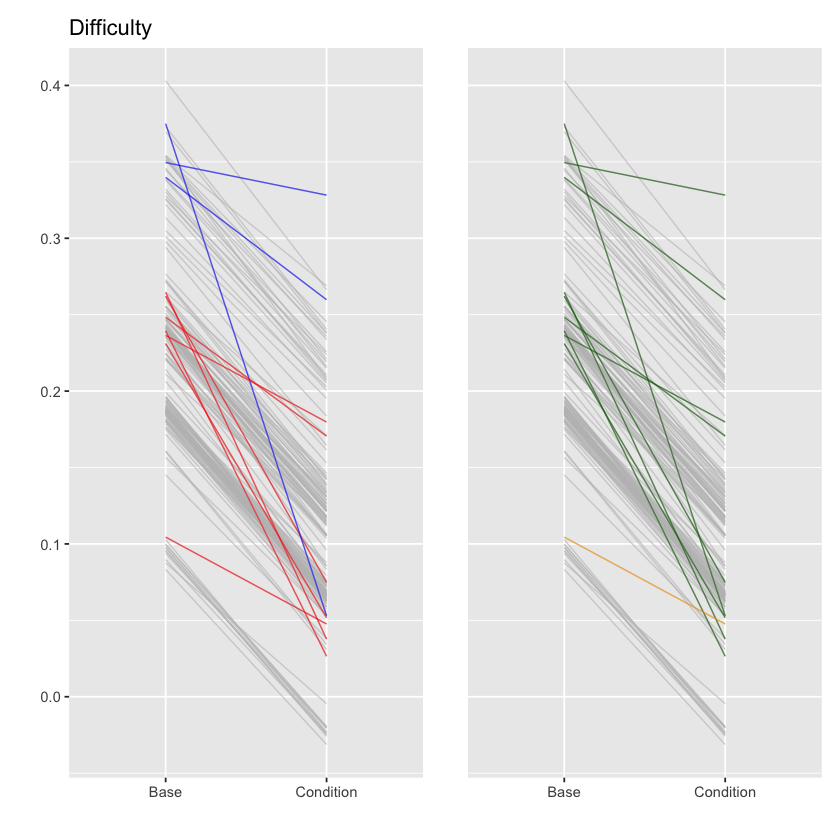

In [267]:
p1 <- p %>% ggplot( aes(x=Difficulty, y=Estimate, group=factor(docauthorid), color=factor(Female))) +
    geom_line(alpha = .6, size = .4)+
#geom_jitter(alpha = .4, size = 2, width = .25)+
  scale_x_discrete(labels=c("0" = "Base", "1" = "Condition"))+
ylab("")+ 
xlab("")+ 
scale_color_manual(values = c("blue", "red"))+ # gghighlight authors
#scale_color_manual(values = c("red"))+ # gghighlight women
theme(legend.position = "none", legend.title = element_blank())+
#ylim(-.1, .7)+
ggtitle("Difficulty")+
gghighlight(docauthorid %in% rownames(ids))
#gghighlight(Female == 1)

p0 <- p %>% ggplot( aes(x=Difficulty, y=Estimate, group=factor(docauthorid), color=factor(Irish))) +
    geom_line(alpha = .6, size = .4)+
#geom_jitter(alpha = .4, size = 2, width = .25)+
  scale_x_discrete(labels=c("0" = "Base", "1" = "Condition"))+
ylab("")+ 
xlab("")+ 
scale_color_manual(values = c("orange", "darkgreen"))+ # gghighlight authors
#scale_color_manual(values = c("red"))+ # gghighlight women
theme(legend.position = "none", legend.title = element_blank(), axis.text.y = element_blank(), axis.ticks.y = element_blank())+
#ylim(-.1, .7)+
ggtitle("")+
gghighlight(docauthorid %in% rownames(ids))
#gghighlight(Female == 1)

p1 & p0 

#ggsave("20250426_PhD_SenPeo.jpg")

## Government

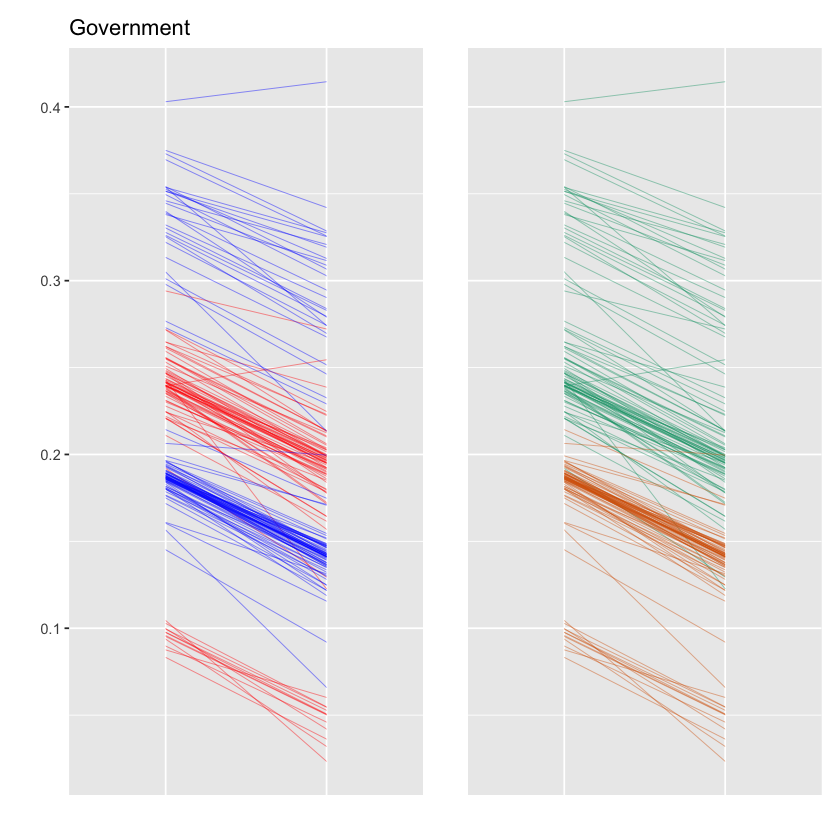

In [302]:
p <- f %>%filter(lateCentury == 0 & Canada == 0 & lowMonths == 0, 
                  Weather == 0, Money == 0, Farming == 0, People == 0,
                  Setting == 0, Contemplation == 0, Family == 0, Travel == 0, Difficulty == 0,
                  mentsRate.s == 0, fppAllRate.s == 0)

p17 <- p %>% ggplot( aes(x=factor(Government), y=Estimate, group=factor(docauthorid), color=factor(Female))) +
geom_line(alpha = .6, size = .2)+
#scale_x_discrete(labels=c("0" = "Correspondence", "1" = "Weather"))+
xlab("")+ 
ylab("")+
scale_color_manual(values = c("blue", "red"))+
theme(legend.position = "none", legend.title = element_blank(), 
      axis.ticks.x = element_blank(), axis.text.x = element_blank())+
#ylim(-.2, .45)+
ggtitle("Government")#+
#gghighlight(Female == 1)

p18 <- p %>% ggplot( aes(x=factor(Government), y=Estimate, group=factor(docauthorid), color=factor(Irish))) +
geom_line(alpha = .6, size = .2)+
#scale_x_discrete(labels=c("0" = "Correspondence", "1" = "Weather"))+
xlab("")+ 
ylab("")+
scale_color_manual(values = c("#D55E00", "#009E73"))+
theme(legend.position = "none", legend.title = element_blank(), 
      axis.ticks = element_blank(), axis.text.x = element_blank(), axis.text.y = element_blank())+
#ylim(-.2, .45)+
ggtitle("")#+
#gghighlight(Female == 1)

p17 & p18

In [303]:
# Most typical

ids <- ranef(f5ppSFIxLClMsSocSelTopIS, probs = c(.05, .95))$docauthorid[,,"Government1"]%>%
data.frame()%>%
arrange(abs(Estimate))%>%
slice(1:10)

ids

df[df$docauthorid %in% rownames(ids),] %>% 
select(docauthorid, authorName, nationalOrigin, authorGender, authorLocation) %>% 
unique() %>%
arrange(ids)


,Estimate,Est.Error,Q5,Q95
,<dbl>,<dbl>,<dbl>,<dbl>
IED0665,-0.00004643732,0.06954819,-0.1148208,0.1101372
per0038859,0.00005965992,0.07075085,-0.1197189,0.1154654
per0029199,-0.00012987420,0.07197781,-0.1175010,0.1186798
IED0028,0.00016218939,0.07305623,-0.1158492,0.1198251
IED0593,-0.00019302164,0.07077169,-0.1157364,0.1168694
per0025643,-0.00026578290,0.06906117,-0.1134459,0.1143850
per0025578,-0.00026794833,0.06944131,-0.1147615,0.1091427
IED0893,0.00034065029,0.07185551,-0.1190036,0.1151924
per0038053,0.00039325215,0.06801702,-0.1109360,0.1067722


docauthorid,authorName,nationalOrigin,authorGender,authorLocation
<fct>,<fct>,<fct>,<fct>,<fct>
per0038859,William Snelgrove,English,M,Canada
per0025643,James Humphrey,Irish,M,Canada
per0038053,Robert Harris,English,M,Canada
IED0028,Ada C. Burns,Irish,F,USA
IED0893,Thomas Bouchier,Irish,M,USA
IED0665,Mary Irvine,Irish,F,USA
IED0123,Charles Martin,Irish,M,USA
IED0593,Lizzie Wilson,Irish,F,USA
per0025578,NA,English,M,USA


In [304]:
# Least typical

ids <- ranef(f5ppSFIxLClMsSocSelTopIS, probs = c(.05, .95))$docauthorid[,,"Government1"]%>%
data.frame()%>%
arrange(desc(abs(Estimate)))%>%
slice(1:10)

ids

df[df$docauthorid %in% rownames(ids),] %>% 
select(docauthorid, authorName, nationalOrigin, authorGender, authorLocation) %>% 
unique() %>%
arrange(ids)

,Estimate,Est.Error,Q5,Q95
,<dbl>,<dbl>,<dbl>,<dbl>
IED0212,-0.07403301,0.10450491,-0.27904324,0.03603692
IED0621,0.06126454,0.08801058,-0.03279059,0.24138248
per0026978a,0.05769203,0.08517731,-0.04078546,0.22987685
IED1029,-0.04542112,0.07175801,-0.18500691,0.04009098
per0022846,-0.04448441,0.07561823,-0.19417566,0.04526973
per0029283,0.03940522,0.06974776,-0.04691725,0.17321550
per0004772,-0.03491647,0.04744680,-0.12426560,0.02343766
IED0552,-0.03346305,0.06483332,-0.16120633,0.04796203
IED0451,0.02427230,0.09872750,-0.11338685,0.20024199


docauthorid,authorName,nationalOrigin,authorGender,authorLocation
<fct>,<fct>,<fct>,<fct>,<fct>
IED0621,Mary Savage,Irish,F,USA
IED1029,William Redmond,Irish,M,USA
IED0655,Mary Ann Cathcart,Irish,F,USA
per0004772,Susannah Strickland Moodie,English,F,Canada
per0022846,Benjamin Williams Chidlaw,Welsh,M,USA
per0029283,J. McKenzie,Scottish,M,Canada
per0026978a,Nathaniel Carrothers,Irish,M,Canada
IED0552,John S Crawford,Irish,M,USA
IED0451,Jane Fleming,Irish,F,USA


Warning message:
“Tried to calculate with group_by(), but the calculation failed.
Falling back to ungrouped filter operation...”
Warning message:
“Tried to calculate with group_by(), but the calculation failed.
Falling back to ungrouped filter operation...”


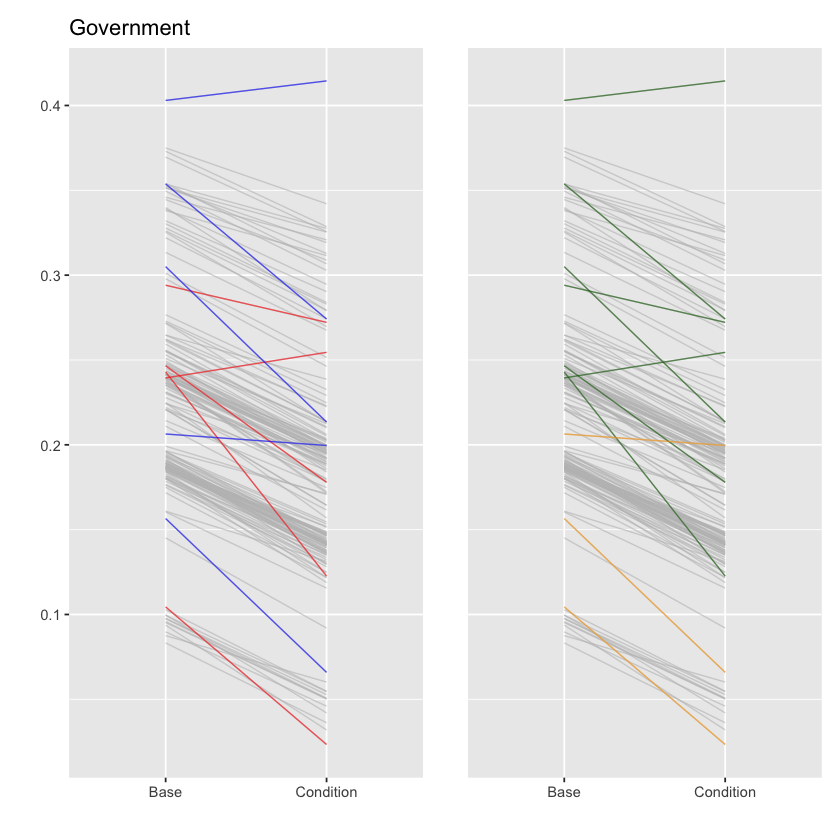

In [305]:
p1 <- p %>% ggplot( aes(x=Government, y=Estimate, group=factor(docauthorid), color=factor(Female))) +
    geom_line(alpha = .6, size = .4)+
#geom_jitter(alpha = .4, size = 2, width = .25)+
  scale_x_discrete(labels=c("0" = "Base", "1" = "Condition"))+
ylab("")+ 
xlab("")+ 
scale_color_manual(values = c("blue", "red"))+ # gghighlight authors
#scale_color_manual(values = c("red"))+ # gghighlight women
theme(legend.position = "none", legend.title = element_blank())+
#ylim(-.1, .7)+
ggtitle("Government")+
gghighlight(docauthorid %in% rownames(ids))
#gghighlight(Female == 1)

p0 <- p %>% ggplot( aes(x=Government, y=Estimate, group=factor(docauthorid), color=factor(Irish))) +
    geom_line(alpha = .6, size = .4)+
#geom_jitter(alpha = .4, size = 2, width = .25)+
  scale_x_discrete(labels=c("0" = "Base", "1" = "Condition"))+
ylab("")+ 
xlab("")+ 
scale_color_manual(values = c("orange", "darkgreen"))+ # gghighlight authors
#scale_color_manual(values = c("red"))+ # gghighlight women
theme(legend.position = "none", legend.title = element_blank(), axis.text.y = element_blank(), axis.ticks.y = element_blank())+
#ylim(-.1, .7)+
ggtitle("")+
gghighlight(docauthorid %in% rownames(ids))
#gghighlight(Female == 1)

p1 & p0 

#ggsave("20250426_PhD_SenPeo.jpg")

Saving 7 x 7 in image


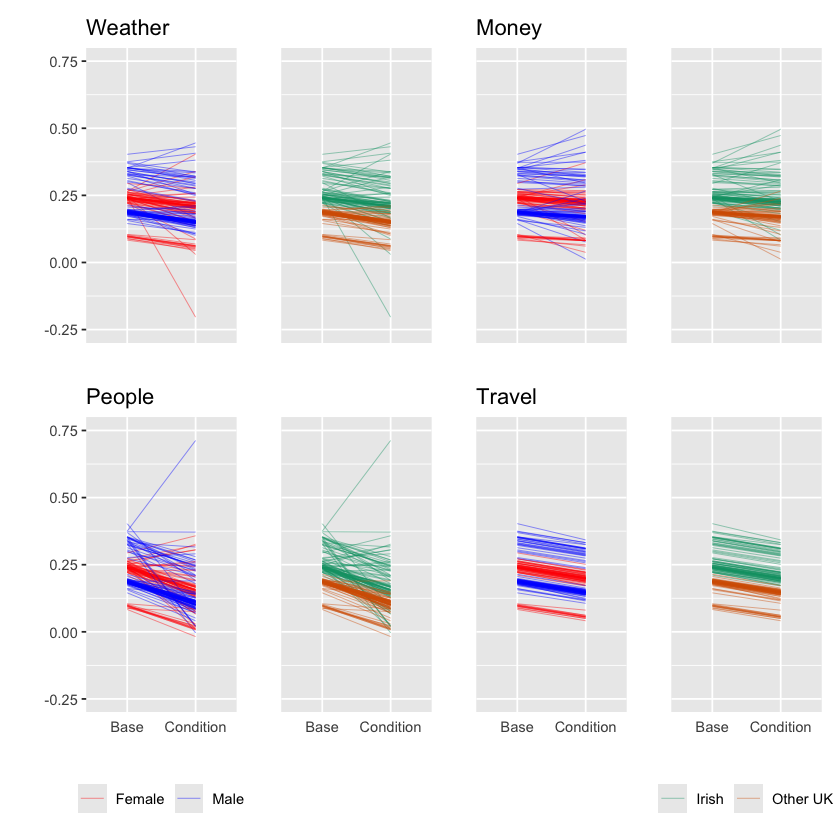

In [309]:
p <- f %>%filter(lateCentury == 0 & Canada == 0 & lowMonths == 0, 
                  Money == 0, Farming == 0, People == 0, Setting == 0,
                  Contemplation == 0, Family == 0, Travel == 0, Difficulty == 0, Government == 0,
                  mentsRate.s == 0, fppAllRate.s == 0)

p$Female <- as.character(p$Female)
p$Female[p$Female==0]<-"Male"
p$Female[p$Female==1]<-"Female"

p$Irish <- as.character(p$Irish)
p$Irish[p$Irish==0]<-"Other UK"
p$Irish[p$Irish==1]<-"Irish"

p1 <- p %>% ggplot( aes(x=factor(Weather), y=Estimate, group=factor(docauthorid), color=factor(Female))) +
geom_line(alpha = .6, size = .2)+
#scale_x_discrete(labels=c("0" = "Correspondence", "1" = "Weather"))+
xlab("")+ 
ylab("")+
scale_color_manual(values = c("red", "blue"))+
theme(legend.position = "none", legend.title = element_blank(), 
      axis.ticks.x = element_blank(), axis.text.x = element_blank())+
ylim(-.25, .75)+
ggtitle("Weather")#+
#gghighlight(Female == 1)

p2 <- p %>% ggplot( aes(x=factor(Weather), y=Estimate, group=factor(docauthorid), color=factor(Irish))) +
geom_line(alpha = .6, size = .2)+
#scale_x_discrete(labels=c("0" = "Correspondence", "1" = "Weather"))+
xlab("")+ 
ylab("")+
scale_color_manual(values = c("#009E73", "#D55E00"))+
theme(legend.position = "none", legend.title = element_blank(), 
      axis.ticks = element_blank(), axis.text.x = element_blank(), axis.text.y = element_blank())+
ylim(-.25, .75)+
ggtitle("")#+
#gghighlight(Female == 1)


p <- f %>%filter(lateCentury == 0 & Canada == 0 & lowMonths == 0, 
                  Weather == 0, Farming == 0, People == 0, Setting == 0,
                  Contemplation == 0, Family == 0, Travel == 0, Difficulty == 0, Government == 0,
                  mentsRate.s == 0, fppAllRate.s == 0)

p$Female <- as.character(p$Female)
p$Female[p$Female==0]<-"Male"
p$Female[p$Female==1]<-"Female"

p$Irish <- as.character(p$Irish)
p$Irish[p$Irish==0]<-"Other UK"
p$Irish[p$Irish==1]<-"Irish"

p3 <- p %>% ggplot( aes(x=factor(Money), y=Estimate, group=factor(docauthorid), color=factor(Female))) +
geom_line(alpha = .6, size = .2)+
#scale_x_discrete(labels=c("0" = "Correspondence", "1" = "Weather"))+
xlab("")+ 
ylab("")+
scale_color_manual(values = c("red", "blue"))+
theme(legend.position = "none", legend.title = element_blank(), 
      axis.ticks = element_blank(), axis.text.x = element_blank(), axis.text.y = element_blank())+
ylim(-.25, .75)+
ggtitle("Money")#+
#gghighlight(Female == 1)

p4 <- p %>% ggplot( aes(x=factor(Money), y=Estimate, group=factor(docauthorid), color=factor(Irish))) +
geom_line(alpha = .6, size = .2)+
#scale_x_discrete(labels=c("0" = "Correspondence", "1" = "Weather"))+
xlab("")+ 
ylab("")+
scale_color_manual(values = c("#009E73", "#D55E00"))+
theme(legend.position = "none", legend.title = element_blank(), 
      axis.ticks = element_blank(), axis.text.x = element_blank(), axis.text.y = element_blank())+
ylim(-.25, .75)+
ggtitle("")#+
#gghighlight(Female == 1)



p <- f %>%filter(lateCentury == 0 & Canada == 0 & lowMonths == 0, 
                  Weather == 0, Money == 0, Farming == 0, Setting == 0,
                  Contemplation == 0, Family == 0, Travel == 0, Difficulty == 0, Government == 0,
                  mentsRate.s == 0, fppAllRate.s == 0)

p$Female <- as.character(p$Female)
p$Female[p$Female==0]<-"Male"
p$Female[p$Female==1]<-"Female"

p$Irish <- as.character(p$Irish)
p$Irish[p$Irish==0]<-"Other UK"
p$Irish[p$Irish==1]<-"Irish"

p7 <- p %>% ggplot( aes(x=factor(People), y=Estimate, group=factor(docauthorid), color=factor(Female))) +
geom_line(alpha = .6, size = .2)+
scale_x_discrete(labels=c("0" = "Base", "1" = "Condition"))+
xlab("")+ 
ylab("")+
scale_color_manual(values = c("red", "blue"))+
theme(legend.position = "bottom", legend.title = element_blank(), axis.ticks.x = element_blank())+
ylim(-.25, .75)+
ggtitle("People")#+
#gghighlight(Female == 1)

p8 <- p %>% ggplot( aes(x=factor(People), y=Estimate, group=factor(docauthorid), color=factor(Irish))) +
geom_line(alpha = .6, size = .2)+
scale_x_discrete(labels=c("0" = "Base", "1" = "Condition"))+
xlab("")+ 
ylab("")+
scale_color_manual(values = c("#009E73", "#D55E00"))+
theme(legend.position = "none", legend.title = element_blank(), axis.ticks = element_blank(), axis.text.y = element_blank())+
ylim(-.25, .75)+
ggtitle("")#+
#gghighlight(Female == 1)



p <- f %>%filter(lateCentury == 0 & Canada == 0 & lowMonths == 0, 
                  Weather == 0, Money == 0, Farming == 0, People == 0,
                  Setting == 0, Contemplation == 0, Family == 0, Difficulty == 0, Government == 0,
                  mentsRate.s == 0, fppAllRate.s == 0)

p$Female <- as.character(p$Female)
p$Female[p$Female==0]<-"Male"
p$Female[p$Female==1]<-"Female"

p$Irish <- as.character(p$Irish)
p$Irish[p$Irish==0]<-"Other UK"
p$Irish[p$Irish==1]<-"Irish"

p13 <- p %>% ggplot( aes(x=factor(Travel), y=Estimate, group=factor(docauthorid), color=factor(Female))) +
geom_line(alpha = .6, size = .2)+
scale_x_discrete(labels=c("0" = "Base", "1" = "Condition"))+
xlab("")+ 
ylab("")+
scale_color_manual(values = c("red", "blue"))+
theme(legend.position = "none", legend.title = element_blank(), 
      axis.ticks = element_blank(), axis.text.y = element_blank())+
ylim(-.25, .75)+
ggtitle("Travel")#+
#gghighlight(Female == 1)

p14 <- p %>% ggplot( aes(x=factor(Travel), y=Estimate, group=factor(docauthorid), color=factor(Irish))) +
geom_line(alpha = .6, size = .2)+
scale_x_discrete(labels=c("0" = "Base", "1" = "Condition"))+
xlab("")+ 
ylab("")+
scale_color_manual(values = c("#009E73", "#D55E00"))+
theme(legend.position = "bottom", legend.title = element_blank(), 
      axis.ticks = element_blank(), axis.text.y = element_blank())+
ylim(-.25, .75)+
ggtitle("")#+
#gghighlight(Female == 1)




(p1 | p2 | p3 | p4) /
(p7 | p8 | p13 | p14)

ggsave("20250428_PhD_RandomTopics.jpg")

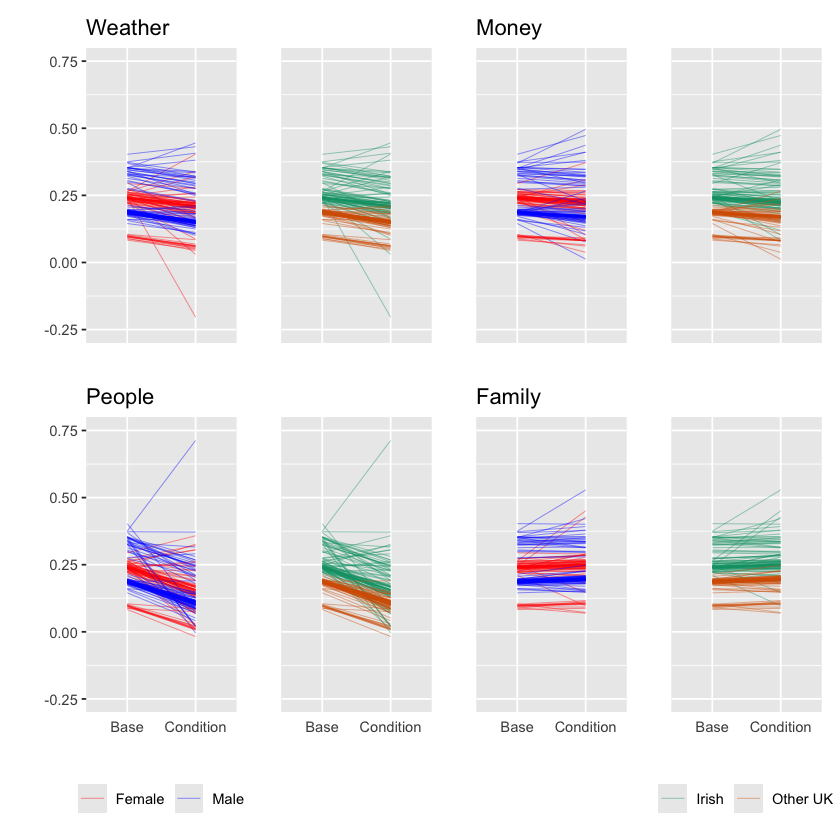

In [312]:
p <- f %>%filter(lateCentury == 0 & Canada == 0 & lowMonths == 0, 
                  Money == 0, Farming == 0, People == 0, Setting == 0,
                  Contemplation == 0, Family == 0, Travel == 0, Difficulty == 0, Government == 0,
                  mentsRate.s == 0, fppAllRate.s == 0)

p$Female <- as.character(p$Female)
p$Female[p$Female==0]<-"Male"
p$Female[p$Female==1]<-"Female"

p$Irish <- as.character(p$Irish)
p$Irish[p$Irish==0]<-"Other UK"
p$Irish[p$Irish==1]<-"Irish"

p1 <- p %>% ggplot( aes(x=factor(Weather), y=Estimate, group=factor(docauthorid), color=factor(Female))) +
geom_line(alpha = .6, size = .2)+
#scale_x_discrete(labels=c("0" = "Correspondence", "1" = "Weather"))+
xlab("")+ 
ylab("")+
scale_color_manual(values = c("red", "blue"))+
theme(legend.position = "none", legend.title = element_blank(), 
      axis.ticks.x = element_blank(), axis.text.x = element_blank())+
ylim(-.25, .75)+
ggtitle("Weather")#+
#gghighlight(Female == 1)

p2 <- p %>% ggplot( aes(x=factor(Weather), y=Estimate, group=factor(docauthorid), color=factor(Irish))) +
geom_line(alpha = .6, size = .2)+
#scale_x_discrete(labels=c("0" = "Correspondence", "1" = "Weather"))+
xlab("")+ 
ylab("")+
scale_color_manual(values = c("#009E73", "#D55E00"))+
theme(legend.position = "none", legend.title = element_blank(), 
      axis.ticks = element_blank(), axis.text.x = element_blank(), axis.text.y = element_blank())+
ylim(-.25, .75)+
ggtitle("")#+
#gghighlight(Female == 1)


p <- f %>%filter(lateCentury == 0 & Canada == 0 & lowMonths == 0, 
                  Weather == 0, Farming == 0, People == 0, Setting == 0,
                  Contemplation == 0, Family == 0, Travel == 0, Difficulty == 0, Government == 0,
                  mentsRate.s == 0, fppAllRate.s == 0)

p$Female <- as.character(p$Female)
p$Female[p$Female==0]<-"Male"
p$Female[p$Female==1]<-"Female"

p$Irish <- as.character(p$Irish)
p$Irish[p$Irish==0]<-"Other UK"
p$Irish[p$Irish==1]<-"Irish"

p3 <- p %>% ggplot( aes(x=factor(Money), y=Estimate, group=factor(docauthorid), color=factor(Female))) +
geom_line(alpha = .6, size = .2)+
#scale_x_discrete(labels=c("0" = "Correspondence", "1" = "Weather"))+
xlab("")+ 
ylab("")+
scale_color_manual(values = c("red", "blue"))+
theme(legend.position = "none", legend.title = element_blank(), 
      axis.ticks = element_blank(), axis.text.x = element_blank(), axis.text.y = element_blank())+
ylim(-.25, .75)+
ggtitle("Money")#+
#gghighlight(Female == 1)

p4 <- p %>% ggplot( aes(x=factor(Money), y=Estimate, group=factor(docauthorid), color=factor(Irish))) +
geom_line(alpha = .6, size = .2)+
#scale_x_discrete(labels=c("0" = "Correspondence", "1" = "Weather"))+
xlab("")+ 
ylab("")+
scale_color_manual(values = c("#009E73", "#D55E00"))+
theme(legend.position = "none", legend.title = element_blank(), 
      axis.ticks = element_blank(), axis.text.x = element_blank(), axis.text.y = element_blank())+
ylim(-.25, .75)+
ggtitle("")#+
#gghighlight(Female == 1)



p <- f %>%filter(lateCentury == 0 & Canada == 0 & lowMonths == 0, 
                  Weather == 0, Money == 0, Farming == 0, Setting == 0,
                  Contemplation == 0, Family == 0, Travel == 0, Difficulty == 0, Government == 0,
                  mentsRate.s == 0, fppAllRate.s == 0)

p$Female <- as.character(p$Female)
p$Female[p$Female==0]<-"Male"
p$Female[p$Female==1]<-"Female"

p$Irish <- as.character(p$Irish)
p$Irish[p$Irish==0]<-"Other UK"
p$Irish[p$Irish==1]<-"Irish"

p7 <- p %>% ggplot( aes(x=factor(People), y=Estimate, group=factor(docauthorid), color=factor(Female))) +
geom_line(alpha = .6, size = .2)+
scale_x_discrete(labels=c("0" = "Base", "1" = "Condition"))+
xlab("")+ 
ylab("")+
scale_color_manual(values = c("red", "blue"))+
theme(legend.position = "bottom", legend.title = element_blank(), axis.ticks.x = element_blank())+
ylim(-.25, .75)+
ggtitle("People")#+
#gghighlight(Female == 1)

p8 <- p %>% ggplot( aes(x=factor(People), y=Estimate, group=factor(docauthorid), color=factor(Irish))) +
geom_line(alpha = .6, size = .2)+
scale_x_discrete(labels=c("0" = "Base", "1" = "Condition"))+
xlab("")+ 
ylab("")+
scale_color_manual(values = c("#009E73", "#D55E00"))+
theme(legend.position = "none", legend.title = element_blank(), axis.ticks = element_blank(), axis.text.y = element_blank())+
ylim(-.25, .75)+
ggtitle("")#+
#gghighlight(Female == 1)



p <- f %>%filter(lateCentury == 0 & Canada == 0 & lowMonths == 0, 
                  Weather == 0, Money == 0, Farming == 0, People == 0,
                  Setting == 0, Contemplation == 0, Travel == 0, Difficulty == 0, Government == 0,
                  mentsRate.s == 0, fppAllRate.s == 0)

p$Female <- as.character(p$Female)
p$Female[p$Female==0]<-"Male"
p$Female[p$Female==1]<-"Female"

p$Irish <- as.character(p$Irish)
p$Irish[p$Irish==0]<-"Other UK"
p$Irish[p$Irish==1]<-"Irish"

p13 <- p %>% ggplot( aes(x=factor(Family), y=Estimate, group=factor(docauthorid), color=factor(Female))) +
geom_line(alpha = .6, size = .2)+
scale_x_discrete(labels=c("0" = "Base", "1" = "Condition"))+
xlab("")+ 
ylab("")+
scale_color_manual(values = c("red", "blue"))+
theme(legend.position = "none", legend.title = element_blank(), 
      axis.ticks = element_blank(), axis.text.y = element_blank())+
ylim(-.25, .75)+
ggtitle("Family")#+
#gghighlight(Female == 1)

p14 <- p %>% ggplot( aes(x=factor(Family), y=Estimate, group=factor(docauthorid), color=factor(Irish))) +
geom_line(alpha = .6, size = .2)+
scale_x_discrete(labels=c("0" = "Base", "1" = "Condition"))+
xlab("")+ 
ylab("")+
scale_color_manual(values = c("#009E73", "#D55E00"))+
theme(legend.position = "bottom", legend.title = element_blank(), 
      axis.ticks = element_blank(), axis.text.y = element_blank())+
ylim(-.25, .75)+
ggtitle("")#+
#gghighlight(Female == 1)




(p1 | p2 | p3 | p4) /
(p7 | p8 | p13 | p14)

#ggsave("20250414_PhD_RandomTopics.jpg")

In [313]:
counts <- df %>% 
group_by(docauthorid) %>% 
count() %>%
arrange(desc(n))

# High representation
idsHigh <- counts %>% 
filter (n >= 10) %>%
pull(docauthorid) 

# Average representation (better phrased as medium representation)
idsAve <- counts %>% 
filter (n >= 3 & n<=9) %>%
pull(docauthorid) 

# Low representation
idsLow <- counts %>% 
filter (n >= 1 & n<=2) %>%
pull(docauthorid)

prolifics <- c("per0038009", "per0004772", "IED0661")

## Checking Representation

Warning message:
“Tried to calculate with group_by(), but the calculation failed.
Falling back to ungrouped filter operation...”
Warning message:
“Tried to calculate with group_by(), but the calculation failed.
Falling back to ungrouped filter operation...”


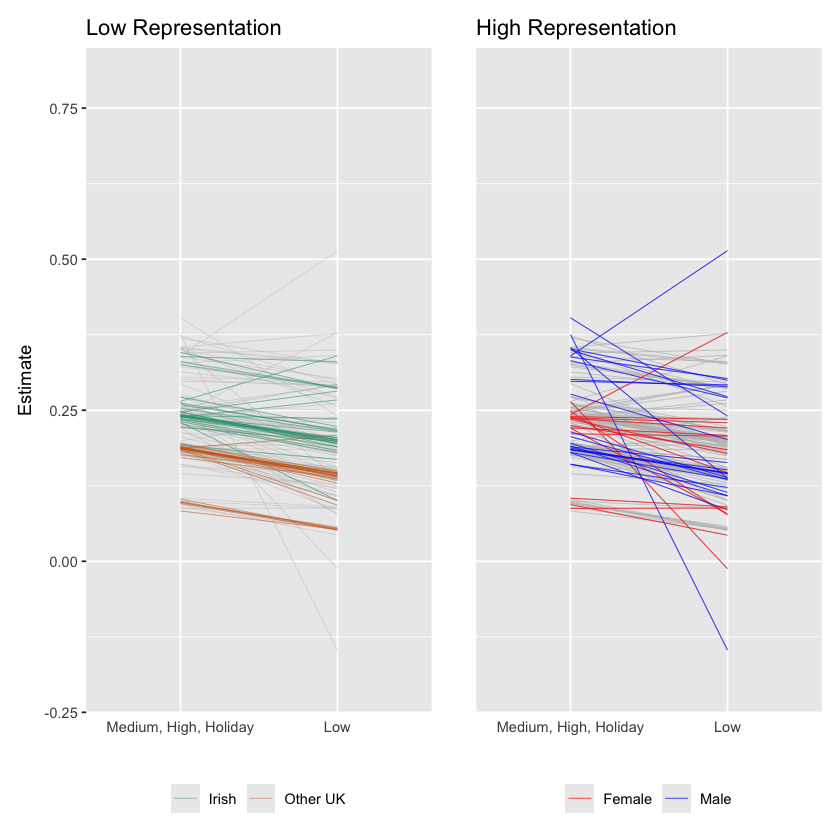

In [314]:
p <- f %>%filter(lateCentury == 0 & Canada == 0, 
                   Weather == 0, Money == 0, Farming == 0, People == 0, Setting == 0,
                  Contemplation == 0, Family == 0, Travel == 0, Difficulty == 0, Government == 0,
                  mentsRate.s == 0, fppAllRate.s == 0)

p$Gender[p$Female==0]<-"Male"
p$Gender[p$Female==1]<-"Female"
p$Origin[p$Irish==0]<-"Other UK"
p$Origin[p$Irish==1]<-"Irish"

p1 <- p %>% ggplot( aes(x=factor(lowMonths), y=Estimate, group=factor(docauthorid), color=factor(Origin))) +
    geom_line(alpha = .6, size = .2)+
  scale_x_discrete(labels=c("0" = "Medium, High, Holiday", "1" = "Low"))+
xlab("")+ 
scale_color_manual(values = c("#009E73", "#D55E00"))+
theme(legend.position = "bottom", legend.title = element_blank(), axis.ticks.x = element_blank())+
ylim(-.2, .8)+
ggtitle("Low Representation")+
gghighlight(docauthorid %in% idsLow)

p2 <- p %>% ggplot( aes(x=factor(lowMonths), y=Estimate, group=factor(docauthorid), color=factor(Gender))) +
    geom_line(alpha = 1, size = .2)+
  scale_x_discrete(labels=c("0" = "Medium, High, Holiday", "1" = "Low"))+
xlab("")+ 
scale_color_manual(values = c("red", "blue"))+
theme(legend.position = "bottom", legend.title = element_blank(), axis.ticks = element_blank(), axis.text.y = element_blank())+
ylim(-.2, .8)+
ggtitle("High Representation")+
ylab("")+
gghighlight(docauthorid %in% idsHigh)

p1 & p2

#ggsave("20250407_PhD_MonSenRep.jpg")

In [315]:
# Random Estimates

nd1 <- df %>% select(docauthorid, authorName, authorGender, irish) %>% distinct() %>% arrange(docauthorid)
nd1 <- nd1 %>% slice(rep(1:n(), each = 11))

nd2 <- data.frame(Weather=rep(c(0,1,0,0,0,0,0,0,0,0,0), 174),
                Money=rep(c(0,0,1,0,0,0,0,0,0,0,0), 174),
                Farming=rep(c(0,0,0,1,0,0,0,0,0,0,0), 174),
                People=rep(c(0,0,0,0,1,0,0,0,0,0,0), 174),
                Setting=rep(c(0,0,0,0,0,1,0,0,0,0,0), 174),
                Contemplation=rep(c(0,0,0,0,0,0,1,0,0,0,0), 174),
                Family=rep(c(0,0,0,0,0,0,0,1,0,0,0), 174),
                Travel=rep(c(0,0,0,0,0,0,0,0,1,0,0), 174),
                Difficulty=rep(c(0,0,0,0,0,0,0,0,0,1,0), 174),
                Government=rep(c(0,0,0,0,0,0,0,0,0,0,1), 174),
                Topic=rep(c("Correspondence","Weather","Money", 
                            "Farming", "People", "Setting", 
                            "Contemplation", "Family", 
                            "Travel", "Difficulty", "Government"), 174))

nd <- cbind(nd1, nd2)
#glimpse(nd)
#nd%>%
#group_by(docauthorid)%>%
#summarise(across(everything(), sum))
#nd %>% distinct() %>% nrow()

In [316]:
set.seed(5)

f <- fitted(f5ppSFIxLClMsSocSelTopIS,
         newdata = autTex,
         probs = c(.05, .95)) %>% 
         data.frame() %>% 
         bind_cols(autTex)

In [317]:
p <- f%>%filter(Canada==0, lowMonths==0, lateCentury==0, mentsRate.s==0, fppAllRate.s==0)
p$Topic<-"Correspondence"
p$Topic[p$Weather==1]<-"Weather"
p$Topic[p$Money==1]<-"Money"
p$Topic[p$Farming==1]<-"Farming"
p$Topic[p$People==1]<-"People"
p$Topic[p$Setting==1]<-"Setting"
p$Topic[p$Contemplation==1]<-"Contemplation"
p$Topic[p$Family==1]<-"Family"
p$Topic[p$Travel==1]<-"Travel"
p$Topic[p$Difficulty==1]<-"Difficulty"
p$Topic[p$Government==1]<-"Government"
#table(p$Topic)

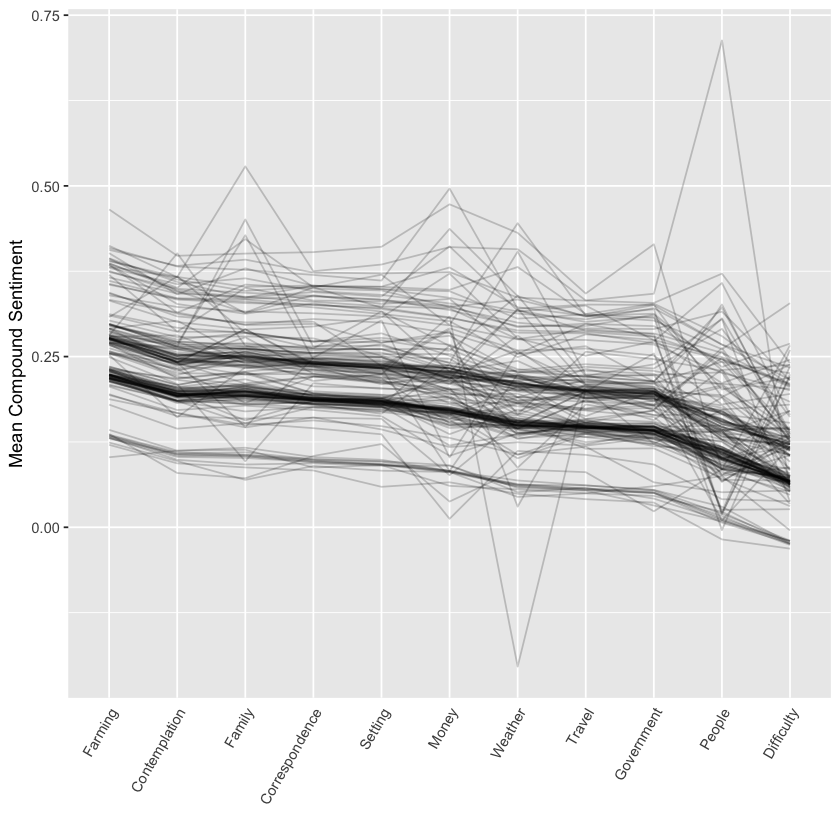

In [318]:
orderTopic <- c("Farming",
                "Contemplation", 
                "Family",  
                "Correspondence",# Base Case
                "Setting", 
                "Money",
                "Weather",
                "Travel",
                "Government",
                "People",
                "Difficulty"
                )

p1  <- p %>%
  ggplot(aes(x = factor(Topic, orderTopic), y = Estimate, group = factor(docauthorid))) + #, color = authorGender
#  geom_ribbon(aes(ymin = Q5, ymax = Q95, group = factor(authorLabel, orderAuthor), color = factor(authorLabel, orderAuthor), alpha=.1)) +
#  guides(alpha=FALSE)+
  geom_line(linetype="solid", alpha = .2) +
#geom_point(aes(colour = factor(irish)), size=1, alpha = .2) +
  #ggtitle("Mean valence by author and SWB theme") +
  theme(plot.title = element_text(size = 14, hjust = .5))+
theme(axis.text.x = element_text(angle = 60, vjust = 1, hjust=1))+
 xlab("")+ 
ylab("Mean Compound Sentiment")+
  theme(axis.ticks.x = element_blank())
#labs(color = "Writer")#+
#geom_hline(yintercept = c(-0.24, .37, -.26, .05), colour = c('#F8766D','#7CAE00','#00BFC4','#C77CFF'), linetype = "dotted")+
p1


Warning message:
“Tried to calculate with group_by(), but the calculation failed.
Falling back to ungrouped filter operation...”
Warning message:
“Tried to calculate with group_by(), but the calculation failed.
Falling back to ungrouped filter operation...”


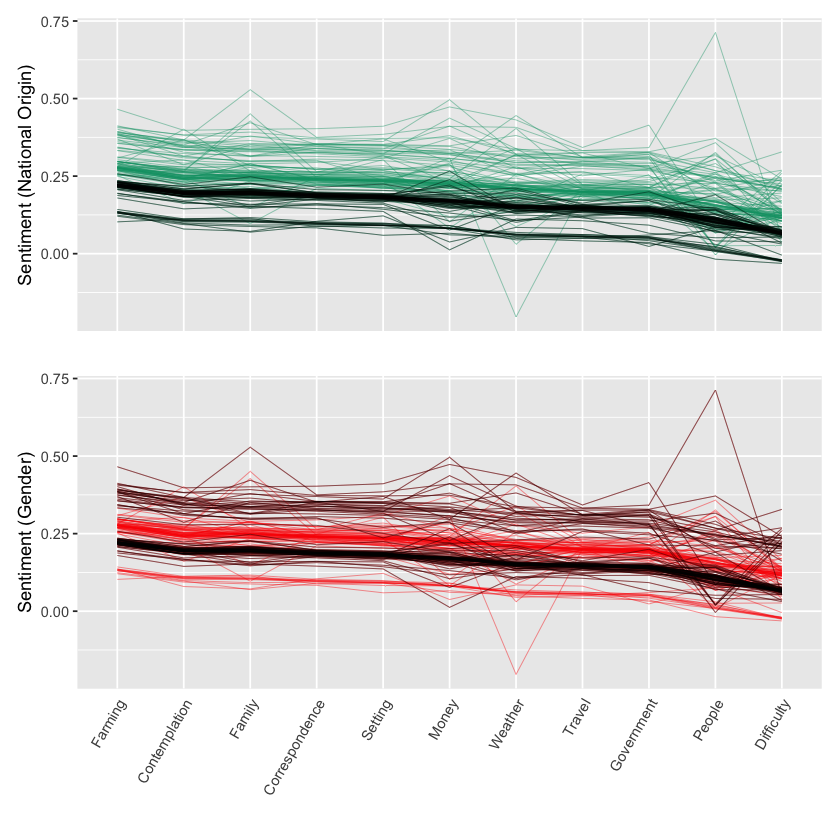

In [319]:
orderTopic <- c("Farming",
                "Contemplation", 
                "Family",  
                "Correspondence",# Base Case
                "Setting", 
                "Money",
                "Weather",
                "Travel",
                "Government",
                "People",
                "Difficulty"
                )

p1  <- p %>%
  ggplot(aes(x = factor(Topic, orderTopic), y = Estimate, group = factor(docauthorid))) + #, color = authorGender
#  geom_ribbon(aes(ymin = Q5, ymax = Q95, group = factor(authorLabel, orderAuthor), color = factor(authorLabel, orderAuthor), alpha=.1)) +
#  guides(alpha=FALSE)+
  geom_line(color = "Black", linewidth = .2, alpha = .6) + # Other UK
#geom_point(aes(colour = factor(irish)), size=1, alpha = .2) +
  #ggtitle("Mean valence by author and SWB theme") +
  theme(plot.title = element_text(size = 14, hjust = .5), axis.text.x = element_blank())+
#theme(axis.text.x = element_text(angle = 60, vjust = 1, hjust=1))+
 xlab("")+ 
ylab("Sentiment (National Origin)")+
  theme(axis.ticks.x = element_blank())+
#labs(color = "Writer")#+
#geom_hline(yintercept = c(-0.24, .37, -.26, .05), colour = c('#F8766D','#7CAE00','#00BFC4','#C77CFF'), linetype = "dotted")+
#gghighlight(docauthorid %in% ids, use_direct_label = FALSE, 
#              unhighlighted_params = list(linewidth = .6, colour = alpha("#E69F00"), alpha = .6)) # Irish
gghighlight(Irish==0, use_direct_label = FALSE, 
              unhighlighted_params = list(linewidth = .2, colour = alpha("#009E73"), alpha = .6)) # Irish

orderTopic <- c("Farming",
                "Contemplation", 
                "Family",  
                "Correspondence",# Base Case
                "Setting", 
                "Money",
                "Weather",
                "Travel",
                "Government",
                "People",
                "Difficulty"
                )

p2  <- p %>%
  ggplot(aes(x = factor(Topic, orderTopic), y = Estimate, group = factor(docauthorid))) + #, color = authorGender
#  geom_ribbon(aes(ymin = Q5, ymax = Q95, group = factor(authorLabel, orderAuthor), color = factor(authorLabel, orderAuthor), alpha=.1)) +
#  guides(alpha=FALSE)+
  geom_line(color = "Black", linewidth = .2, alpha = .6) + # Male
#geom_point(aes(colour = factor(irish)), size=1, alpha = .2) +
  #ggtitle("Mean valence by author and SWB theme") +
  theme(plot.title = element_text(size = 14, hjust = .5))+
theme(axis.text.x = element_text(angle = 60, vjust = 1, hjust=1))+
 xlab("")+ 
ylab("Sentiment (Gender)")+
  theme(axis.ticks.x = element_blank())+
#labs(color = "Writer")#+
#geom_hline(yintercept = c(-0.24, .37, -.26, .05), colour = c('#F8766D','#7CAE00','#00BFC4','#C77CFF'), linetype = "dotted")+
#gghighlight(docauthorid %in% ids, use_direct_label = FALSE, 
#              unhighlighted_params = list(linewidth = .6, colour = alpha("#E69F00"), alpha = .6)) # Irish
gghighlight(Female==0, use_direct_label = FALSE, 
              unhighlighted_params = list(linewidth = .2, colour = alpha("#fa0000"), alpha = .6)) # Female

p1 / p2

#ggsave("20240423_PhD_SenTopGenOri.jpg")

In [282]:
p[p$Estimate>=.5,]
unique(df$authorName[df$docauthorid == "IED0374"])

p[p$Estimate<=-.1,]
unique(df$authorName[df$docauthorid == "IED0212"])

,Estimate,Est.Error,Q5,Q95,docauthorid,Female,Irish,Weather,Money,Farming,⋯,Family,Travel,Difficulty,Government,lateCentury,Canada,lowMonths,mentsRate.s,fppAllRate.s,Topic
,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<int>,<int>,<fct>,<fct>,<fct>,⋯,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<int>,<int>,<chr>
390,0.7119659,0.09368998,0.5630545,0.8694610,IED0374,0,1,0,0,0,⋯,0,0,0,0,0,0,0,0,0,People
393,0.5344009,0.17374464,0.2752258,0.8483475,IED0374,0,1,0,0,0,⋯,1,0,0,0,0,0,0,0,0,Family


[1] "Jonathan W. Smith"

,Estimate,Est.Error,Q5,Q95,docauthorid,Female,Irish,Weather,Money,Farming,⋯,Family,Travel,Difficulty,Government,lateCentury,Canada,lowMonths,mentsRate.s,fppAllRate.s,Topic
,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<int>,<int>,<fct>,<fct>,<fct>,⋯,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<int>,<int>,<chr>
266,-0.1985958,0.1630664,-0.4649961,0.06284782,IED0212,1,1,1,0,0,⋯,0,0,0,0,0,0,0,0,0,Weather


[1] "Ellen S. Dunlop"

In the graph above, unhighlighted (green/red) == Irish/Female and highlighted (black) == Other UK/Male. This shows the prevailing trend with some disorder around certain topics, especially Family, Money, Weather and People. Now examing numerical effects combining fixed and randoms. There are too many to include in a table so I am summerizing them by topic below. 

In [320]:
coef<-coef(f5ppSFIxLClMsSocSelTopIS, probs = c(.05, .95))

coef90 <- coef$docauthorid[,,"Intercept"]

idsPos <- coef90 %>% 
data.frame %>%
filter(Q5 >= 0 & Q95 >= 0) %>%
rownames_to_column("docauthorid") %>% 
pull(docauthorid)

idsNeg <- coef90 %>% 
data.frame %>%
filter(Q5 <= 0 & Q95 <= 0) %>%
rownames_to_column("docauthorid") %>% 
pull(docauthorid)

ids <- c(idsPos,idsNeg)

cols2add <- df %>% 
filter(docauthorid %in% ids) %>% 
select(docauthorid, authorName, authorGender, nationalOrigin) %>%
distinct() %>% 
arrange(docauthorid)

randomsPos <- coef90 %>% 
data.frame %>%
filter(Q5 >= 0 & Q95 >= 0) %>%
rownames_to_column("docauthorid")

randomsNeg <- coef90 %>% 
data.frame %>%
filter(Q5 <= 0 & Q95 <= 0) %>%
rownames_to_column("docauthorid")

randoms <- rbind(randomsPos, randomsNeg)

Intercept <- cbind(randoms, cols2add)[,c(-1)] %>% select(6,5, 1:4, 7:8) %>% 
arrange(desc(Estimate)) %>% mutate_if(is.numeric, round, digits = 2) %>% mutate(Topic = "Correspondence (Reference Case)")

coef90 <- coef$docauthorid[,,"Weather1"]

idsPos <- coef90 %>% 
data.frame %>%
filter(Q5 >= 0 & Q95 >= 0) %>%
rownames_to_column("docauthorid") %>% 
pull(docauthorid)

idsNeg <- coef90 %>% 
data.frame %>%
filter(Q5 <= 0 & Q95 <= 0) %>%
rownames_to_column("docauthorid") %>% 
pull(docauthorid)

ids <- c(idsPos,idsNeg)

cols2add <- df %>% 
filter(docauthorid %in% ids) %>% 
select(docauthorid, authorName, authorGender, nationalOrigin) %>%
distinct() %>% 
arrange(docauthorid)

randomsPos <- coef90 %>% 
data.frame %>%
filter(Q5 >= 0 & Q95 >= 0) %>%
rownames_to_column("docauthorid")

randomsNeg <- coef90 %>% 
data.frame %>%
filter(Q5 <= 0 & Q95 <= 0) %>%
rownames_to_column("docauthorid")

randoms <- rbind(randomsPos, randomsNeg)

Weather <- cbind(randoms, cols2add)[,c(-1)] %>% select(6,5, 1:4, 7:8) %>% 
arrange(desc(Estimate)) %>% mutate_if(is.numeric, round, digits = 2) %>% mutate(Topic = "Weather")

coef90 <- coef$docauthorid[,,"Money1"]

idsPos <- coef90 %>% 
data.frame %>%
filter(Q5 >= 0 & Q95 >= 0) %>%
rownames_to_column("docauthorid") %>% 
pull(docauthorid)

idsNeg <- coef90 %>% 
data.frame %>%
filter(Q5 <= 0 & Q95 <= 0) %>%
rownames_to_column("docauthorid") %>% 
pull(docauthorid)

ids <- c(idsPos,idsNeg)

cols2add <- df %>% 
filter(docauthorid %in% ids) %>% 
select(docauthorid, authorName, authorGender, nationalOrigin) %>%
distinct() %>% 
arrange(docauthorid)

randomsPos <- coef90 %>% 
data.frame %>%
filter(Q5 >= 0 & Q95 >= 0) %>%
rownames_to_column("docauthorid")

randomsNeg <- coef90 %>% 
data.frame %>%
filter(Q5 <= 0 & Q95 <= 0) %>%
rownames_to_column("docauthorid")

randoms <- rbind(randomsPos, randomsNeg)

Money <- cbind(randoms, cols2add)[,c(-1)] %>% select(6,5, 1:4, 7:8) %>% 
arrange(desc(Estimate)) %>% mutate_if(is.numeric, round, digits = 2) %>% mutate(Topic = "Money")

coef90 <- coef$docauthorid[,,"Farming1"]

idsPos <- coef90 %>% 
data.frame %>%
filter(Q5 >= 0 & Q95 >= 0) %>%
rownames_to_column("docauthorid") %>% 
pull(docauthorid)

idsNeg <- coef90 %>% 
data.frame %>%
filter(Q5 <= 0 & Q95 <= 0) %>%
rownames_to_column("docauthorid") %>% 
pull(docauthorid)

ids <- c(idsPos,idsNeg)

cols2add <- df %>% 
filter(docauthorid %in% ids) %>% 
select(docauthorid, authorName, authorGender, nationalOrigin) %>%
distinct() %>% 
arrange(docauthorid)

randomsPos <- coef90 %>% 
data.frame %>%
filter(Q5 >= 0 & Q95 >= 0) %>%
rownames_to_column("docauthorid")

randomsNeg <- coef90 %>% 
data.frame %>%
filter(Q5 <= 0 & Q95 <= 0) %>%
rownames_to_column("docauthorid")

randoms <- rbind(randomsPos, randomsNeg)

Farming <- cbind(randoms, cols2add)[,c(-1)] %>% select(6,5, 1:4, 7:8) %>% 
arrange(desc(Estimate)) %>% mutate_if(is.numeric, round, digits = 2) %>% mutate(Topic = "Farming1")

coef90 <- coef$docauthorid[,,"People1"]

idsPos <- coef90 %>% 
data.frame %>%
filter(Q5 >= 0 & Q95 >= 0) %>%
rownames_to_column("docauthorid") %>% 
pull(docauthorid)

idsNeg <- coef90 %>% 
data.frame %>%
filter(Q5 <= 0 & Q95 <= 0) %>%
rownames_to_column("docauthorid") %>% 
pull(docauthorid)

ids <- c(idsPos,idsNeg)

cols2add <- df %>% 
filter(docauthorid %in% ids) %>% 
select(docauthorid, authorName, authorGender, nationalOrigin) %>%
distinct() %>% 
arrange(docauthorid)

randomsPos <- coef90 %>% 
data.frame %>%
filter(Q5 >= 0 & Q95 >= 0) %>%
rownames_to_column("docauthorid")

randomsNeg <- coef90 %>% 
data.frame %>%
filter(Q5 <= 0 & Q95 <= 0) %>%
rownames_to_column("docauthorid")

randoms <- rbind(randomsPos, randomsNeg)

People <- cbind(randoms, cols2add)[,c(-1)] %>% select(6,5, 1:4, 7:8) %>% 
arrange(desc(Estimate)) %>% mutate_if(is.numeric, round, digits = 2) %>% mutate(Topic = "People")

coef90 <- coef$docauthorid[,,"Setting1"]

idsPos <- coef90 %>% 
data.frame %>%
filter(Q5 >= 0 & Q95 >= 0) %>%
rownames_to_column("docauthorid") %>% 
pull(docauthorid)

idsNeg <- coef90 %>% 
data.frame %>%
filter(Q5 <= 0 & Q95 <= 0) %>%
rownames_to_column("docauthorid") %>% 
pull(docauthorid)

ids <- c(idsPos,idsNeg)

cols2add <- df %>% 
filter(docauthorid %in% ids) %>% 
select(docauthorid, authorName, authorGender, nationalOrigin) %>%
distinct() %>% 
arrange(docauthorid)

randomsPos <- coef90 %>% 
data.frame %>%
filter(Q5 >= 0 & Q95 >= 0) %>%
rownames_to_column("docauthorid")

randomsNeg <- coef90 %>% 
data.frame %>%
filter(Q5 <= 0 & Q95 <= 0) %>%
rownames_to_column("docauthorid")

randoms <- rbind(randomsPos, randomsNeg)

Setting <- cbind(randoms, cols2add)[,c(-1)] %>% select(6,5, 1:4, 7:8) %>% 
arrange(desc(Estimate)) %>% mutate_if(is.numeric, round, digits = 2) %>% mutate(Topic = "Setting")

coef90 <- coef$docauthorid[,,"Contemplation1"]

idsPos <- coef90 %>% 
data.frame %>%
filter(Q5 >= 0 & Q95 >= 0) %>%
rownames_to_column("docauthorid") %>% 
pull(docauthorid)

idsNeg <- coef90 %>% 
data.frame %>%
filter(Q5 <= 0 & Q95 <= 0) %>%
rownames_to_column("docauthorid") %>% 
pull(docauthorid)

ids <- c(idsPos,idsNeg)

cols2add <- df %>% 
filter(docauthorid %in% ids) %>% 
select(docauthorid, authorName, authorGender, nationalOrigin) %>%
distinct() %>% 
arrange(docauthorid)

randomsPos <- coef90 %>% 
data.frame %>%
filter(Q5 >= 0 & Q95 >= 0) %>%
rownames_to_column("docauthorid")

randomsNeg <- coef90 %>% 
data.frame %>%
filter(Q5 <= 0 & Q95 <= 0) %>%
rownames_to_column("docauthorid")

randoms <- rbind(randomsPos, randomsNeg)

Contemplation <- cbind(randoms, cols2add)[,c(-1)] %>% select(6,5, 1:4, 7:8) %>% 
arrange(desc(Estimate)) %>% mutate_if(is.numeric, round, digits = 2) %>% mutate(Topic = "Contemplation")

coef90 <- coef$docauthorid[,,"Family1"]

idsPos <- coef90 %>% 
data.frame %>%
filter(Q5 >= 0 & Q95 >= 0) %>%
rownames_to_column("docauthorid") %>% 
pull(docauthorid)

idsNeg <- coef90 %>% 
data.frame %>%
filter(Q5 <= 0 & Q95 <= 0) %>%
rownames_to_column("docauthorid") %>% 
pull(docauthorid)

ids <- c(idsPos,idsNeg)

cols2add <- df %>% 
filter(docauthorid %in% ids) %>% 
select(docauthorid, authorName, authorGender, nationalOrigin) %>%
distinct() %>% 
arrange(docauthorid)

randomsPos <- coef90 %>% 
data.frame %>%
filter(Q5 >= 0 & Q95 >= 0) %>%
rownames_to_column("docauthorid")

randomsNeg <- coef90 %>% 
data.frame %>%
filter(Q5 <= 0 & Q95 <= 0) %>%
rownames_to_column("docauthorid")

randoms <- rbind(randomsPos, randomsNeg)

Family <- cbind(randoms, cols2add)[,c(-1)] %>% select(6,5, 1:4, 7:8) %>% 
arrange(desc(Estimate)) %>% mutate_if(is.numeric, round, digits = 2) %>% mutate(Topic = "Family")

coef90 <- coef$docauthorid[,,"Travel1"]

idsPos <- coef90 %>% 
data.frame %>%
filter(Q5 >= 0 & Q95 >= 0) %>%
rownames_to_column("docauthorid") %>% 
pull(docauthorid)

idsNeg <- coef90 %>% 
data.frame %>%
filter(Q5 <= 0 & Q95 <= 0) %>%
rownames_to_column("docauthorid") %>% 
pull(docauthorid)

ids <- c(idsPos,idsNeg)

cols2add <- df %>% 
filter(docauthorid %in% ids) %>% 
select(docauthorid, authorName, authorGender, nationalOrigin) %>%
distinct() %>% 
arrange(docauthorid)

randomsPos <- coef90 %>% 
data.frame %>%
filter(Q5 >= 0 & Q95 >= 0) %>%
rownames_to_column("docauthorid")

randomsNeg <- coef90 %>% 
data.frame %>%
filter(Q5 <= 0 & Q95 <= 0) %>%
rownames_to_column("docauthorid")

randoms <- rbind(randomsPos, randomsNeg)

Travel <- cbind(randoms, cols2add)[,c(-1)] %>% select(6,5, 1:4, 7:8) %>% 
arrange(desc(Estimate)) %>% mutate_if(is.numeric, round, digits = 2) %>% mutate(Topic = "Travel")

coef90 <- coef$docauthorid[,,"Difficulty1"]

idsPos <- coef90 %>% 
data.frame %>%
filter(Q5 >= 0 & Q95 >= 0) %>%
rownames_to_column("docauthorid") %>% 
pull(docauthorid)

idsNeg <- coef90 %>% 
data.frame %>%
filter(Q5 <= 0 & Q95 <= 0) %>%
rownames_to_column("docauthorid") %>% 
pull(docauthorid)

ids <- c(idsPos,idsNeg)

cols2add <- df %>% 
filter(docauthorid %in% ids) %>% 
select(docauthorid, authorName, authorGender, nationalOrigin) %>%
distinct() %>% 
arrange(docauthorid)

randomsPos <- coef90 %>% 
data.frame %>%
filter(Q5 >= 0 & Q95 >= 0) %>%
rownames_to_column("docauthorid")

randomsNeg <- coef90 %>% 
data.frame %>%
filter(Q5 <= 0 & Q95 <= 0) %>%
rownames_to_column("docauthorid")

randoms <- rbind(randomsPos, randomsNeg)

Difficulty <- cbind(randoms, cols2add)[,c(-1)] %>% select(6,5, 1:4, 7:8) %>% 
arrange(desc(Estimate)) %>% mutate_if(is.numeric, round, digits = 2) %>% mutate(Topic = "Difficulty")

coef90 <- coef$docauthorid[,,"Government1"]

idsPos <- coef90 %>% 
data.frame %>%
filter(Q5 >= 0 & Q95 >= 0) %>%
rownames_to_column("docauthorid") %>% 
pull(docauthorid)

idsNeg <- coef90 %>% 
data.frame %>%
filter(Q5 <= 0 & Q95 <= 0) %>%
rownames_to_column("docauthorid") %>% 
pull(docauthorid)

ids <- c(idsPos,idsNeg)

cols2add <- df %>% 
filter(docauthorid %in% ids) %>% 
select(docauthorid, authorName, authorGender, nationalOrigin) %>%
distinct() %>% 
arrange(docauthorid)

randomsPos <- coef90 %>% 
data.frame %>%
filter(Q5 >= 0 & Q95 >= 0) %>%
rownames_to_column("docauthorid")

randomsNeg <- coef90 %>% 
data.frame %>%
filter(Q5 <= 0 & Q95 <= 0) %>%
rownames_to_column("docauthorid")

randoms <- rbind(randomsPos, randomsNeg)

Government <- cbind(randoms, cols2add)[,c(-1)] %>% select(6,5, 1:4, 7:8) %>% 
arrange(desc(Estimate)) %>% mutate_if(is.numeric, round, digits = 2) %>% mutate(Topic = "Government")


randomsTopic90 <- rbind(Intercept, Weather, Money, Farming, People, Setting, Contemplation, Family, Travel, Difficulty, Government)

randomsTopic90Sum <- randomsTopic90 %>% 
group_by(Topic) %>% 
count() %>%
arrange(desc(n)) %>%
mutate(percent90 = n / 174 * 100) %>%
mutate_if(is.numeric, round, digits = 0) %>% 
rename(authors90 = n)%>% 
data.frame()


`mutate_if()` ignored the following grouping variables:
• Column `Topic`


In [321]:
randomsTopic90Sum
randomsTopic90 %>% 
filter(Topic!= "Correspondence (Reference Case)") %>%
arrange(Est.Error)

Topic,authors90,percent90
<chr>,<dbl>,<dbl>
Correspondence (Reference Case),173,99
People,9,5
Difficulty,6,3
Family,1,1
Government,1,1
Weather,1,1


authorName,docauthorid,Estimate,Est.Error,Q5,Q95,authorGender,nationalOrigin,Topic
<fct>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<fct>,<chr>
Susannah Strickland Moodie,per0004772,-0.08,0.05,-0.18,0.00,F,English,Government
Ellen S. Dunlop,IED0212,-0.16,0.08,-0.30,-0.04,F,Irish,Difficulty
Jonathan W. Smith,IED0374,-0.17,0.09,-0.33,-0.02,M,Irish,People
Hester Habersham,IED0294,0.34,0.10,0.18,0.50,F,Irish,People
Mary Savage,IED0621,-0.21,0.10,-0.39,-0.05,F,Irish,People
James Gamble,IED0403,-0.32,0.10,-0.49,-0.16,M,Irish,People
Nathaniel Carrothers,per0026978a,-0.32,0.10,-0.48,-0.16,M,Irish,People
May Ann Blair,IED0657,-0.23,0.11,-0.40,-0.06,F,Irish,People
William J. Weir,IED0958,-0.33,0.11,-0.51,-0.16,M,Irish,People


In [322]:
coef90 <- coef$docauthorid[,,"Intercept"]

coef90 %>% 
data.frame %>%
filter(Q5 < 0 & Q95 > 0)

idsNone <- coef90 %>% 
data.frame %>%
filter(Q5 < 0 & Q95 > 0) %>%
rownames_to_column("docauthorid") %>% 
pull(docauthorid)

df %>% 
filter(docauthorid %in% idsNone) %>%
select(docauthorid, authorName, nationalOrigin, authorGender,U,M,S,F,L) %>%
unique()

,Estimate,Est.Error,Q5,Q95
,<dbl>,<dbl>,<dbl>,<dbl>
IED0130,0.135712,0.07726676,-0.003441679,0.2454725


,docauthorid,authorName,nationalOrigin,authorGender,U,M,S,F,L
,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>
1,IED0130,Catherine Fitzgerald,Irish,F,NA,NA,NA,NA,NA


With a 90% credible interval, 99% of the authors (n == 173) are expected to have a base level of sentiment (i.e., when the topic of their writing is simply "correspondence). Only 5 of the remaining 10 topics had any random effects at the 90% level. Let's try this at the 70 percent credible interval.

In [324]:
coef<-coef(f5ppSFIxLClMsSocSelTopIS, probs = c(.15, .85))

coef70 <- coef$docauthorid[,,"Intercept"]

idsPos <- coef70 %>% 
data.frame %>%
filter(Q15 >= 0 & Q85 >= 0) %>%
rownames_to_column("docauthorid") %>% 
pull(docauthorid)

idsNeg <- coef70 %>% 
data.frame %>%
filter(Q15 <= 0 & Q85 <= 0) %>%
rownames_to_column("docauthorid") %>% 
pull(docauthorid)

ids <- c(idsPos,idsNeg)

cols2add <- df %>% 
filter(docauthorid %in% ids) %>% 
select(docauthorid, authorName, authorGender, nationalOrigin) %>%
distinct() %>% 
arrange(docauthorid)

randomsPos <- coef70 %>% 
data.frame %>%
filter(Q15 >= 0 & Q85 >= 0) %>%
rownames_to_column("docauthorid")

randomsNeg <- coef70 %>% 
data.frame %>%
filter(Q15 <= 0 & Q85 <= 0) %>%
rownames_to_column("docauthorid")

randoms <- rbind(randomsPos, randomsNeg)

Intercept <- cbind(randoms, cols2add)[,c(-1)] %>% select(6,5, 1:4, 7:8) %>% 
arrange(desc(Estimate)) %>% mutate_if(is.numeric, round, digits = 2) %>% mutate(Topic = "Correspondence (Reference Case)")

coef70 <- coef$docauthorid[,,"Weather1"]

idsPos <- coef70 %>% 
data.frame %>%
filter(Q15 >= 0 & Q85 >= 0) %>%
rownames_to_column("docauthorid") %>% 
pull(docauthorid)

idsNeg <- coef70 %>% 
data.frame %>%
filter(Q15 <= 0 & Q85 <= 0) %>%
rownames_to_column("docauthorid") %>% 
pull(docauthorid)

ids <- c(idsPos,idsNeg)

cols2add <- df %>% 
filter(docauthorid %in% ids) %>% 
select(docauthorid, authorName, authorGender, nationalOrigin) %>%
distinct() %>% 
arrange(docauthorid)

randomsPos <- coef70 %>% 
data.frame %>%
filter(Q15 >= 0 & Q85 >= 0) %>%
rownames_to_column("docauthorid")

randomsNeg <- coef70 %>% 
data.frame %>%
filter(Q15 <= 0 & Q85 <= 0) %>%
rownames_to_column("docauthorid")

randoms <- rbind(randomsPos, randomsNeg)

Weather <- cbind(randoms, cols2add)[,c(-1)] %>% select(6,5, 1:4, 7:8) %>% 
arrange(desc(Estimate)) %>% mutate_if(is.numeric, round, digits = 2) %>% mutate(Topic = "Weather")

coef70 <- coef$docauthorid[,,"Money1"]

idsPos <- coef70 %>% 
data.frame %>%
filter(Q15 >= 0 & Q85 >= 0) %>%
rownames_to_column("docauthorid") %>% 
pull(docauthorid)

idsNeg <- coef70 %>% 
data.frame %>%
filter(Q15 <= 0 & Q85 <= 0) %>%
rownames_to_column("docauthorid") %>% 
pull(docauthorid)

ids <- c(idsPos,idsNeg)

cols2add <- df %>% 
filter(docauthorid %in% ids) %>% 
select(docauthorid, authorName, authorGender, nationalOrigin) %>%
distinct() %>% 
arrange(docauthorid)

randomsPos <- coef70 %>% 
data.frame %>%
filter(Q15 >= 0 & Q85 >= 0) %>%
rownames_to_column("docauthorid")

randomsNeg <- coef70 %>% 
data.frame %>%
filter(Q15 <= 0 & Q85 <= 0) %>%
rownames_to_column("docauthorid")

randoms <- rbind(randomsPos, randomsNeg)

Money <- cbind(randoms, cols2add)[,c(-1)] %>% select(6,5, 1:4, 7:8) %>% 
arrange(desc(Estimate)) %>% mutate_if(is.numeric, round, digits = 2) %>% mutate(Topic = "Money")

coef70 <- coef$docauthorid[,,"Farming1"]

idsPos <- coef70 %>% 
data.frame %>%
filter(Q15 >= 0 & Q85 >= 0) %>%
rownames_to_column("docauthorid") %>% 
pull(docauthorid)

idsNeg <- coef70 %>% 
data.frame %>%
filter(Q15 <= 0 & Q85 <= 0) %>%
rownames_to_column("docauthorid") %>% 
pull(docauthorid)

ids <- c(idsPos,idsNeg)

cols2add <- df %>% 
filter(docauthorid %in% ids) %>% 
select(docauthorid, authorName, authorGender, nationalOrigin) %>%
distinct() %>% 
arrange(docauthorid)

randomsPos <- coef70 %>% 
data.frame %>%
filter(Q15 >= 0 & Q85 >= 0) %>%
rownames_to_column("docauthorid")

randomsNeg <- coef70 %>% 
data.frame %>%
filter(Q15 <= 0 & Q85 <= 0) %>%
rownames_to_column("docauthorid")

randoms <- rbind(randomsPos, randomsNeg)

Farming <- cbind(randoms, cols2add)[,c(-1)] %>% select(6,5, 1:4, 7:8) %>% 
arrange(desc(Estimate)) %>% mutate_if(is.numeric, round, digits = 2) %>% mutate(Topic = "Farming")

coef70 <- coef$docauthorid[,,"People1"]

idsPos <- coef70 %>% 
data.frame %>%
filter(Q15 >= 0 & Q85 >= 0) %>%
rownames_to_column("docauthorid") %>% 
pull(docauthorid)

idsNeg <- coef70 %>% 
data.frame %>%
filter(Q15 <= 0 & Q85 <= 0) %>%
rownames_to_column("docauthorid") %>% 
pull(docauthorid)

ids <- c(idsPos,idsNeg)

cols2add <- df %>% 
filter(docauthorid %in% ids) %>% 
select(docauthorid, authorName, authorGender, nationalOrigin) %>%
distinct() %>% 
arrange(docauthorid)

randomsPos <- coef70 %>% 
data.frame %>%
filter(Q15 >= 0 & Q85 >= 0) %>%
rownames_to_column("docauthorid")

randomsNeg <- coef70 %>% 
data.frame %>%
filter(Q15 <= 0 & Q85 <= 0) %>%
rownames_to_column("docauthorid")

randoms <- rbind(randomsPos, randomsNeg)

People <- cbind(randoms, cols2add)[,c(-1)] %>% select(6,5, 1:4, 7:8) %>% 
arrange(desc(Estimate)) %>% mutate_if(is.numeric, round, digits = 2) %>% mutate(Topic = "People")

coef70 <- coef$docauthorid[,,"Setting1"]

idsPos <- coef70 %>% 
data.frame %>%
filter(Q15 >= 0 & Q85 >= 0) %>%
rownames_to_column("docauthorid") %>% 
pull(docauthorid)

idsNeg <- coef70 %>% 
data.frame %>%
filter(Q15 <= 0 & Q85 <= 0) %>%
rownames_to_column("docauthorid") %>% 
pull(docauthorid)

ids <- c(idsPos,idsNeg)

cols2add <- df %>% 
filter(docauthorid %in% ids) %>% 
select(docauthorid, authorName, authorGender, nationalOrigin) %>%
distinct() %>% 
arrange(docauthorid)

randomsPos <- coef70 %>% 
data.frame %>%
filter(Q15 >= 0 & Q85 >= 0) %>%
rownames_to_column("docauthorid")

randomsNeg <- coef70 %>% 
data.frame %>%
filter(Q15 <= 0 & Q85 <= 0) %>%
rownames_to_column("docauthorid")

randoms <- rbind(randomsPos, randomsNeg)

Setting <- cbind(randoms, cols2add)[,c(-1)] %>% select(6,5, 1:4, 7:8) %>% 
arrange(desc(Estimate)) %>% mutate_if(is.numeric, round, digits = 2) %>% mutate(Topic = "Setting")

coef70 <- coef$docauthorid[,,"Contemplation1"]

idsPos <- coef70 %>% 
data.frame %>%
filter(Q15 >= 0 & Q85 >= 0) %>%
rownames_to_column("docauthorid") %>% 
pull(docauthorid)

idsNeg <- coef70 %>% 
data.frame %>%
filter(Q15 <= 0 & Q85 <= 0) %>%
rownames_to_column("docauthorid") %>% 
pull(docauthorid)

ids <- c(idsPos,idsNeg)

cols2add <- df %>% 
filter(docauthorid %in% ids) %>% 
select(docauthorid, authorName, authorGender, nationalOrigin) %>%
distinct() %>% 
arrange(docauthorid)

randomsPos <- coef70 %>% 
data.frame %>%
filter(Q15 >= 0 & Q85 >= 0) %>%
rownames_to_column("docauthorid")

randomsNeg <- coef70 %>% 
data.frame %>%
filter(Q15 <= 0 & Q85 <= 0) %>%
rownames_to_column("docauthorid")

randoms <- rbind(randomsPos, randomsNeg)

Contemplation <- cbind(randoms, cols2add)[,c(-1)] %>% select(6,5, 1:4, 7:8) %>% 
arrange(desc(Estimate)) %>% mutate_if(is.numeric, round, digits = 2) %>% mutate(Topic = "Contemplation")

coef70 <- coef$docauthorid[,,"Family1"]

idsPos <- coef70 %>% 
data.frame %>%
filter(Q15 >= 0 & Q85 >= 0) %>%
rownames_to_column("docauthorid") %>% 
pull(docauthorid)

idsNeg <- coef70 %>% 
data.frame %>%
filter(Q15 <= 0 & Q85 <= 0) %>%
rownames_to_column("docauthorid") %>% 
pull(docauthorid)

ids <- c(idsPos,idsNeg)

cols2add <- df %>% 
filter(docauthorid %in% ids) %>% 
select(docauthorid, authorName, authorGender, nationalOrigin) %>%
distinct() %>% 
arrange(docauthorid)

randomsPos <- coef70 %>% 
data.frame %>%
filter(Q15 >= 0 & Q85 >= 0) %>%
rownames_to_column("docauthorid")

randomsNeg <- coef70 %>% 
data.frame %>%
filter(Q15 <= 0 & Q85 <= 0) %>%
rownames_to_column("docauthorid")

randoms <- rbind(randomsPos, randomsNeg)

Family <- cbind(randoms, cols2add)[,c(-1)] %>% select(6,5, 1:4, 7:8) %>% 
arrange(desc(Estimate)) %>% mutate_if(is.numeric, round, digits = 2) %>% mutate(Topic = "Family")

coef70 <- coef$docauthorid[,,"Travel1"]

idsPos <- coef70 %>% 
data.frame %>%
filter(Q15 >= 0 & Q85 >= 0) %>%
rownames_to_column("docauthorid") %>% 
pull(docauthorid)

idsNeg <- coef70 %>% 
data.frame %>%
filter(Q15 <= 0 & Q85 <= 0) %>%
rownames_to_column("docauthorid") %>% 
pull(docauthorid)

ids <- c(idsPos,idsNeg)

cols2add <- df %>% 
filter(docauthorid %in% ids) %>% 
select(docauthorid, authorName, authorGender, nationalOrigin) %>%
distinct() %>% 
arrange(docauthorid)

randomsPos <- coef70 %>% 
data.frame %>%
filter(Q15 >= 0 & Q85 >= 0) %>%
rownames_to_column("docauthorid")

randomsNeg <- coef70 %>% 
data.frame %>%
filter(Q15 <= 0 & Q85 <= 0) %>%
rownames_to_column("docauthorid")

randoms <- rbind(randomsPos, randomsNeg)

Travel <- cbind(randoms, cols2add)[,c(-1)] %>% select(6,5, 1:4, 7:8) %>% 
arrange(desc(Estimate)) %>% mutate_if(is.numeric, round, digits = 2) %>% mutate(Topic = "Travel")

coef70 <- coef$docauthorid[,,"Difficulty1"]

idsPos <- coef70 %>% 
data.frame %>%
filter(Q15 >= 0 & Q85 >= 0) %>%
rownames_to_column("docauthorid") %>% 
pull(docauthorid)

idsNeg <- coef70 %>% 
data.frame %>%
filter(Q15 <= 0 & Q85 <= 0) %>%
rownames_to_column("docauthorid") %>% 
pull(docauthorid)

ids <- c(idsPos,idsNeg)

cols2add <- df %>% 
filter(docauthorid %in% ids) %>% 
select(docauthorid, authorName, authorGender, nationalOrigin) %>%
distinct() %>% 
arrange(docauthorid)

randomsPos <- coef70 %>% 
data.frame %>%
filter(Q15 >= 0 & Q85 >= 0) %>%
rownames_to_column("docauthorid")

randomsNeg <- coef70 %>% 
data.frame %>%
filter(Q15 <= 0 & Q85 <= 0) %>%
rownames_to_column("docauthorid")

randoms <- rbind(randomsPos, randomsNeg)

Difficulty <- cbind(randoms, cols2add)[,c(-1)] %>% select(6,5, 1:4, 7:8) %>% 
arrange(desc(Estimate)) %>% mutate_if(is.numeric, round, digits = 2) %>% mutate(Topic = "Difficulty")

coef70 <- coef$docauthorid[,,"Government1"]

idsPos <- coef70 %>% 
data.frame %>%
filter(Q15 >= 0 & Q85 >= 0) %>%
rownames_to_column("docauthorid") %>% 
pull(docauthorid)

idsNeg <- coef70 %>% 
data.frame %>%
filter(Q15 <= 0 & Q85 <= 0) %>%
rownames_to_column("docauthorid") %>% 
pull(docauthorid)

ids <- c(idsPos,idsNeg)

cols2add <- df %>% 
filter(docauthorid %in% ids) %>% 
select(docauthorid, authorName, authorGender, nationalOrigin) %>%
distinct() %>% 
arrange(docauthorid)

randomsPos <- coef70 %>% 
data.frame %>%
filter(Q15 >= 0 & Q85 >= 0) %>%
rownames_to_column("docauthorid")

randomsNeg <- coef70 %>% 
data.frame %>%
filter(Q15 <= 0 & Q85 <= 0) %>%
rownames_to_column("docauthorid")

randoms <- rbind(randomsPos, randomsNeg)

Government <- cbind(randoms, cols2add)[,c(-1)] %>% select(6,5, 1:4, 7:8) %>% 
arrange(desc(Estimate)) %>% mutate_if(is.numeric, round, digits = 2) %>% mutate(Topic = "Government")


randomsTopic70 <- rbind(Intercept, Weather, Money, Farming, People, Setting, Contemplation, Family, Travel, Difficulty, Government)

randomsTopic70Sum <- randomsTopic70 %>% 
group_by(Topic) %>% 
count() %>%
arrange(desc(n)) %>%
mutate(percent70 = n / 174 * 100) %>%
mutate_if(is.numeric, round, digits = 0) %>% 
rename(authors70 = n)%>% 
data.frame()


`mutate_if()` ignored the following grouping variables:
• Column `Topic`


Topics with potentially meaningful impacts include People, Weather and Difficulty because of the disorder indicated when plotted. Numerical results indicate that Government and Travel are key. 

In [327]:
randomsTopic70Sum
randomsTopic70 %>% 
filter(Topic!= "Correspondence (Reference Case)") %>%
arrange(Est.Error)

Topic,authors70,percent70
<chr>,<dbl>,<dbl>
Correspondence (Reference Case),174,100
Difficulty,139,80
People,16,9
Government,8,5
Weather,6,3
Travel,5,3
Family,4,2
Money,4,2
Farming,3,2


authorName,docauthorid,Estimate,Est.Error,Q15,Q85,authorGender,nationalOrigin,Topic
<fct>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<fct>,<chr>
Susannah Strickland Moodie,per0004772,-0.06,0.03,-0.09,-0.02,F,English,Difficulty
Mary Cumming,IED0661,-0.05,0.04,-0.09,-0.01,F,Irish,Travel
Mary Cumming,IED0661,-0.05,0.05,-0.10,0.00,F,Irish,Weather
Joseph Carrothers,per0026981,0.05,0.05,0.00,0.09,M,Irish,Farming
Susannah Strickland Moodie,per0004772,-0.08,0.05,-0.13,-0.03,F,English,Government
Isabella Marshall Allen,IED0314,-0.08,0.06,-0.14,-0.01,F,Irish,Weather
Susannah Strickland Moodie,per0004772,-0.07,0.06,-0.13,-0.01,F,English,Money
Nathaniel Carrothers,per0026978a,0.06,0.06,0.01,0.12,M,Irish,Farming
William Porter,IED1059,0.06,0.06,0.00,0.11,M,Irish,Farming


In [328]:
randomsTopic70 %>% 
filter(Topic== "Correspondence (Reference Case)") %>%
arrange(Q15)
#arrange(Est.Error)

authorName,docauthorid,Estimate,Est.Error,Q15,Q85,authorGender,nationalOrigin,Topic
<fct>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<fct>,<chr>
Alexander Robb,per0027000,0.13,0.07,0.05,0.20,M,Irish,Correspondence (Reference Case)
Catherine Fitzgerald,IED0130,0.14,0.08,0.06,0.21,F,Irish,Correspondence (Reference Case)
Thomas Turnbull,per0014266,0.15,0.07,0.07,0.21,M,Scottish,Correspondence (Reference Case)
William Redmond,IED1029,0.16,0.07,0.09,0.22,M,Irish,Correspondence (Reference Case)
Benjamin Williams Chidlaw,per0022846,0.16,0.07,0.09,0.22,M,Welsh,Correspondence (Reference Case)
George McCann,IED0233,0.15,0.06,0.09,0.22,M,Irish,Correspondence (Reference Case)
Hannah B. Longstreet,IED0267,0.15,0.07,0.09,0.22,F,Irish,Correspondence (Reference Case)
Caledon,IED0125,0.15,0.06,0.09,0.21,M,Irish,Correspondence (Reference Case)
Ruth J. Ramsey,IED0838,0.17,0.07,0.10,0.23,F,Irish,Correspondence (Reference Case)


With a 70% credible interval, 100% of the authors are expected to have a base level of sentiment above zero and none have a lower limit outside of the positive realm of the Vader scale. Nine of the 10 remaining topics had random effects. Only the topic of setting was uncorrelated with sentiment score for all authors. 

In [329]:
write.csv(randomsTopic70, "20250428_PhD_LtrChkResults-RQ2bRandomsTopic70.csv", row.names=FALSE)